In [1]:
# Ran with predictors_simple kernel
# Python 3.10.8

import numpy as np # 1.26.4
import pandas as pd # 2.2.3
import tensorflow as tf # 2.10.0
import matplotlib # 3.10.3
import torch # 2.0.0

matplotlib.rcParams['figure.dpi'] = 100
matplotlib.rcParams['font.sans-serif'] = 'Arial'

from matplotlib import pyplot as plt
from joblib import load
from scipy.stats import spearmanr, pearsonr
from sklearn.metrics import precision_recall_curve, roc_curve
from sklearn.metrics import auc
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
import seaborn as sns
from sklearn.linear_model import LinearRegression

import os
import re

from analysis_functions import get_best_model

os.chdir("/Users/claireleblanc/Documents/grad_school/staller_lab/NN_interpretability_for_AD_prediction/Model")
from ADModel_act import ADModel_act
from ADModel_abund import ADModel_abund
from ADModel_two_state import ADModel_two_state_abund, ADModel_two_state_abund_hill_normalized
from ADModel_three_state import ADModel_three_state_abund
from Data import DataReader, SplitData, FastTensorDataLoader, one_hot_encode

os.chdir("/Users/claireleblanc/Documents/tools_software/adhunter")
from actpred.models import ActCNNSystem

# Set Numpy to display floats with 3 decimal places
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

os.chdir("/Users/claireleblanc/Documents/grad_school/staller_lab/NN_interpretability_for_AD_prediction")

In [78]:
# Parameters to make figures work better with illustrator 
import matplotlib 
# For higher resoltion figures
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.rcParams["font.family"] = "Helvetica"
plt.rcParams['pdf.fonttype'] = 42

In [2]:
# Reading in the full length sequences and tile data

data = pd.read_csv("Data/Unique_502_Gcn4_Seqs_three_clusters.csv", index_col=0)
test_seqs= data[data["heirarchical"] == 1]
val_seqs= data[data["heirarchical"] == 2]
train_seqs = data[data["heirarchical"] == 3]

tile_data = pd.read_csv("Data/pm_gcn4_sort2_pools_allchannels_wrangled.csv")

activity_dict = {}
for i in tile_data.index:
    activity_dict[tile_data.loc[i,"aa_seq"]] = tile_data.loc[i,"activity"]

abund_dict = {}
for i in tile_data.index:
    abund_dict[tile_data.loc[i,"aa_seq"]] = tile_data.loc[i,"abundance"]

used_tiles = []

def get_tile_activity(tile):
    used_tiles.append(tile)
    return activity_dict.get(tile)

def get_tile_abundance(tile):
    return abund_dict.get(tile)


# Break full length seqs into tiles, adding in the final tile
test_seqs["40_tiles"] = [[seq[i:i+40] for i in range(0,len(seq)-39,5)] + [seq[-40:]] for seq in test_seqs["Sequence"]]
test_tiles = pd.DataFrame({'aa_seq' : [a for ls in test_seqs["40_tiles"] for a in ls]})
test_tiles = test_tiles.drop_duplicates('aa_seq')
test_tiles["activity"] = [get_tile_activity(tile) for tile in test_tiles['aa_seq']]
test_tiles["abundance"] = [get_tile_abundance(s) for s in test_tiles["aa_seq"]]


val_seqs["40_tiles"] = [[seq[i:i+40] for i in range(0,len(seq)-39,5)] + [seq[-40:]] for seq in val_seqs["Sequence"]]
val_tiles = pd.DataFrame({'aa_seq' : [a for ls in val_seqs["40_tiles"] for a in ls]})
val_tiles = val_tiles.drop_duplicates('aa_seq')
val_tiles["activity"] = [get_tile_activity(tile) for tile in val_tiles['aa_seq']]
val_tiles["abundance"] = [get_tile_abundance(s) for s in val_tiles["aa_seq"]]


train_seqs["40_tiles"] = [[seq[i:i+40] for i in range(0,len(seq)-39,5)] + [seq[-40:]] for seq in train_seqs["Sequence"]]
train_tiles = pd.DataFrame({'aa_seq' : [a for ls in train_seqs["40_tiles"] for a in ls]})
train_tiles = train_tiles.drop_duplicates('aa_seq')
train_tiles["activity"] = [get_tile_activity(tile) for tile in train_tiles['aa_seq']]
train_tiles["abundance"] = [get_tile_abundance(s) for s in train_tiles["aa_seq"]]



unused_tiles = list(set(tile_data["aa_seq"]).difference(set(used_tiles)))
other_tiles = pd.DataFrame(unused_tiles, columns=["aa_seq"])
other_tiles["activity"] = [get_tile_activity(s) for s in other_tiles["aa_seq"]]
other_tiles["abundance"] = [get_tile_abundance(s) for s in other_tiles["aa_seq"]]


/var/folders/34/1pw3__x51kdfyh3vk72f5vc80000gn/T/ipykernel_31308/3467214618.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_seqs["40_tiles"] = [[seq[i:i+40] for i in range(0,len(seq)-39,5)] + [seq[-40:]] for seq in test_seqs["Sequence"]]
/var/folders/34/1pw3__x51kdfyh3vk72f5vc80000gn/T/ipykernel_31308/3467214618.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_seqs["40_tiles"] = [[seq[i:i+40] for i in range(0,len(seq)-39,5)] + [seq[-40:]] for seq in val_seqs["Sequence"]]
/var/folders/34/1p

In [3]:
# For two state model:
# This is an attempt to choose the "best" model in an unbiased way
# Specifically, it tries to choose a model that has both a high pearson and a high spearman correlation
# It does this by choosing the model with the highest combined spearman and pearson rank

two_model_results = pd.read_csv('results/results_two_state_test_leakyrelu.csv')
two_model_results = get_best_model(two_model_results, pearson_act=True, spearman_act=True, spearman_abund=True)

In [4]:
# For three state model:
# This is an attempt to choose the "best" model in an unbiased way
# Specifically, it tries to choose a model that has both a high pearson and a high spearman correlation
# It does this by choosing the model with the highest combined spearman and pearson rank

three_model_results = pd.read_csv("results/results_three_state_abund_test_leakyrelu.csv").drop_duplicates()
three_model_results = get_best_model(three_model_results, pearson_act=True, spearman_act=True, spearman_abund=True)

In [5]:
# Running the simple activity model on the data

# model parameters
size = (1,40,20)
relu = False
outchannel = 1

# Loading the "best" model, as defined above based on val data
best_two_model_row = two_model_results[two_model_results["activity_fun"] == "Hill"].sort_values("sum_rank", ascending=True).reset_index()
model = best_two_model_row.loc[0, "model_name"].removeprefix("../../")
kernel_size_two = best_two_model_row.loc[0, "kernel_size"]
abund_k_two = int(re.search(r'ak(\d+)',model).group(1))
activity_fun = best_two_model_row.loc[0, "activity_fun"]

# two_state_biophysical_model = ADModel_two_state_abund(size,activity_fun, kernel_size_two, relu=False, abund_k=abund_k_two)
two_state_biophysical_model = ADModel_two_state_abund(size,activity_fun, kernel_size_two, relu=False, abund_k=abund_k_two)
two_state_biophysical_model.load_state_dict(torch.load(f"{model}.pth"))

two_state_biophysical_model.eval()

# Loading the scaler
sc_act = load("Model/scaler_activity.bin")
sc_abund = load("Model/scaler_abund.bin")

def run_biophysical_model(loaded_model,sequence, scaler):
    """
    Takes a sequence and run the model on sequence
    """
    encoded_seq = one_hot_encode(sequence).reshape(1,1,40,20)
    seq_tensor = torch.from_numpy(encoded_seq).type(torch.FloatTensor)
    predictions = loaded_model(seq_tensor)
    predictions = predictions.detach().numpy().reshape(1, -1)
    K = loaded_model.get_ks()[0].detach().numpy()[0]
    return scaler.inverse_transform(predictions), K
    # return predictions, K

# Run model on all the sequences
test_tiles["biophysics_gfp_pred"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_act)[0][0][1] for tile in test_tiles["aa_seq"]]
val_tiles["biophysics_gfp_pred"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_act)[0][0][1] for tile in val_tiles["aa_seq"]]
train_tiles["biophysics_gfp_pred"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_act)[0][0][1] for tile in train_tiles["aa_seq"]]
other_tiles["biophysics_gfp_pred"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_act)[0][0][1] for tile in other_tiles["aa_seq"]]
tile_data["biophysics_gfp_pred"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_act)[0][0][1] for tile in tile_data["aa_seq"]]

test_tiles["k_bound"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_act)[1] for tile in test_tiles["aa_seq"]]
val_tiles["k_bound"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_act)[1] for tile in val_tiles["aa_seq"]]
train_tiles["k_bound"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_act)[1] for tile in train_tiles["aa_seq"]]
other_tiles["k_bound"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_act)[1] for tile in other_tiles["aa_seq"]]
tile_data["k_bound"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_act)[1] for tile in tile_data["aa_seq"]]

test_tiles["biophysics_cherry_pred"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_abund)[0][0][0] for tile in test_tiles["aa_seq"]]
val_tiles["biophysics_cherry_pred"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_abund)[0][0][0] for tile in val_tiles["aa_seq"]]
train_tiles["biophysics_cherry_pred"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_abund)[0][0][0] for tile in train_tiles["aa_seq"]]
other_tiles["biophysics_cherry_pred"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_abund)[0][0][0] for tile in other_tiles["aa_seq"]]
tile_data["biophysics_cherry_pred"] = [run_biophysical_model(two_state_biophysical_model, tile, sc_abund)[0][0][0] for tile in tile_data["aa_seq"]]

/Users/claireleblanc/miniconda3/envs/predictors_simple/lib/python3.10/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.4.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [6]:
# Running the three state biophysical model on the data

# Biophysical model parameters
size = (1,40,20)
hill_value = 1
relu = False
outchannel = 1

# Loading the "best" model, as defined above based on val data
# We also are filtering to use Hill value as that gave systematically better pearson correlations
best_three_model_row = three_model_results[three_model_results["activity_fun"] == "Hill"].sort_values("sum_rank", ascending=True).reset_index()
# best_three_model_row = three_model_results.sort_values("sum_rank", ascending=True).reset_index()


model = best_three_model_row.loc[0, "model_name"].removeprefix("../../")
kernel_size_three = best_three_model_row.loc[0, "kernel_size"]
abund_k_three = int(re.search(r'ak(\d+)',model).group(1))
activity_fun = best_three_model_row.loc[0, "activity_fun"]

three_state_biophysical_model = ADModel_three_state_abund(size,activity_fun, kernel_size_three, relu=False, abund_k=abund_k_three)
three_state_biophysical_model.load_state_dict(torch.load(f"{model}.pth"))

three_state_biophysical_model.eval()

# Run model on all the sequences
test_tiles["biophysics_gfp_pred_3"] = [run_biophysical_model(three_state_biophysical_model, tile, sc_act)[0][0][1] for tile in test_tiles["aa_seq"]]
val_tiles["biophysics_gfp_pred_3"] = [run_biophysical_model(three_state_biophysical_model, tile, sc_act)[0][0][1] for tile in val_tiles["aa_seq"]]
train_tiles["biophysics_gfp_pred_3"] = [run_biophysical_model(three_state_biophysical_model, tile, sc_act)[0][0][1] for tile in train_tiles["aa_seq"]]
other_tiles["biophysics_gfp_pred_3"] = [run_biophysical_model(three_state_biophysical_model, tile, sc_act)[0][0][1] for tile in other_tiles["aa_seq"]]
tile_data["biophysics_gfp_pred_3"] = [run_biophysical_model(three_state_biophysical_model, tile, sc_act)[0][0][1] for tile in tile_data["aa_seq"]]

test_tiles["biophysics_gfp_pred_3"] = [run_biophysical_model(three_state_biophysical_model, tile, sc_act)[0][0][1] for tile in test_tiles["aa_seq"]]
val_tiles["biophysics_mcherry_pred_3"] = [run_biophysical_model(three_state_biophysical_model, tile, sc_act)[0][0][1] for tile in val_tiles["aa_seq"]]
train_tiles["biophysics_mcherry_pred_3"] = [run_biophysical_model(three_state_biophysical_model, tile, sc_act)[0][0][1] for tile in train_tiles["aa_seq"]]
other_tiles["biophysics_mcherry_pred_3"] = [run_biophysical_model(three_state_biophysical_model, tile, sc_act)[0][0][1] for tile in other_tiles["aa_seq"]]
tile_data["biophysics_mcherry_pred_3"] = [run_biophysical_model(three_state_biophysical_model, tile, sc_abund)[0][0][0] for tile in tile_data["aa_seq"]]



In [7]:
# This is an attempt to choose the "best" model in an unbiased way
# Specifically, it tries to choose a model that has both a high pearson and a high spearman correlation
# It does this by choosing the model with the highest combined spearman and pearson rank

# Calcualte spearman ranks
# model_results = pd.read_csv("results/results_simple_act_test_larger_LR.csv") # Old version
model_results = pd.read_csv("results/results_simple_act_test_LeakyReLU.csv")

model_results = get_best_model(model_results)

# Running the simple activity model on the data

# model parameters
size = (1,40,20)
relu = False
outchannel = 1

# Loading the "best" model, as defined above based on val data
best_model_row = model_results.sort_values("sum_rank", ascending=True).reset_index()
model = best_model_row.loc[0, "model_name"].removeprefix("../../")
kernel_size = best_model_row.loc[0, "kernel_size"]

simple_model = ADModel_act(size,kernel_size)
simple_model.load_state_dict(torch.load(f"{model}.pth"))

simple_model.eval()

# Loading the scaler
sc_act = load("Model/scaler_activity.bin")

def run_simple_model(loaded_model,sequence):
    """
    Takes a sequence and run the model on sequence
    """
    encoded_seq = one_hot_encode(sequence).reshape(1,1,40,20)
    seq_tensor = torch.from_numpy(encoded_seq).type(torch.FloatTensor)
    predictions = loaded_model(seq_tensor)
    predictions = predictions.detach().numpy().reshape(1, -1)
    return sc_act.inverse_transform(predictions)

# Run model on all the sequences
test_tiles["simple_gfp_pred"] = [run_simple_model(simple_model, tile)[0][0] for tile in test_tiles["aa_seq"]]
val_tiles["simple_gfp_pred"] = [run_simple_model(simple_model, tile)[0][0] for tile in val_tiles["aa_seq"]]
train_tiles["simple_gfp_pred"] = [run_simple_model(simple_model, tile)[0][0] for tile in train_tiles["aa_seq"]]
other_tiles["simple_gfp_pred"] = [run_simple_model(simple_model, tile)[0][0] for tile in other_tiles["aa_seq"]]
tile_data["simple_gfp_pred"] = [run_simple_model(simple_model, tile)[0][0] for tile in tile_data["aa_seq"]]

/Users/claireleblanc/miniconda3/envs/predictors_simple/lib/python3.10/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.4.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [8]:
# This is an attempt to choose the "best" model in an unbiased way
# Specifically, it tries to choose a model that has both a high pearson and a high spearman correlation
# It does this by choosing the model with the highest combined spearman and pearson rank

# Calcualte spearman ranks
model_results = pd.read_csv("results/results_simple_abund_test_LeakyReLU.csv")
model_results = get_best_model(model_results, pearson_act=False, spearman_act=False, pearson_abund=True, spearman_abund=True)

# Running the simple abundance model on the data

# Model parameters
size = (1,40,20)
relu = False
outchannel = 1

# Loading the "best" model, as defined above based on val data
best_model_row = model_results.sort_values("sum_rank", ascending=True).reset_index()
model = best_model_row.loc[0, "model_name"].removeprefix("../../")
kernel_size = best_model_row.loc[0, "kernel_size"]

simple_model_abund = ADModel_abund(size,kernel_size)
simple_model_abund.load_state_dict(torch.load(f"{model}.pth"))

simple_model_abund.eval()

# Loading the scaler
sc_abund = load("Model/scaler_abund.bin")

def run_simple_model_abund(loaded_model,sequence):
    """
    Takes a sequence and run the model on sequence
    """
    encoded_seq = one_hot_encode(sequence).reshape(1,1,40,20)
    seq_tensor = torch.from_numpy(encoded_seq).type(torch.FloatTensor)
    predictions = loaded_model(seq_tensor)
    predictions = sc_abund.inverse_transform(predictions.detach().numpy().reshape(1, -1))
    return predictions

# Run model on all the sequences
test_tiles["simple_mcherry_pred"] = [run_simple_model(simple_model_abund, tile)[0][0] for tile in test_tiles["aa_seq"]]
val_tiles["simple_mcherry_pred"] = [run_simple_model(simple_model_abund, tile)[0][0] for tile in val_tiles["aa_seq"]]
train_tiles["simple_mcherry_pred"] = [run_simple_model(simple_model_abund, tile)[0][0] for tile in train_tiles["aa_seq"]]
other_tiles["simple_mcherry_pred"] = [run_simple_model(simple_model_abund, tile)[0][0] for tile in other_tiles["aa_seq"]]
tile_data["simple_mcherry_pred"] = [run_simple_model(simple_model_abund, tile)[0][0] for tile in tile_data["aa_seq"]]

/Users/claireleblanc/miniconda3/envs/predictors_simple/lib/python3.10/site-packages/sklearn/base.py:380: InconsistentVersionWarning: Trying to unpickle estimator MinMaxScaler from version 1.4.2 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [15]:
# Running ADHunter on the test data
adhunter_kernel_size = 5
dilation = 3 
hidden = 64

# Loading the ADHunter-GFP model
gfp_model = ActCNNSystem(hidden, adhunter_kernel_size, dilation, num_res_blocks=3)
gfp_model.load_state_dict(torch.load("../../../tools_software/adhunter/adhunter_gfp_v2.pt"))
gfp_model.eval()

sc_gfp=load('../../../tools_software/adhunter/scaler_gfp_v2.pkl')

# Used to encode the input sequence
alphabet="ACDEFGHIKLMNPQRSTVWY"
aa_to_i = {aa:i for i, aa in enumerate(alphabet)}
i_to_aa = {i:aa for i, aa in enumerate(alphabet)}

def run_adhunter(model, sequence, sc):
    """
    Runs ADHunter on an input sequence
    """
    X = np.asarray([[aa_to_i[aa] for aa in sequence]])
    X = torch.tensor(X)
    result = model(X)
    result = sc.inverse_transform(result.detach().numpy().reshape(-1, 1))
    return result[0,0]

In [16]:
# Predict ADHunter score for each 40aa tile in the test data set (other tiles are also part of the test data)
test_tiles["adhunter_gfp_pred"] = [run_adhunter(gfp_model, tile, sc_gfp) for tile in tqdm(test_tiles['aa_seq'])]
other_tiles["adhunter_gfp_pred"] = [run_adhunter(gfp_model, tile, sc_gfp) for tile in tqdm(other_tiles["aa_seq"])]

val_tiles["adhunter_gfp_pred"] = [run_adhunter(gfp_model, tile, sc_gfp) for tile in tqdm(val_tiles["aa_seq"])]
train_tiles["adhunter_gfp_pred"] = [run_adhunter(gfp_model, tile, sc_gfp) for tile in tqdm(train_tiles["aa_seq"])]

tile_data["adhunter_gfp_pred"] = [run_adhunter(gfp_model, tile, sc_gfp) for tile in tqdm(tile_data["aa_seq"])]

100%|██████████| 17732/17732 [00:20<00:00, 885.28it/s]


In [ ]:
# Running ADHunter on the test data
adhunter_kernel_size = 5
dilation = 3 
hidden = 64

# Loading the ADHunter-mCherry model
mcherry_model = ActCNNSystem(hidden, adhunter_kernel_size, dilation, num_res_blocks=3)
mcherry_model.load_state_dict(torch.load("../../../tools_software/adhunter/adhunter_cherry_v2.pt"))
mcherry_model.eval()



In [21]:
sc_mcherry=load('../../../tools_software/adhunter/scaler_cherry_v2.pkl')

# Used to encode the input sequence
alphabet="ACDEFGHIKLMNPQRSTVWY"
aa_to_i = {aa:i for i, aa in enumerate(alphabet)}
i_to_aa = {i:aa for i, aa in enumerate(alphabet)}

def run_adhunter(model, sequence, sc):
    """
    Runs ADHunter on an input sequence
    """
    X = np.asarray([[aa_to_i[aa] for aa in sequence]])
    X = torch.tensor(X)
    result = model(X)
    result = sc.inverse_transform(result.detach().numpy().reshape(-1, 1))
    return result[0,0]

In [22]:
test_tiles["adhunter_mcherry_pred"] = [run_adhunter(mcherry_model, tile, sc_mcherry) for tile in tqdm(test_tiles['aa_seq'])]
other_tiles["adhunter_mcherry_pred"] = [run_adhunter(mcherry_model, tile, sc_mcherry) for tile in tqdm(other_tiles["aa_seq"])]

val_tiles["adhunter_mcherry_pred"] = [run_adhunter(mcherry_model, tile, sc_mcherry) for tile in tqdm(val_tiles["aa_seq"])]
train_tiles["adhunter_mcherry_pred"] = [run_adhunter(mcherry_model, tile, sc_mcherry) for tile in tqdm(train_tiles["aa_seq"])]

tile_data["adhunter_mcherry_pred"] = [run_adhunter(mcherry_model, tile, sc_mcherry) for tile in tqdm(tile_data["aa_seq"])]

100%|██████████| 17732/17732 [00:17<00:00, 991.96it/s] 


In [ ]:
# Wrong number???
train_tiles.drop_duplicates("aa_seq")

,aa_seq,activity,abundance,biophysics_gfp_pred,k_bound,biophysics_cherry_pred,biophysics_gfp_pred_3,biophysics_mcherry_pred_3,simple_gfp_pred,simple_mcherry_pred,...,I,L,M,F,Y,W,two_state_error,adhunter_error,two_state_abund_error,simple_error
0,MALRIEVYNRIESSTASTALQRQDLRYTFRSNARAASGQA,NaN,NaN,236.143646,[-0.00037483659],1744.407837,238.927063,238.927063,234.891769,3885.974609,...,2,3,1,1,2,0,NaN,NaN,NaN,NaN
1,EVYNRIESSTASTALQRQDLRYTFRSNARAASGQANANYQ,309.526097,2603.656188,226.226440,[-0.00041121515],2343.002930,225.738174,225.738174,234.841873,4431.925781,...,1,2,0,1,3,0,-83.299657,286.107020,-260.653259,-74.684224
2,IESSTASTALQRQDLRYTFRSNARAASGQANANYQAFTAG,531.543071,1225.351683,295.133728,[0.0008361512],1557.616943,411.938568,411.938568,246.472260,3359.837158,...,1,2,0,2,2,0,-236.409343,174.554035,332.265260,-285.070812
3,ASTALQRQDLRYTFRSNARAASGQANANYQAFTAGSALNG,711.300533,3242.686745,361.574127,[0.0030219432],1194.671509,550.178101,550.178101,248.540665,2945.020264,...,0,3,0,2,2,0,-349.726406,-13.088802,-2048.015236,-462.759868
4,QRQDLRYTFRSNARAASGQANANYQAFTAGSALNGPSLPA,1004.461126,774.929643,897.417053,[0.015446682],1429.498535,880.957520,880.957520,248.034790,3008.602051,...,0,3,0,2,2,0,-107.044073,-294.757940,654.568893,-756.426336
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27890,VAVKRARNTMAARKSRRRKLEKQEQMEDRIRELEAMLAKS,378.631702,745.735669,219.236664,[-0.000750673],1619.993774,223.511703,223.511703,240.071548,3286.077148,...,1,3,3,0,0,0,-159.395038,-10.857959,874.258105,-138.560153
27891,ARNTMAARKSRRRKLEKQEQMEDRIRELEAMLAKSEKDVQ,256.000000,4604.500000,202.504196,[-0.0006827887],2524.445801,208.548279,208.548279,240.787033,5344.325195,...,1,3,3,0,0,0,-53.495804,61.929016,-2080.054199,-15.212967
27892,AARKSRRRKLEKQEQMEDRIRELEAMLAKSEKDVQYWKAM,NaN,NaN,249.547348,[-0.00010575009],1993.483765,244.715240,244.715240,245.494003,3177.253418,...,1,3,3,0,1,1,NaN,NaN,NaN,NaN
27893,RRRKLEKQEQMEDRIRELEAMLAKSEKDVQYWKAMAQTSM,994.731498,3471.072844,240.979523,[-0.00025494222],1928.079224,244.537186,244.537186,253.951706,4167.007812,...,1,3,4,0,1,1,-753.751976,-342.259758,-1542.993620,-740.779792


In [23]:
tile_data['charge'] = - tile_data["aa_seq"].str.count("D") - tile_data["aa_seq"].str.count("E") + tile_data["aa_seq"].str.count("K") + tile_data["aa_seq"].str.count("R")
tile_data['aromatic'] = tile_data["aa_seq"].str.count("W") + tile_data["aa_seq"].str.count("F") #- tile_data["aa_seq"].str.count("K") - tile_data["aa_seq"].str.count("R")

tile_data['negative'] = tile_data["aa_seq"].str.count("D") + tile_data["aa_seq"].str.count("E") 
tile_data['positive'] = tile_data["aa_seq"].str.count("K") + tile_data["aa_seq"].str.count("R")

for aa in 'RHKDESTNQCGPAVILMFYW':
    tile_data[aa] = tile_data["aa_seq"].str.count(aa)

test_tiles['charge'] = - test_tiles["aa_seq"].str.count("D") - test_tiles["aa_seq"].str.count("E") + test_tiles["aa_seq"].str.count("K") + test_tiles["aa_seq"].str.count("R")
test_tiles['aromatic'] = test_tiles["aa_seq"].str.count("W") + test_tiles["aa_seq"].str.count("F") #- tile_data["aa_seq"].str.count("K") - tile_data["aa_seq"].str.count("R")

test_tiles['negative'] = test_tiles["aa_seq"].str.count("D") + test_tiles["aa_seq"].str.count("E") 
test_tiles['positive'] = test_tiles["aa_seq"].str.count("K") + test_tiles["aa_seq"].str.count("R")

for aa in 'RHKDESTNQCGPAVILMFYW':
    test_tiles[aa] = test_tiles["aa_seq"].str.count(aa)
    train_tiles[aa] = train_tiles['aa_seq'].str.count(aa)


In [24]:
# Calculate error for all data
tile_data['two_state_error'] = (tile_data['biophysics_gfp_pred'] - tile_data['activity'])
tile_data['two_state_abund_error'] = (tile_data['biophysics_cherry_pred'] - tile_data['abundance'])
tile_data['adhunter_error'] = (tile_data['adhunter_gfp_pred'] - tile_data['activity'])
tile_data['simple_error'] = tile_data["simple_gfp_pred"] - tile_data["activity"]

# Calculate error for data splits
train_tiles['two_state_error'] = (train_tiles['biophysics_gfp_pred'] - train_tiles['activity'])
train_tiles['adhunter_error'] = (train_tiles['adhunter_gfp_pred'] - train_tiles['activity'])
train_tiles['two_state_abund_error'] = (train_tiles['biophysics_cherry_pred'] - train_tiles['abundance'])
train_tiles['simple_error'] = train_tiles["simple_gfp_pred"] - train_tiles["activity"]

val_tiles['two_state_error'] = (val_tiles['biophysics_gfp_pred'] - val_tiles['activity'])
val_tiles['adhunter_error'] = (val_tiles['adhunter_gfp_pred'] - val_tiles['activity'])
val_tiles['two_state_abund_error'] = (val_tiles['biophysics_cherry_pred'] - val_tiles['abundance'])
val_tiles['simple_error'] = val_tiles["simple_gfp_pred"] - val_tiles["activity"]
val_tiles['simple_error'] = val_tiles["simple_gfp_pred"] - val_tiles["activity"]

test_tiles['two_state_error'] = (test_tiles['biophysics_gfp_pred'] - test_tiles['activity'])
test_tiles['adhunter_error'] = (test_tiles['adhunter_gfp_pred'] - test_tiles['activity'])
test_tiles['two_state_abund_error'] = (test_tiles['biophysics_cherry_pred'] - test_tiles['abundance'])
test_tiles['simple_error'] = test_tiles["simple_gfp_pred"] - test_tiles["activity"]
test_tiles['simple_error'] = test_tiles["simple_gfp_pred"] - test_tiles["activity"]

# Making plots

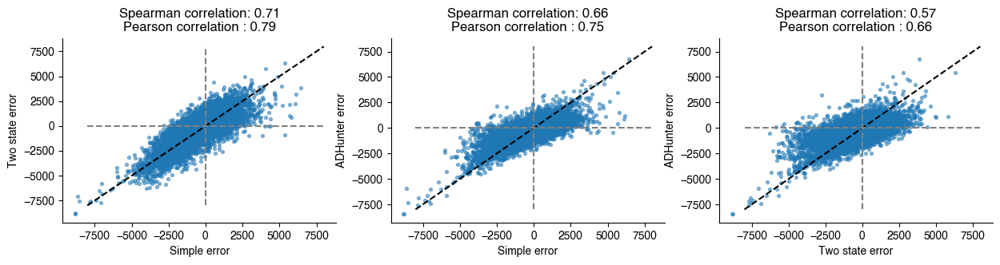

In [35]:
fig, axs = plt.subplots(1, 3, figsize=(15, 3))

# Two state vs. simple
axs[0].scatter(tile_data['simple_error'], tile_data['two_state_error'], s = 8, alpha=0.5)
axs[0].plot([-8000, 8000], [-8000, 8000], linestyle='--', color='black')
axs[0].plot([-8000, 8000], [0, 0], linestyle='--', color='grey')
axs[0].plot([0, 0], [-8000, 8000], linestyle='--', color='grey')

spearman = spearmanr(tile_data.dropna()['simple_error'].astype('float'), tile_data['two_state_error'].dropna().astype('float')).correlation
pearson = pearsonr(tile_data.dropna()['simple_error'].astype('float'), tile_data['two_state_error'].dropna().astype('float')).correlation

axs[0].set_title(f"Spearman correlation: {spearman:.2}\nPearson correlation : {pearson:.2}")
axs[0].set_xlabel("Simple error")
axs[0].set_ylabel("Two state error")


# Simple vs. adhunter
axs[1].scatter(tile_data['simple_error'], tile_data['adhunter_error'], s = 8, alpha=0.5)
axs[1].plot([-8000, 8000], [-8000, 8000], linestyle='--', color='black')
axs[1].plot([-8000, 8000], [0, 0], linestyle='--', color='grey')
axs[1].plot([0, 0], [-8000, 8000], linestyle='--', color='grey')

spearman = spearmanr(tile_data.dropna()['simple_error'].astype('float'), tile_data['adhunter_error'].dropna().astype('float')).correlation
pearson = pearsonr(tile_data.dropna()['simple_error'].astype('float'), tile_data['adhunter_error'].dropna().astype('float')).correlation

axs[1].set_title(f"Spearman correlation: {spearman:.2}\nPearson correlation : {pearson:.2}")
axs[1].set_xlabel("Simple error")
axs[1].set_ylabel("ADHunter error")

# Two state vs. adhunter
axs[2].scatter(tile_data['two_state_error'], tile_data['adhunter_error'], s = 8, alpha=0.5)
axs[2].plot([-8000, 8000], [-8000, 8000], linestyle='--', color='black')
axs[2].plot([-8000, 8000], [0, 0], linestyle='--', color='grey')
axs[2].plot([0, 0], [-8000, 8000], linestyle='--', color='grey')

spearman = spearmanr(tile_data.dropna()['two_state_error'].astype('float'), tile_data['adhunter_error'].dropna().astype('float')).correlation
pearson = pearsonr(tile_data.dropna()['two_state_error'].astype('float'), tile_data['adhunter_error'].dropna().astype('float')).correlation

axs[2].set_title(f"Spearman correlation: {spearman:.2}\nPearson correlation : {pearson:.2}")
axs[2].set_xlabel("Two state error")
axs[2].set_ylabel("ADHunter error")

sns.despine()

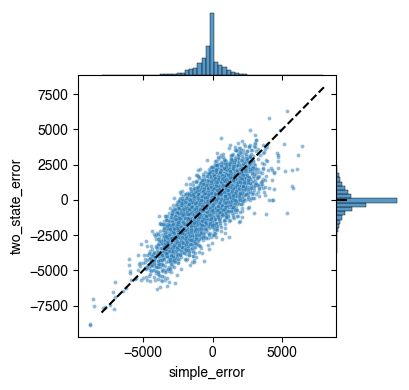

In [50]:
p = sns.jointplot(data=tile_data, x='simple_error', y='two_state_error',
        kind="scatter",
        height=4, ratio=4, space=0,
        s=8, alpha=0.5,
        marginal_kws=dict(bins=np.arange(-8000, 8000, 300))
    )
plt.plot([-8000, 8000], [-8000, 8000], linestyle='--', color='black')

# p.ax_marg_x.vlines(0, 0, 10000, color='black', linestyle='--')
p.ax_marg_y.hlines(0, 0, 1000, color='black')

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


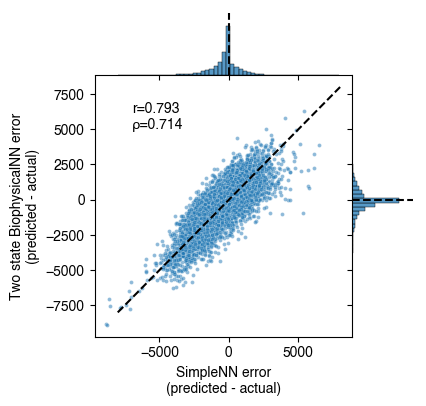

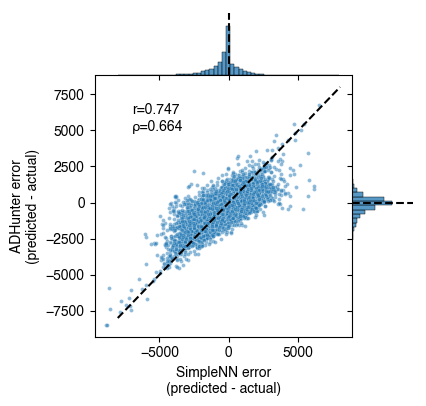

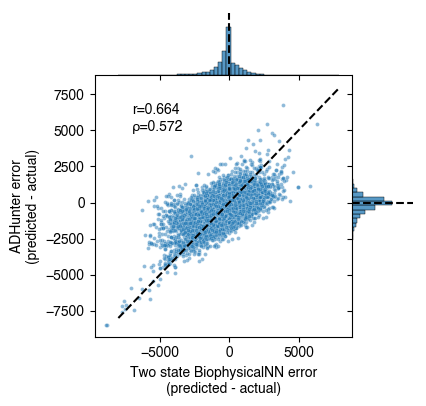

In [54]:
# fig, axs = plt.subplots(1, 3, figsize=(15, 3))

# Two state vs. simple
# axs[0].scatter(tile_data['simple_error'], tile_data['two_state_error'], s = 8, alpha=0.5)
p = sns.jointplot(data=tile_data, x='simple_error', y='two_state_error',
        kind="scatter",
        height=4, ratio=4, space=0,
        s=8, alpha=0.5,
        marginal_kws=dict(bins=np.arange(-8000, 8000, 300))
    )
plt.plot([-8000, 8000], [-8000, 8000], linestyle='--', color='black')

p.ax_marg_x.vlines(0, 0, 7000, color='black', linestyle='--')
p.ax_marg_y.hlines(0, 0, 7000, color='black', linestyle='--')
# plt.plot([-8000, 8000], [0, 0], linestyle='--', color='grey')
# plt.plot([0, 0], [-8000, 8000], linestyle='--', color='grey')

plt.xlabel("SimpleNN error\n(predicted - actual)")
plt.ylabel("Two state BiophysicalNN error\n(predicted - actual)")

spearman = spearmanr(tile_data.dropna()['simple_error'].astype('float'), tile_data['two_state_error'].dropna().astype('float')).correlation
pearson = pearsonr(tile_data.dropna()['simple_error'].astype('float'), tile_data['two_state_error'].dropna().astype('float')).correlation
plt.text(-7000, 5000, f'r={pearson:.3}\n\u03C1={spearman:.3}')

plt.savefig("figures/for_revision/residual_correlation_twostate_simple.pdf", format='pdf', bbox_inches='tight')


p = sns.jointplot(data=tile_data, x='simple_error', y='adhunter_error',
        kind="scatter",
        height=4, ratio=4, space=0,
        s=8, alpha=0.5,
        marginal_kws=dict(bins=np.arange(-8000, 8000, 300))
    )
plt.plot([-8000, 8000], [-8000, 8000], linestyle='--', color='black')
p.ax_marg_x.vlines(0, 0, 7000, color='black', linestyle='--')
p.ax_marg_y.hlines(0, 0, 7000, color='black', linestyle='--')

plt.xlabel("SimpleNN error\n(predicted - actual)")
plt.ylabel("ADHunter error\n(predicted - actual)")

spearman = spearmanr(tile_data.dropna()['simple_error'].astype('float'), tile_data['adhunter_error'].dropna().astype('float')).correlation
pearson = pearsonr(tile_data.dropna()['simple_error'].astype('float'), tile_data['adhunter_error'].dropna().astype('float')).correlation

plt.text(-7000, 5000, f'r={pearson:.3}\n\u03C1={spearman:.3}')
plt.savefig("figures/for_revision/residual_correlation_adhunter_simple.pdf", format='pdf', bbox_inches='tight')

p = sns.jointplot(data=tile_data, x='two_state_error', y='adhunter_error',
        kind="scatter",
        height=4, ratio=4, space=0,
        s=8, alpha=0.5,
        marginal_kws=dict(bins=np.arange(-8000, 8000, 300))
    )
plt.plot([-8000, 8000], [-8000, 8000], linestyle='--', color='black')
p.ax_marg_x.vlines(0, 0, 7000, color='black', linestyle='--')
p.ax_marg_y.hlines(0, 0, 7000, color='black', linestyle='--')

plt.xlabel("Two state BiophysicalNN error\n(predicted - actual)")
plt.ylabel("ADHunter error\n(predicted - actual)")

spearman = spearmanr(tile_data.dropna()['adhunter_error'].astype('float'), tile_data['two_state_error'].dropna().astype('float')).correlation
pearson = pearsonr(tile_data.dropna()['adhunter_error'].astype('float'), tile_data['two_state_error'].dropna().astype('float')).correlation

plt.text(-7000, 5000, f'r={pearson:.3}\n\u03C1={spearman:.3}')
plt.savefig("figures/for_revision/residual_correlation_adhunter_twostate.pdf", format='pdf', bbox_inches='tight')

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


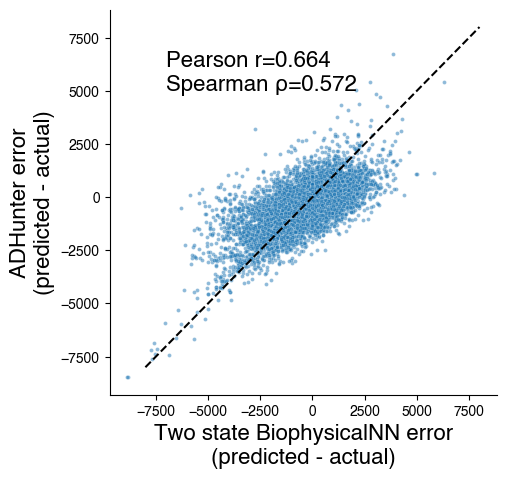

In [79]:
plt.figure(figsize=(5,5))
p = sns.scatterplot(data=tile_data, x='two_state_error', y='adhunter_error',
        s=8, alpha=0.5,
    )
plt.plot([-8000, 8000], [-8000, 8000], linestyle='--', color='black')

plt.xlabel("Two state BiophysicalNN error\n(predicted - actual)", fontsize=16)
plt.ylabel("ADHunter error\n(predicted - actual)", fontsize=16)

spearman = spearmanr(tile_data.dropna()['adhunter_error'].astype('float'), tile_data['two_state_error'].dropna().astype('float')).correlation
pearson = pearsonr(tile_data.dropna()['adhunter_error'].astype('float'), tile_data['two_state_error'].dropna().astype('float')).correlation

plt.text(-7000, 5000, f'Pearson r={pearson:.3}\nSpearman \u03C1={spearman:.3}', fontsize=16)
sns.despine()

plt.savefig("figures/for_revision/residual_correlation_no_hist_adhunter_twostate.pdf", format='pdf', bbox_inches='tight')


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


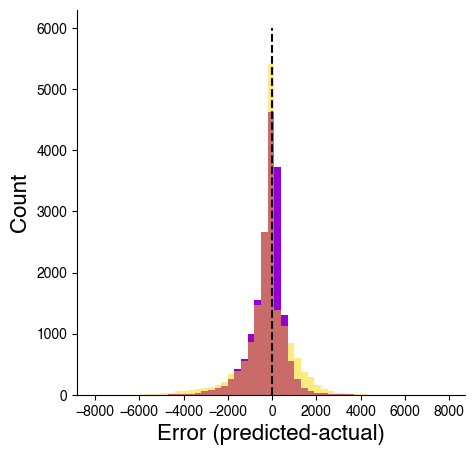

In [81]:
plt.figure(figsize=(5, 5))
plt.hist(tile_data['adhunter_error'], bins=np.arange(-8000, 8000, 300), label='ADHunter', color='darkviolet')
plt.hist(tile_data['two_state_error'], bins=np.arange(-8000, 8000, 300), label='Two state\nBiophysicalNN', color='gold', alpha=0.5)

plt.vlines(0, 0, 6000, linestyles='--', color='black')
# plt.xlabel("Two state BiophysicalNN error\n(predicted - actual)", fontsize=16)
# plt.ylabel("ADHunter error\n(predicted - actual)", fontsize=16)

# plt.legend(frameon=False, fontsize='16')
plt.xlabel("Error (predicted-actual)", fontsize=16)
plt.ylabel("Count", fontsize=16)
sns.despine()

plt.savefig("figures/for_revision/residual_histograms_adhunter_twostate.pdf", format='pdf', bbox_inches='tight')


In [77]:
from scipy import stats
# Predictor - actual
stats.ttest_ind(tile_data['adhunter_error'], tile_data['two_state_error'], equal_var=False)

TtestResult(statistic=0.5876114432062114, pvalue=0.5567972480467394, df=32206.555815923624)

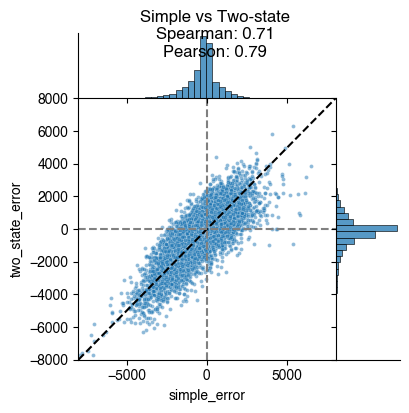

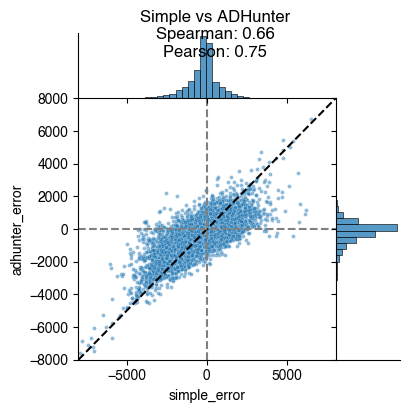

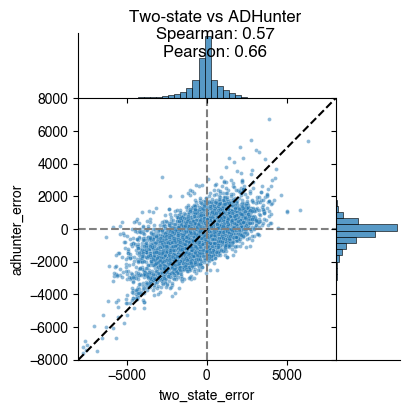

In [482]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr, pearsonr

def joint_scatter_with_hists(df, xcol, ycol, lim=(-8000, 8000), bins=40, title_prefix=""):
    d = df[[xcol, ycol]].dropna()
    d[xcol] = d[xcol].astype(float)
    d[ycol] = d[ycol].astype(float)

    sp = spearmanr(d[xcol], d[ycol]).correlation
    pe = pearsonr(d[xcol], d[ycol]).correlation

    g = sns.jointplot(
        data=d, x=xcol, y=ycol,
        kind="scatter",
        height=4, ratio=4, space=0,
        s=8, alpha=0.5,
        marginal_kws=dict(bins=bins)
    )

    # reference lines on joint axis
    ax = g.ax_joint
    ax.plot(lim, lim, linestyle="--", color="black")
    ax.axhline(0, linestyle="--", color="grey")
    ax.axvline(0, linestyle="--", color="grey")
    ax.set_xlim(*lim)
    ax.set_ylim(*lim)

    g.fig.suptitle(f"{title_prefix}Spearman: {sp:.2}\nPearson: {pe:.2}", y=1.02)
    sns.despine(fig=g.fig)
    return g

joint_scatter_with_hists(tile_data, "simple_error", "two_state_error", title_prefix="Simple vs Two-state\n")
joint_scatter_with_hists(tile_data, "simple_error", "adhunter_error", title_prefix="Simple vs ADHunter\n")
joint_scatter_with_hists(tile_data, "two_state_error", "adhunter_error", title_prefix="Two-state vs ADHunter\n")
plt.show()


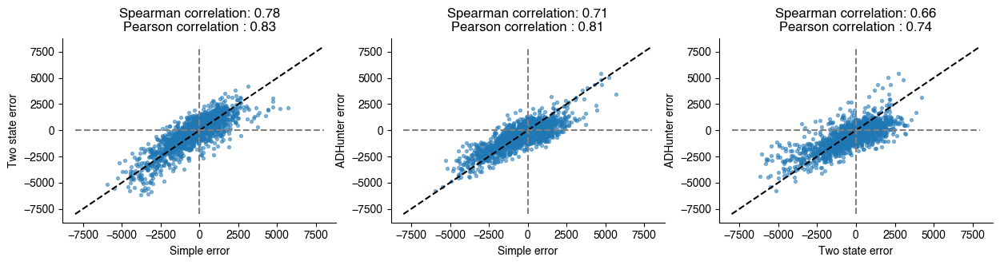

In [51]:
fig, axs = plt.subplots(1, 3, figsize=(15, 3))

# Two state vs. simple
axs[0].scatter(test_tiles['simple_error'], test_tiles['two_state_error'], s = 8, alpha=0.5)
axs[0].plot([-8000, 8000], [-8000, 8000], linestyle='--', color='black')
axs[0].plot([-8000, 8000], [0, 0], linestyle='--', color='grey')
axs[0].plot([0, 0], [-8000, 8000], linestyle='--', color='grey')

spearman = spearmanr(test_tiles.dropna()['simple_error'].astype('float'), test_tiles['two_state_error'].dropna().astype('float')).correlation
pearson = pearsonr(test_tiles.dropna()['simple_error'].astype('float'), test_tiles['two_state_error'].dropna().astype('float')).correlation

axs[0].set_title(f"Spearman correlation: {spearman:.2}\nPearson correlation : {pearson:.2}")
axs[0].set_xlabel("Simple error")
axs[0].set_ylabel("Two state error")

# Simple vs. adhunter
axs[1].scatter(test_tiles['simple_error'], test_tiles['adhunter_error'], s = 8, alpha=0.5)
axs[1].plot([-8000, 8000], [-8000, 8000], linestyle='--', color='black')
axs[1].plot([-8000, 8000], [0, 0], linestyle='--', color='grey')
axs[1].plot([0, 0], [-8000, 8000], linestyle='--', color='grey')

spearman = spearmanr(test_tiles.dropna()['simple_error'].astype('float'), test_tiles['adhunter_error'].dropna().astype('float')).correlation
pearson = pearsonr(test_tiles.dropna()['simple_error'].astype('float'), test_tiles['adhunter_error'].dropna().astype('float')).correlation

axs[1].set_title(f"Spearman correlation: {spearman:.2}\nPearson correlation : {pearson:.2}")
axs[1].set_xlabel("Simple error")
axs[1].set_ylabel("ADHunter error")

# Two state vs. adhunter
axs[2].scatter(test_tiles['two_state_error'], test_tiles['adhunter_error'], s = 8, alpha=0.5)
axs[2].plot([-8000, 8000], [-8000, 8000], linestyle='--', color='black')
axs[2].plot([-8000, 8000], [0, 0], linestyle='--', color='grey')
axs[2].plot([0, 0], [-8000, 8000], linestyle='--', color='grey')

spearman = spearmanr(test_tiles.dropna()['two_state_error'].astype('float'), test_tiles['adhunter_error'].dropna().astype('float')).correlation
pearson = pearsonr(test_tiles.dropna()['two_state_error'].astype('float'), test_tiles['adhunter_error'].dropna().astype('float')).correlation

axs[2].set_title(f"Spearman correlation: {spearman:.2}\nPearson correlation : {pearson:.2}")
axs[2].set_xlabel("Two state error")
axs[2].set_ylabel("ADHunter error")

sns.despine()

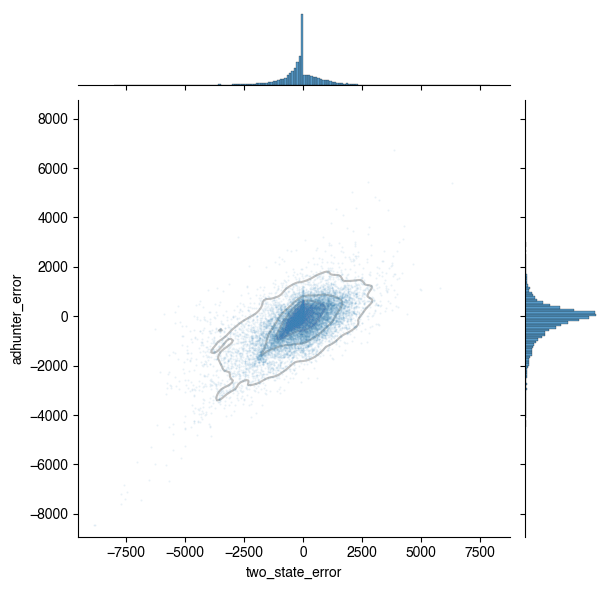

In [32]:
g = sns.jointplot(data=tile_data, x="two_state_error", y="adhunter_error",  s=2, alpha=0.1, marginal_kws=dict(bins=np.arange(-8000, 8000, 100)))
# sns.jointplot(data=tile_data, x="two_state_error", y="adhunter_error",kind='hex')
g.plot_joint(sns.kdeplot, color="grey", zorder=0, levels=6, alpha=0.5)

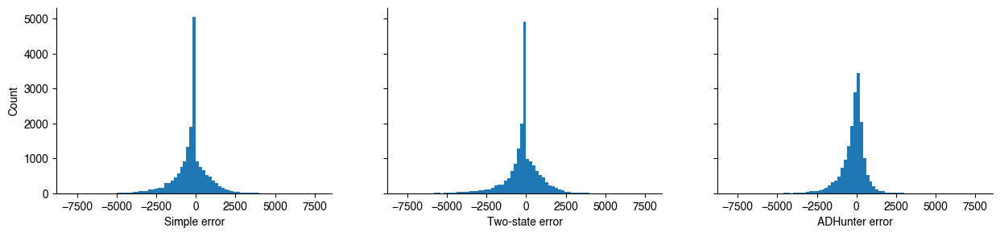

In [514]:
fig, axs = plt.subplots(1, 3, figsize=(15, 3), sharey=True)

axs[0].hist(tile_data['simple_error'], bins=np.arange(-8000, 8000, 200), label="Simple error")
axs[0].set_xlabel("Simple error")
axs[1].hist(tile_data['two_state_error'], bins=np.arange(-8000, 8000, 200), label="Two state error")
axs[1].set_xlabel("Two-state error")
axs[2].hist(tile_data['adhunter_error'], bins=np.arange(-8000, 8000, 200), label="ADHunter error")
axs[2].set_xlabel("ADHunter error")

axs[0].set_ylabel("Count")
sns.despine()

In [55]:
4505.68 + 3365.59 + 3365.59 + 3365.69 + 3245.63 + 4065.77 + 3673.69 + 3673.70 + 3785.6 + 3763.64 + 3785.6 + 3785.6

44381.78

In [511]:
from scipy.stats import skew
from scipy.stats import kurtosis

skew(tile_data['simple_error'])

-0.6476637625725159

In [513]:
kurtosis(tile_data['adhunter_error'], fisher=True) 

9.10741046230905

In [515]:
kurtosis(tile_data['simple_error'], fisher=True) 

4.830950090014239

In [516]:
kurtosis(tile_data['two_state_error'], fisher=True) 

5.014524624085418

In [507]:
skew(tile_data['adhunter_error'])

-1.307079748735634

In [508]:
skew(tile_data['two_state_error'])

-0.9991663436101754

In [510]:
from scipy.stats import normaltest
normaltest(tile_data['adhunter_error'])

NormaltestResult(statistic=6004.882228014989, pvalue=0.0)

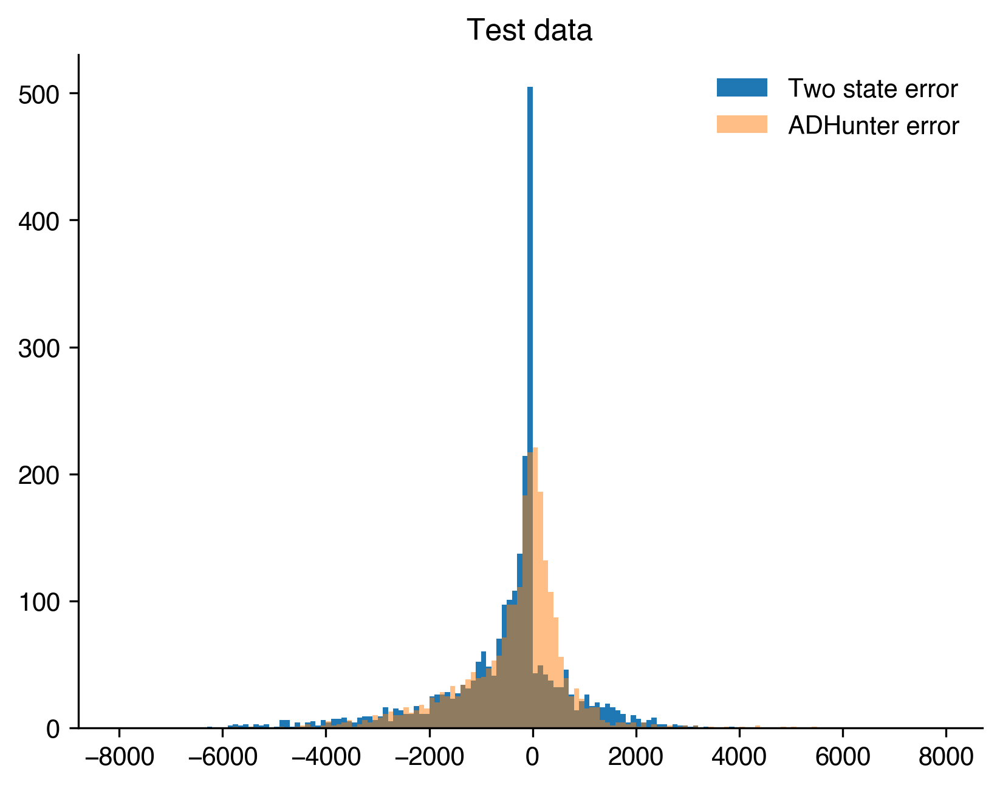

In [18]:
plt.hist(test_tiles['two_state_error'], bins=np.arange(-8000, 8000, 100), label="Two state error")
plt.hist(test_tiles['adhunter_error'], bins=np.arange(-8000, 8000, 100), alpha=0.5, label="ADHunter error")

plt.legend(frameon=False)
plt.title("Test data")
sns.despine()

In [19]:
train_tiles.columns

Index(['aa_seq', 'activity', 'abundance', 'biophysics_gfp_pred',
       'biophysics_cherry_pred', 'adhunter_gfp_pred', 'two_state_error',
       'adhunter_error', 'two_state_abund_error'],
      dtype='object')

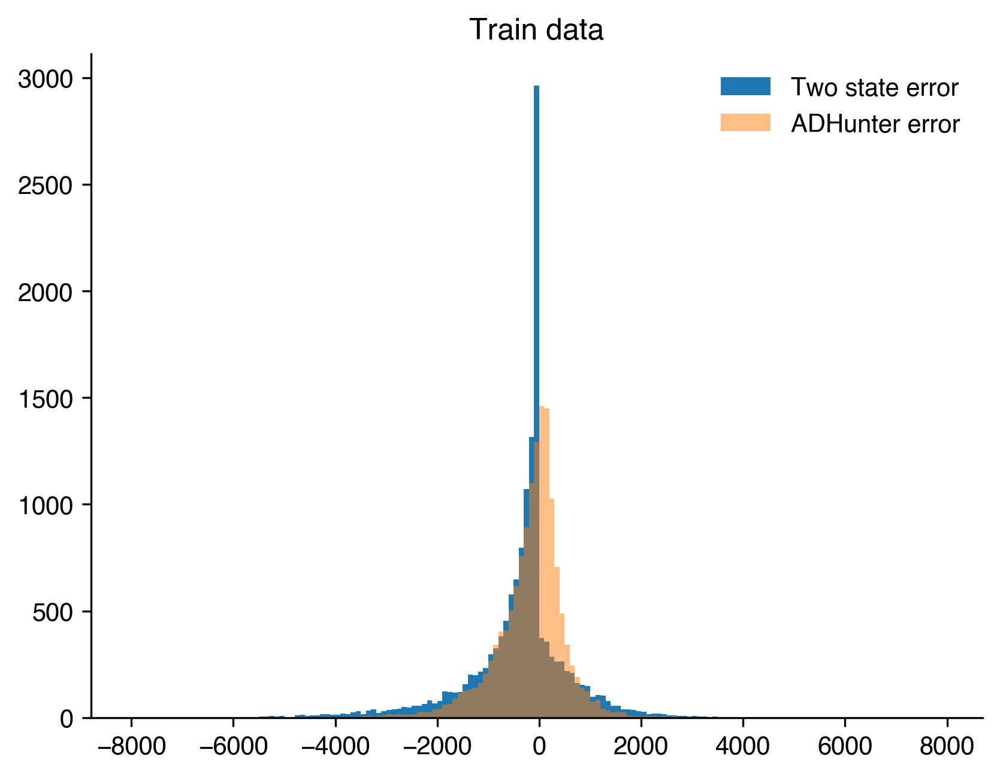

In [21]:
plt.hist(train_tiles['two_state_error'], bins=np.arange(-8000, 8000, 100), label="Two state error")
plt.hist(train_tiles['adhunter_error'], bins=np.arange(-8000, 8000, 100), alpha=0.5, label="ADHunter error")

plt.title("Train data")

plt.legend(frameon=False)
sns.despine()

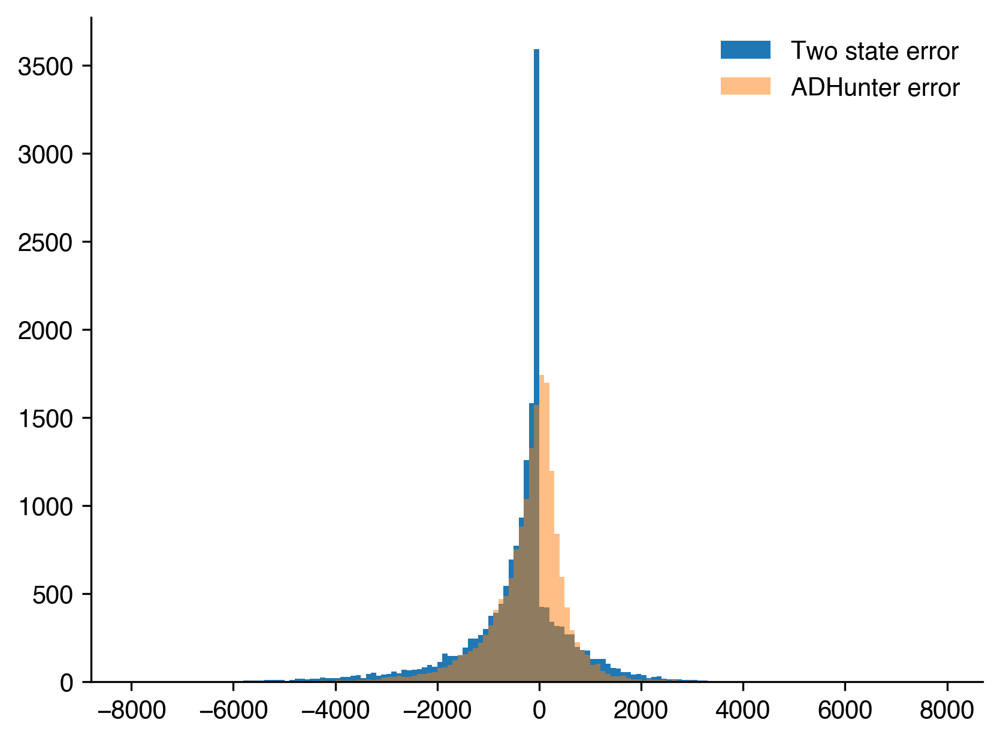

In [22]:
plt.hist(tile_data['two_state_error'], bins=np.arange(-8000, 8000, 100), label="Two state error")
plt.hist(tile_data['adhunter_error'], bins=np.arange(-8000, 8000, 100), alpha=0.5, label="ADHunter error")

plt.legend(frameon=False)
sns.despine()

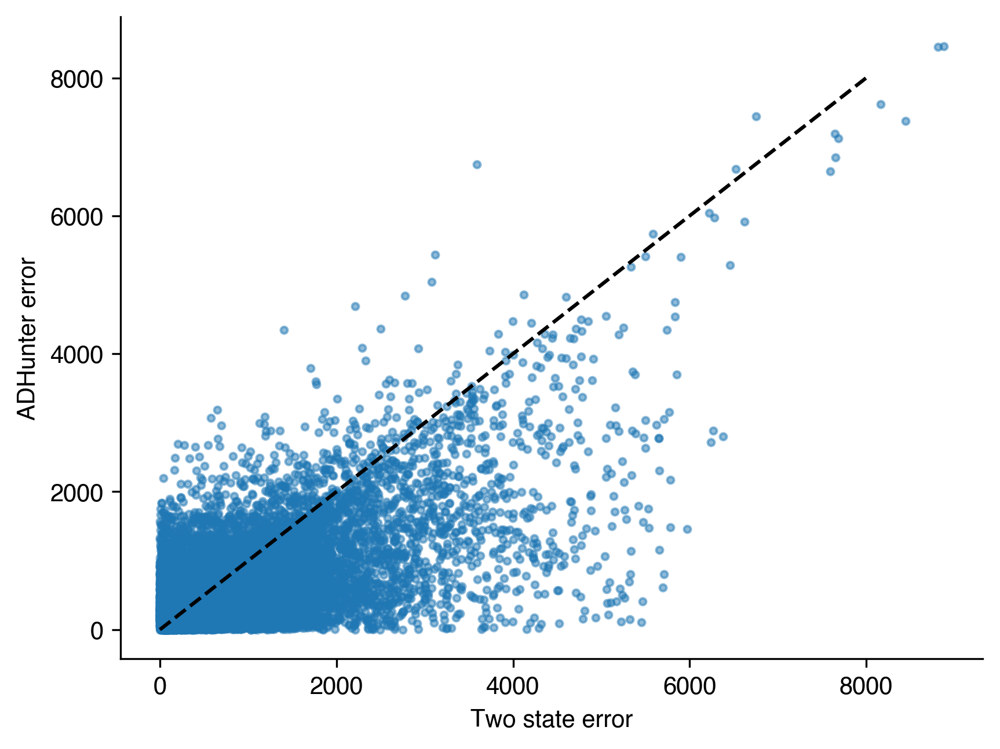

In [23]:
plt.scatter(np.abs(tile_data['two_state_error']), np.abs(tile_data['adhunter_error']), s = 8, alpha=0.5)
plt.plot([0, 8000], [0, 8000], linestyle='--', color='black')
plt.xlabel("Two state error")
plt.ylabel("ADHunter error")
sns.despine()

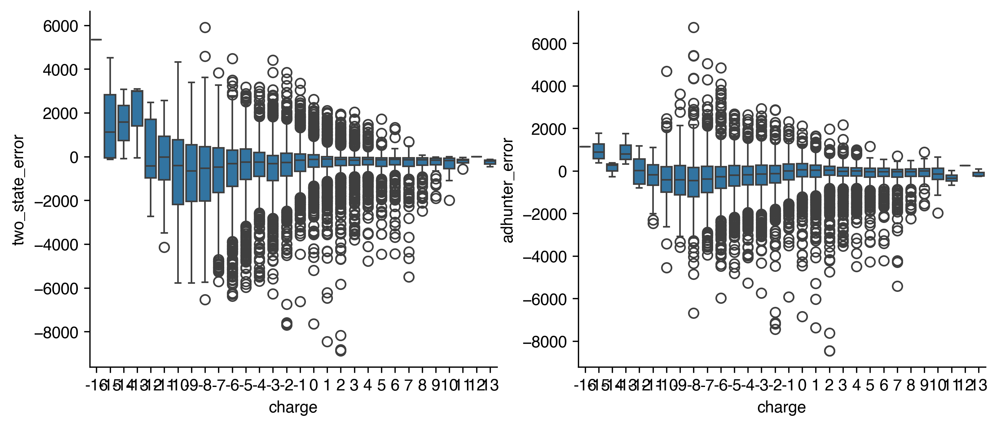

In [24]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

sns.boxplot(data = tile_data, y='two_state_error', x='charge', ax=axs[0])
sns.boxplot(data = tile_data, y='adhunter_error', x='charge', ax=axs[1])
sns.despine()

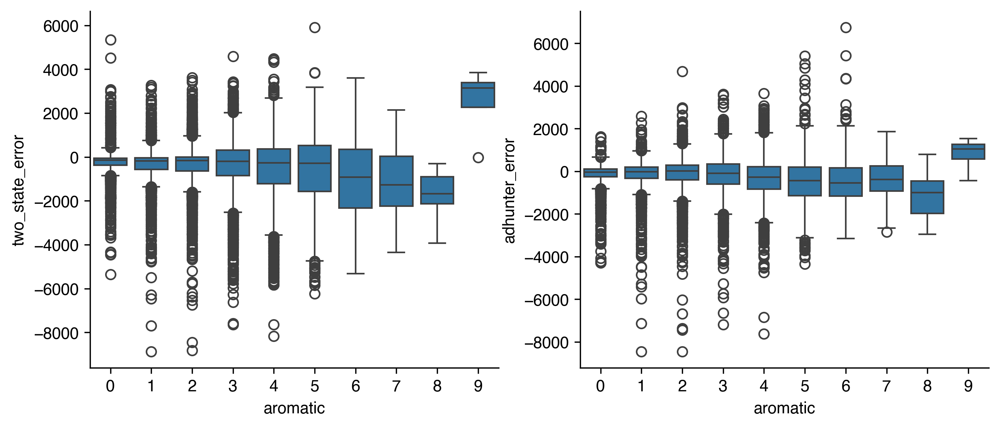

In [25]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

sns.boxplot(data = tile_data, y='two_state_error', x='aromatic', ax=axs[0])
sns.boxplot(data = tile_data, y='adhunter_error', x='aromatic', ax=axs[1])
sns.despine()

In [26]:
fig, axs = plt.subplots(20, 2, figsize=(10, 60))

for i, aa in enumerate('RHKDESTNQCGPAVILMFYW'):
    sns.boxplot(data = tile_data, y='two_state_error', x=aa, ax=axs[i][0])
    sns.boxplot(data = tile_data, y='adhunter_error', x=aa, ax=axs[i][1])

sns.despine()
fig.tight_layout()

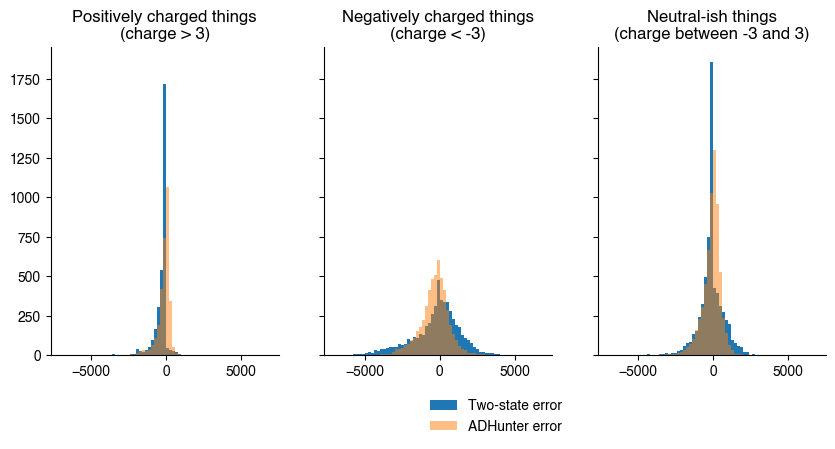

In [73]:
fig, axs = plt.subplots(1, 3, figsize=(10, 4), sharey=True, sharex=True)

axs[0].hist(tile_data[tile_data['charge'] > 3]['two_state_error'], bins = np.arange(-7000, 7000, 200), label = 'Two-state error')
axs[0].hist(tile_data[tile_data['charge'] > 3]['adhunter_error'], bins = np.arange(-7000, 7000, 200), alpha=0.5, label='ADHunter error')
axs[0].set_title("Positively charged things\n(charge > 3)")

axs[1].hist(tile_data[tile_data['charge'] < -3]['two_state_error'], bins = np.arange(-7000, 7000, 200), label = 'Two-state error')
axs[1].hist(tile_data[tile_data['charge'] < -3]['adhunter_error'], bins = np.arange(-7000, 7000, 200), alpha=0.5, label='ADHunter error')
axs[1].set_title("Negatively charged things\n(charge < -3)")

axs[2].hist(tile_data[(tile_data['charge'] < 3) & (tile_data['charge'] > -3)]['two_state_error'], bins = np.arange(-7000, 7000, 200), label = 'Two-state error')
axs[2].hist(tile_data[(tile_data['charge'] < 3) & (tile_data['charge'] > -3)]['adhunter_error'], bins = np.arange(-7000, 7000, 200), alpha=0.5, label='ADHunter error')
axs[2].set_title("Neutral-ish things\n(charge between -3 and 3)")

plt.legend(frameon=False, bbox_to_anchor=(-0.1, -0.1))
sns.despine()

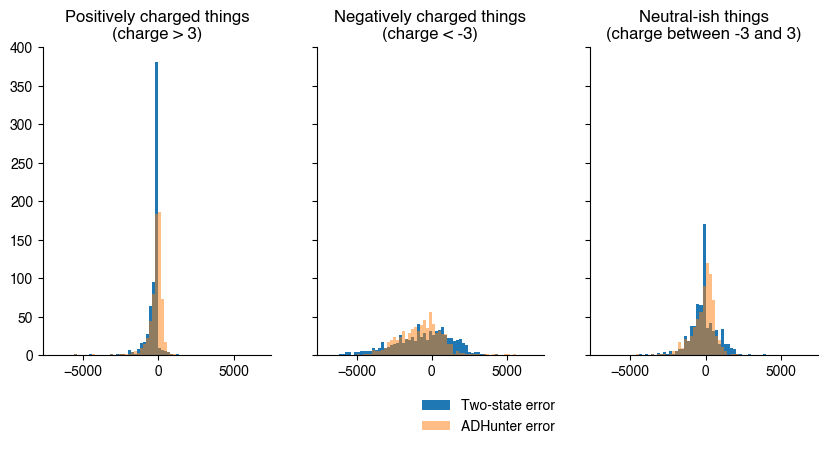

In [74]:
fig, axs = plt.subplots(1, 3, figsize=(10, 4), sharey=True, sharex=True)

axs[0].hist(test_tiles[test_tiles['charge'] > 3]['two_state_error'], bins = np.arange(-7000, 7000, 200), label = 'Two-state error')
axs[0].hist(test_tiles[test_tiles['charge'] > 3]['adhunter_error'], bins = np.arange(-7000, 7000, 200), alpha=0.5, label='ADHunter error')
axs[0].set_title("Positively charged things\n(charge > 3)")

axs[1].hist(test_tiles[test_tiles['charge'] < -3]['two_state_error'], bins = np.arange(-7000, 7000, 200), label = 'Two-state error')
axs[1].hist(test_tiles[test_tiles['charge'] < -3]['adhunter_error'], bins = np.arange(-7000, 7000, 200), alpha=0.5, label='ADHunter error')
axs[1].set_title("Negatively charged things\n(charge < -3)")

axs[2].hist(test_tiles[(test_tiles['charge'] < 3) & (test_tiles['charge'] > -3)]['two_state_error'], bins = np.arange(-7000, 7000, 200), label = 'Two-state error')
axs[2].hist(test_tiles[(test_tiles['charge'] < 3) & (test_tiles['charge'] > -3)]['adhunter_error'], bins = np.arange(-7000, 7000, 200), alpha=0.5, label='ADHunter error')
axs[2].set_title("Neutral-ish things\n(charge between -3 and 3)")

plt.legend(frameon=False, bbox_to_anchor=(-0.1, -0.1))
sns.despine()

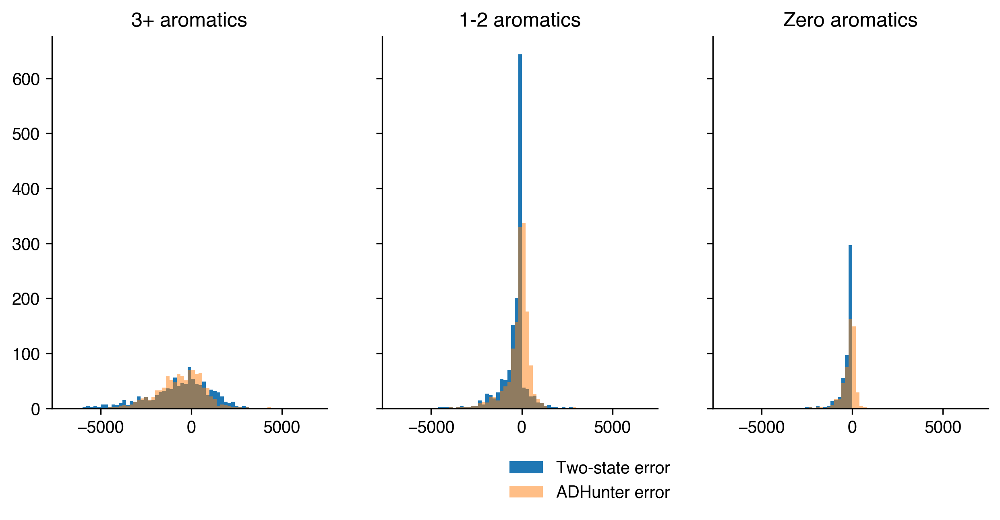

In [29]:
fig, axs = plt.subplots(1, 3, figsize=(10, 4), sharey=True, sharex=True)

axs[0].hist(test_tiles[test_tiles['aromatic'] >= 3]['two_state_error'], bins = np.arange(-7000, 7000, 200), label = 'Two-state error')
axs[0].hist(test_tiles[test_tiles['aromatic'] >= 3]['adhunter_error'], bins = np.arange(-7000, 7000, 200), alpha=0.5, label='ADHunter error')
axs[0].set_title("3+ aromatics")

axs[1].hist(test_tiles[test_tiles['aromatic'] < 3]['two_state_error'], bins = np.arange(-7000, 7000, 200), label = 'Two-state error')
axs[1].hist(test_tiles[test_tiles['aromatic'] < 3]['adhunter_error'], bins = np.arange(-7000, 7000, 200), alpha=0.5, label='ADHunter error')
axs[1].set_title("1-2 aromatics")

axs[2].hist(test_tiles[(test_tiles['aromatic'] < 1) & (test_tiles['aromatic'] < 1)]['two_state_error'], bins = np.arange(-7000, 7000, 200), label = 'Two-state error')
axs[2].hist(test_tiles[(test_tiles['aromatic'] < 1) & (test_tiles['aromatic'] < 1)]['adhunter_error'], bins = np.arange(-7000, 7000, 200), alpha=0.5, label='ADHunter error')
axs[2].set_title("Zero aromatics")

plt.legend(frameon=False, bbox_to_anchor=(-0.1, -0.1))
sns.despine()

In [30]:
sum(test_tiles['charge'] < -3)

791

In [31]:
len(test_tiles)

2916

Text(0, 0.5, 'Predicted')

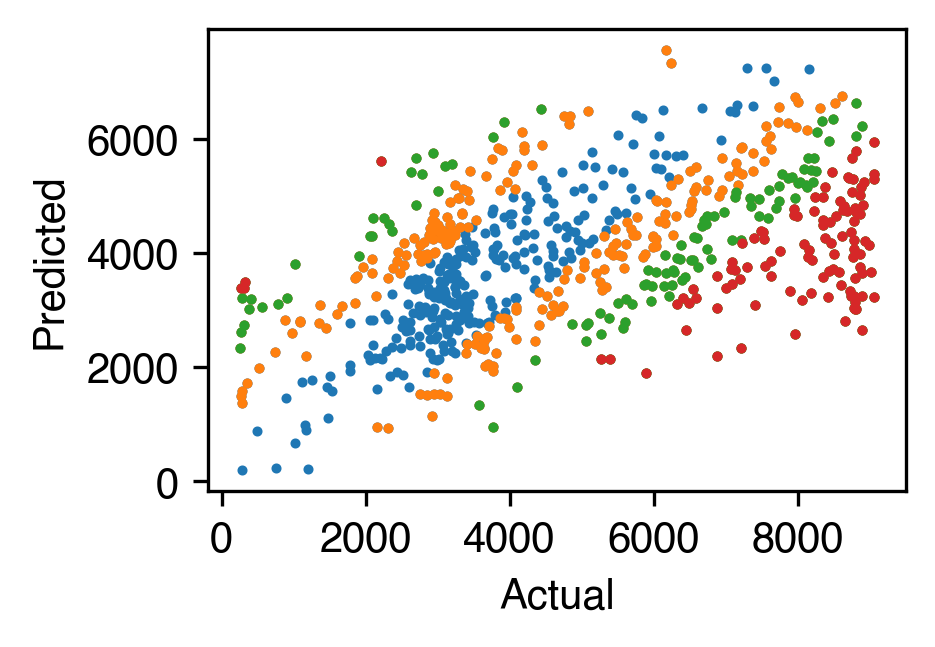

In [32]:
fig, axs = plt.subplots(1, 1, figsize=(3, 2))

# axs.scatter(test_tiles['activity'], test_tiles['biophysics_gfp_pred'], s=2)
axs.scatter(test_tiles[(test_tiles['charge'] < -3)]['activity'], test_tiles[(test_tiles['charge'] < -3)]['biophysics_gfp_pred'], s=2, label = 'Negative sequences')
# axs.scatter(test_tiles[(test_tiles['charge'] > 3)]['activity'], test_tiles[(test_tiles['charge'] > 3)]['biophysics_gfp_pred'], s=2, label='Positive sequences')

axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 1000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 1000)]['biophysics_gfp_pred'], s=2)
axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 2000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 2000)]['biophysics_gfp_pred'], s=2)
axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 3000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 3000)]['biophysics_gfp_pred'], s=2)


plt.xlabel("Actual")
plt.ylabel("Predicted")

In [33]:
test_tiles.columns

Index(['aa_seq', 'activity', 'abundance', 'biophysics_gfp_pred',
       'biophysics_cherry_pred', 'adhunter_gfp_pred', 'charge', 'aromatic',
       'positive', 'negative', 'R', 'H', 'K', 'D', 'E', 'S', 'T', 'N', 'Q',
       'C', 'G', 'P', 'A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W',
       'two_state_error', 'adhunter_error', 'two_state_abund_error'],
      dtype='object')

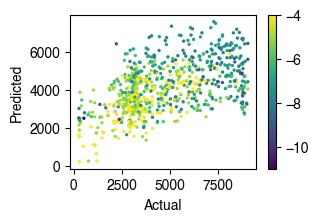

In [75]:
fig, axs = plt.subplots(1, 1, figsize=(3, 2))

# axs.scatter(test_tiles['activity'], test_tiles['biophysics_gfp_pred'], s=2)
plt.scatter(test_tiles[(test_tiles['charge'] < -3)]['activity'], test_tiles[(test_tiles['charge'] < -3)]['biophysics_gfp_pred'], s=2, label = 'Negative sequences', c=test_tiles[(test_tiles['charge'] < -3)]['charge'])
# axs.scatter(test_tiles[(test_tiles['charge'] > 3)]['activity'], test_tiles[(test_tiles['charge'] > 3)]['biophysics_gfp_pred'], s=2, label='Positive sequences')

# axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 1000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 1000)]['biophysics_gfp_pred'], s=2)
# axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 2000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 2000)]['biophysics_gfp_pred'], s=2)
# axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 3000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 3000)]['biophysics_gfp_pred'], s=2)


plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.colorbar()

In [35]:
test_tiles

,aa_seq,activity,abundance,biophysics_gfp_pred,biophysics_cherry_pred,adhunter_gfp_pred,charge,aromatic,positive,negative,...,V,I,L,M,F,Y,W,two_state_error,adhunter_error,two_state_abund_error
0,MSTPNIAQDFPELFDLQSNRFGDDFSSPESTMLSPQISNS,2482.128691,4026.225387,3651.711426,4146.784180,3324.304199,-5,4,6,1,...,0,2,3,2,4,0,0,1169.582735,842.175508,120.558792
1,IAQDFPELFDLQSNRFGDDFSSPESTMLSPQISNSIFSQM,6522.143171,2756.372474,4837.012207,4020.703857,4407.241699,-5,5,6,1,...,0,3,3,2,5,0,0,-1685.130964,-2114.901471,1264.331383
2,PELFDLQSNRFGDDFSSPESTMLSPQISNSIFSQMGDAAP,3220.004056,1295.197147,3657.963135,4834.084473,2631.291260,-5,4,6,1,...,0,2,3,2,4,0,0,437.959079,-588.712796,3538.887326
3,LQSNRFGDDFSSPESTMLSPQISNSIFSQMGDAAPPGTVS,2841.993646,915.253034,2202.055176,3248.890869,1706.356567,-3,3,4,1,...,1,2,2,2,3,0,0,-639.938470,-1135.637079,2333.637835
4,FGDDFSSPESTMLSPQISNSIFSQMGDAAPPGTVSPRDLF,3300.277866,2764.618359,4057.855469,4402.168945,3083.325195,-4,4,5,1,...,1,2,2,2,4,0,0,757.577603,-216.952671,1637.550587
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4131,VDPSDPVALKRARNTEAARKSRARKLERQDEMERRIRELE,561.411852,3454.694625,170.606155,5863.486816,382.661316,3,0,9,12,...,2,1,3,1,0,0,0,-390.805697,-178.750536,2408.792192
4132,PVALKRARNTEAARKSRARKLERQDEMERRIRELEKSLEE,270.500000,2577.606144,178.624954,5165.125977,375.633972,4,0,9,13,...,1,1,4,1,0,0,0,-91.875046,105.133972,2587.519832
4133,RARNTEAARKSRARKLERQDEMERRIRELEKSLEEAQQRE,NaN,NaN,145.675369,6572.989258,250.065506,3,0,10,13,...,0,1,3,1,0,0,0,NaN,NaN,NaN
4134,EAARKSRARKLERQDEMERRIRELEKSLEEAQQREQYWKA,459.367480,3424.386384,209.186188,5769.229492,579.904968,2,1,10,12,...,0,1,3,1,0,1,1,-250.181292,120.537488,2344.843108


/var/folders/34/1pw3__x51kdfyh3vk72f5vc80000gn/T/ipykernel_46632/1327555243.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Text(0, 0.5, 'Abundance error')

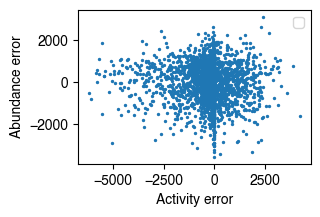

In [76]:
fig, axs = plt.subplots(1, 1, figsize=(3, 2))

# axs.scatter(test_tiles['activity'], test_tiles['biophysics_gfp_pred'], s=2)
# plt.scatter(test_tiles['activity'], test_tiles['two_state_error'], s=2, label = 'Two-state')
# plt.scatter(test_tiles['activity'], test_tiles['adhunter_error'], s=2, label = 'ADHunter')
plt.scatter(test_tiles['two_state_error'], test_tiles['two_state_abund_error'], s=2) #label = 'abundance error')
plt.legend()
# axs.scatter(test_tiles[(test_tiles['charge'] > 3)]['activity'], test_tiles[(test_tiles['charge'] > 3)]['biophysics_gfp_pred'], s=2, label='Positive sequences')

# axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 1000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 1000)]['biophysics_gfp_pred'], s=2)
# axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 2000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 2000)]['biophysics_gfp_pred'], s=2)
# axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 3000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 3000)]['biophysics_gfp_pred'], s=2)


plt.xlabel("Activity error")
plt.ylabel("Abundance error")
# plt.colorbar()

In [37]:
two_state_errors = pd.DataFrame(test_tiles.groupby(['F', 'charge'])['two_state_error'].mean())

In [38]:
adhunter_errors = pd.DataFrame(test_tiles.groupby(['F', 'charge'])['adhunter_error'].mean())

In [39]:
both_errors = two_state_errors.merge(adhunter_errors, right_index=True, left_index=True)
both_errors['diff'] = np.abs(both_errors['two_state_error'] - both_errors['adhunter_error'])
both_errors.sort_values('diff', ascending=False).head()

,,two_state_error,adhunter_error,diff
F,charge,,,
2,-9,-3832.411470,-1596.033003,2236.378467
3,-9,-3277.330268,-1642.065406,1635.264862
6,-7,-1666.085086,-301.422814,1364.662272
0,-5,-524.616371,780.317146,1304.933517
2,-8,-2282.134286,-1071.439307,1210.694980


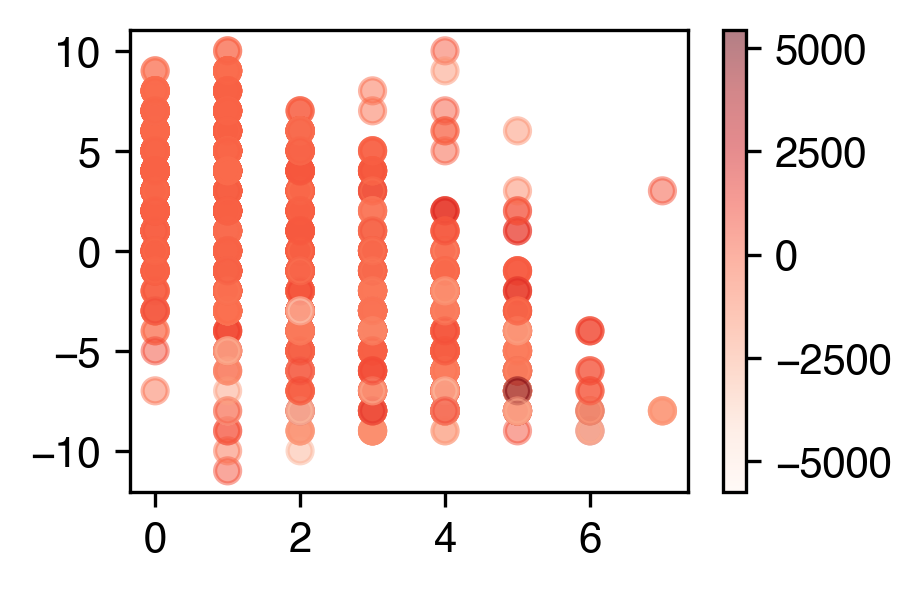

In [40]:
fig, axs = plt.subplots(1, 1, figsize=(3, 2))
plt.scatter(test_tiles['F'], test_tiles['charge'], c=test_tiles['adhunter_error'], alpha=0.5, cmap='Reds')

plt.colorbar()

Text(0.5, 0, 'Error')

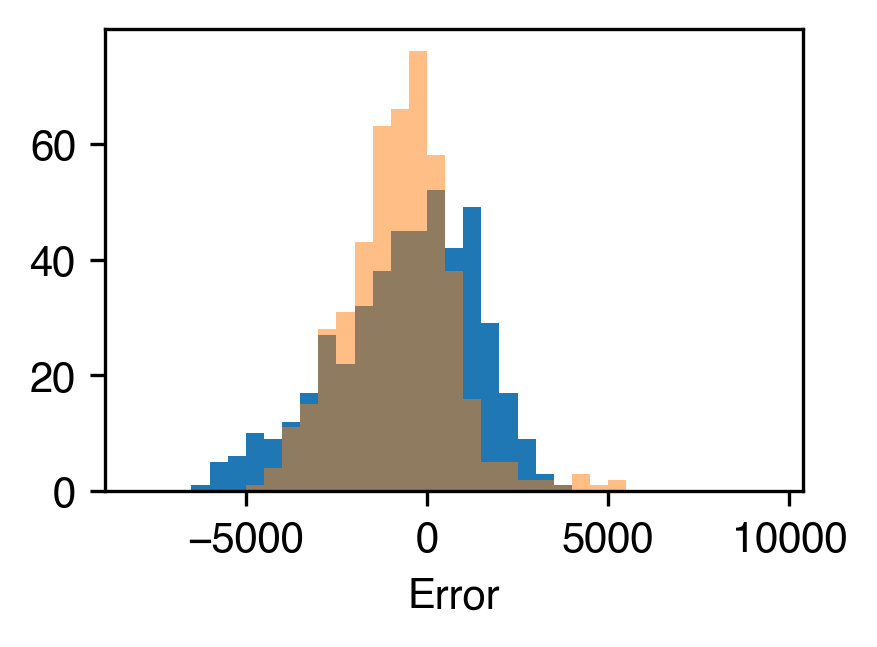

In [41]:
fig, axs = plt.subplots(1, 1, figsize=(3, 2))

# # axs.scatter(test_tiles['activity'], test_tiles['biophysics_gfp_pred'], s=2)
# # plt.scatter(test_tiles['activity'], test_tiles['two_state_error'], s=2, label = 'Two-state')
# # plt.scatter(test_tiles['activity'], test_tiles['adhunter_error'], s=2, label = 'ADHunter')
# plt.scatter(test_tiles['two_state_error'], test_tiles['two_state_abund_error'], s=2) #label = 'abundance error')
# plt.legend()
# axs.hist(test_tiles[(test_tiles['charge'] < -3)]['biophysics_gfp_pred'],bins=np.arange(0, 10000, 500), label="Two state")
# axs.hist(test_tiles[(test_tiles['charge'] <- 3)]['adhunter_gfp_pred'], bins=np.arange(0, 10000, 500), alpha=0.5, label='adhunter')

axs.hist(test_tiles[(test_tiles['F'] > 3)]['two_state_error'],bins=np.arange(-8000, 10000, 500), label="Two state")
axs.hist(test_tiles[(test_tiles['F'] > 3)]['adhunter_error'], bins=np.arange(-8000, 10000, 500), alpha=0.5, label='adhunter')
# axs.scatter(test_tiles[(test_tiles['F'] > 3)]['two_state_error'],test_tiles[(test_tiles['F'] > 3)]['adhunter_error'], label="Two state", s=3)

# axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 1000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 1000)]['biophysics_gfp_pred'], s=2)
# axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 2000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 2000)]['biophysics_gfp_pred'], s=2)
# axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 3000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 3000)]['biophysics_gfp_pred'], s=2)

# plt.plot([-5000, 7000], [-5000, 7000], c='black', linestyle='--')

plt.xlabel("Error")
# plt.ylabel("Error")
# plt.legend()
# plt.colorbar()

In [42]:
test_tiles.columns

Index(['aa_seq', 'activity', 'abundance', 'biophysics_gfp_pred',
       'biophysics_cherry_pred', 'adhunter_gfp_pred', 'charge', 'aromatic',
       'positive', 'negative', 'R', 'H', 'K', 'D', 'E', 'S', 'T', 'N', 'Q',
       'C', 'G', 'P', 'A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W',
       'two_state_error', 'adhunter_error', 'two_state_abund_error'],
      dtype='object')

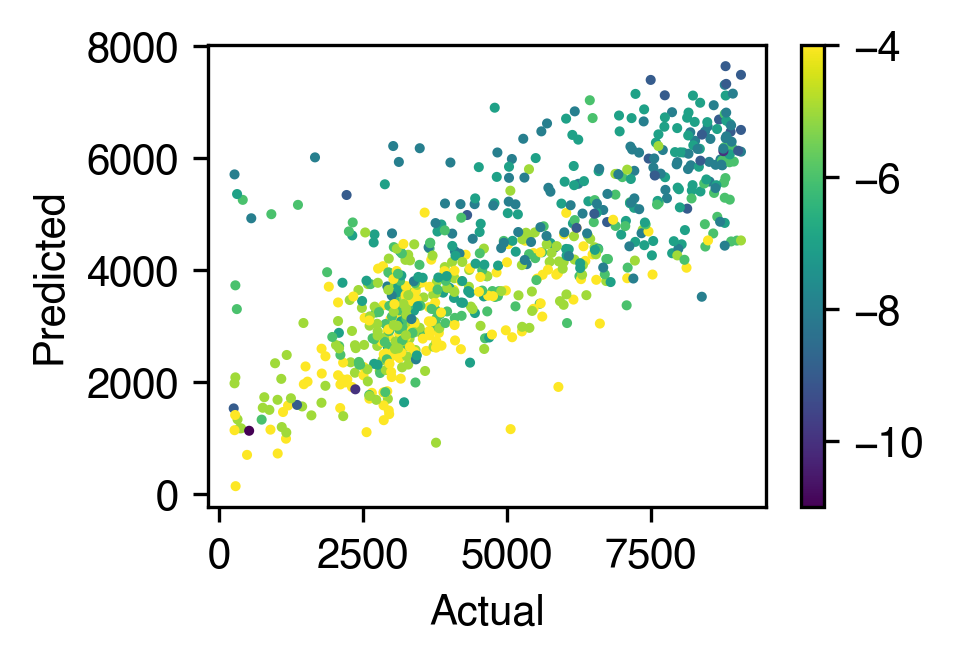

In [43]:
fig, axs = plt.subplots(1, 1, figsize=(3, 2))

# axs.scatter(test_tiles['activity'], test_tiles['biophysics_gfp_pred'], s=2)
plt.scatter(test_tiles[(test_tiles['charge'] < -3)]['activity'], test_tiles[(test_tiles['charge'] < -3)]['adhunter_gfp_pred'], s=2, label = 'Negative sequences', c=test_tiles[(test_tiles['charge'] < -3)]['charge'])
# axs.scatter(test_tiles[(test_tiles['charge'] > 3)]['activity'], test_tiles[(test_tiles['charge'] > 3)]['biophysics_gfp_pred'], s=2, label='Positive sequences')

# axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 1000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 1000)]['biophysics_gfp_pred'], s=2)
# axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 2000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 2000)]['biophysics_gfp_pred'], s=2)
# axs.scatter(test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 3000)]['activity'], test_tiles[(test_tiles['charge'] < -3) & (np.abs(test_tiles['two_state_error']) > 3000)]['biophysics_gfp_pred'], s=2)


plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.colorbar()

In [44]:
interesting_subset_higher = tile_data[(tile_data['adhunter_error'] < 100) & (tile_data['adhunter_error'] > -100) & ((tile_data['two_state_error'] > 1000) )]
interesting_subset_lower = tile_data[(tile_data['adhunter_error'] < 100) & (tile_data['adhunter_error'] > -100) & ((tile_data['two_state_error'] < -1000))]

both_close = tile_data[(tile_data['adhunter_error'] < 100) & (tile_data['adhunter_error'] > -100) & (tile_data['two_state_error'] > -1000)& (tile_data['two_state_error'] < 1000)]

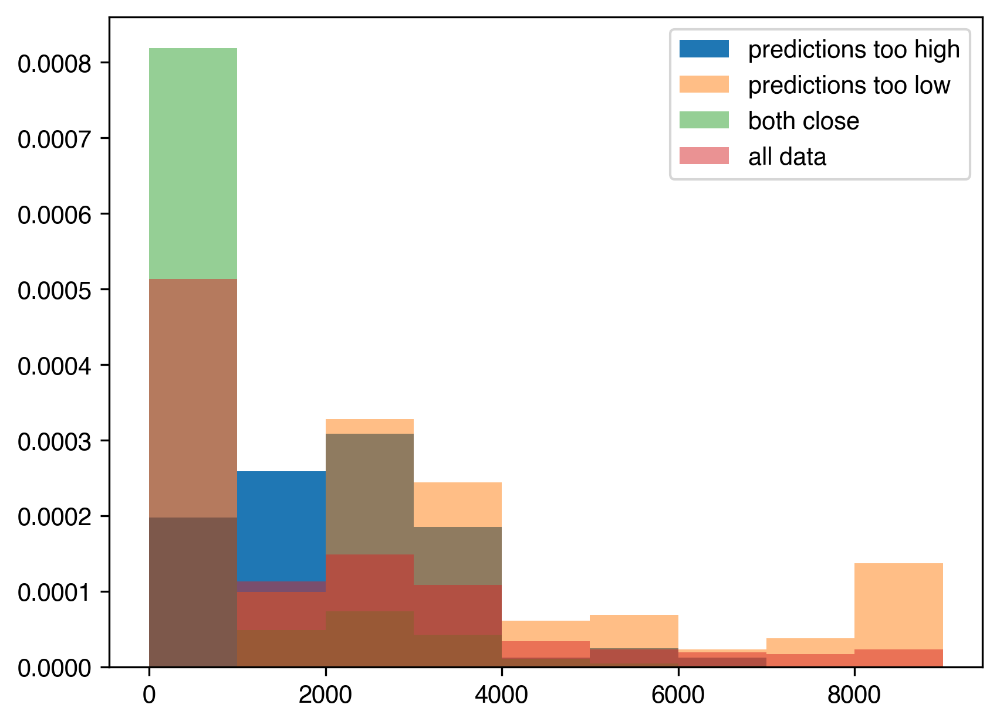

In [45]:
bins = np.arange(0, 10000, 1000)
plt.hist(interesting_subset_higher['activity'], density=True, bins=bins, label='predictions too high')
plt.hist(interesting_subset_lower['activity'], density=True, alpha=0.5, bins=bins, label='predictions too low')
plt.hist(both_close['activity'], density=True, alpha=0.5, bins=bins, label='both close')
plt.hist(tile_data['activity'], density=True, alpha=0.5, bins=bins, label='all data')
plt.legend()

In [46]:
interesting_subset_higher['negative'].value_counts()

negative
0    34
1    24
2    11
4     6
7     3
3     3
Name: count, dtype: int64

In [47]:
interesting_subset_lower['negative'].value_counts()

negative
0    48
1    36
2    24
3    13
4     4
5     4
6     1
9     1
Name: count, dtype: int64

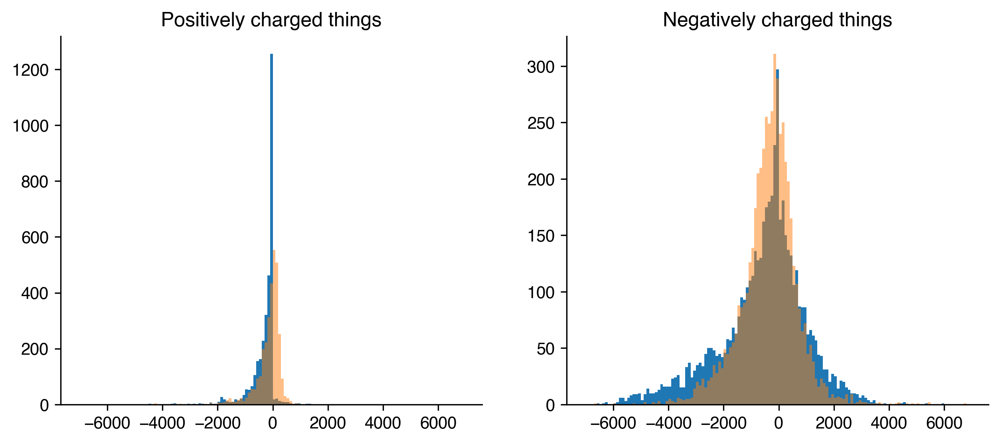

In [48]:
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

axs[0].hist(tile_data[tile_data['charge'] > 3]['two_state_error'], bins = np.arange(-7000, 7000, 100))
axs[0].hist(tile_data[tile_data['charge'] > 3]['adhunter_error'], bins = np.arange(-7000, 7000, 100), alpha=0.5)
axs[0].set_title("Positively charged things")

axs[1].hist(tile_data[tile_data['charge'] < -3]['two_state_error'], bins = np.arange(-7000, 7000, 100))
axs[1].hist(tile_data[tile_data['charge'] < -3]['adhunter_error'], bins = np.arange(-7000, 7000, 100), alpha=0.5)
axs[1].set_title("Negatively charged things")

sns.despine()

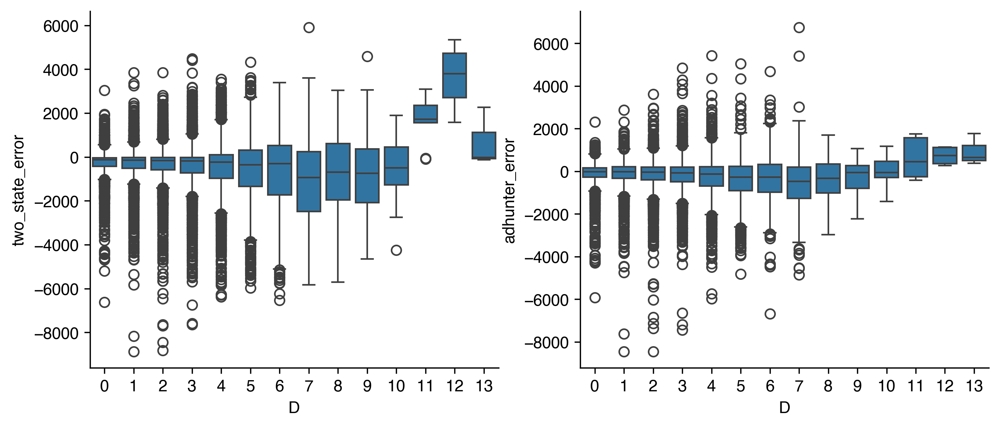

In [49]:
# Hypothesis: ADHunter weights negative charge less than two-state
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

sns.boxplot(data = tile_data, y='two_state_error', x='D', ax=axs[0])
sns.boxplot(data = tile_data, y='adhunter_error', x='D', ax=axs[1])
sns.despine()

In [50]:
tile_data.columns

Index(['aa_seq', 'activity', 'abundance', 'ratio', 'biophysics_gfp_pred',
       'biophysics_cherry_pred', 'adhunter_gfp_pred', 'charge', 'aromatic',
       'positive', 'negative', 'R', 'H', 'K', 'D', 'E', 'S', 'T', 'N', 'Q',
       'C', 'G', 'P', 'A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W',
       'two_state_error', 'two_state_abund_error', 'adhunter_error'],
      dtype='object')

In [51]:
tile_data.sort_values('adhunter_gfp_pred')

,aa_seq,activity,abundance,ratio,biophysics_gfp_pred,biophysics_cherry_pred,adhunter_gfp_pred,charge,aromatic,positive,...,V,I,L,M,F,Y,W,two_state_error,two_state_abund_error,adhunter_error
1686,MIEEAKLSQTNNNNNMKKQGKVSKKNNNSSSPGVKVDHLG,270.500000,2763.247331,21331.143992,196.566986,4667.400391,-151.243698,4,0,3,...,3,1,2,2,0,0,0,-73.933014,1904.153060,-421.743698
8770,FPQNYPKKLSNRLPATTAKGPALQRKKRPQNQSERHLPTT,620.345055,1659.970004,21984.012751,186.320770,4616.190430,-104.259323,8,1,1,...,0,0,4,0,1,1,0,-434.024285,2956.220425,-724.604378
226,FPQDNNVAPAQPTSVENSPELKSDEVDSDNQSPAPSRRKS,359.532351,3370.617217,17630.458874,181.102966,8238.404297,-83.320847,-3,1,7,...,3,0,1,0,1,0,0,-178.429385,4867.787080,-442.853198
2159,TSSFNHRQASTSYQFTPTQPQDNSIRTPESRQISQQQQQQ,393.559153,2193.774351,23574.411020,196.604431,6591.909180,-80.619064,1,2,2,...,0,2,0,0,2,1,0,-196.954722,4398.134828,-474.178218
3918,NSAKFARPFVFNAPTASPHISSPSLANNNTNNKRKRQEST,639.698306,1838.644448,31876.274433,207.130249,6088.553711,-72.381638,5,3,1,...,1,1,1,0,3,0,0,-432.568057,4249.909263,-712.079944
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11844,MKTFDPEVAFEEWFLSTDYQGLPSDFSPLTGVHDTSSPSI,8804.199914,2256.148632,261684.199744,4038.280518,3775.276611,9281.284180,-6,5,7,...,2,1,3,1,4,1,1,-4765.919397,1519.127979,477.084265
14022,EQNMKTFDPEVAFEEWFLSTDYQGLPSDFSPLTGVHDTSS,8278.625102,1741.631006,261248.464463,4054.627197,3891.896240,9325.367188,-7,5,8,...,2,0,3,1,4,1,1,-4223.997904,2150.265234,1046.742086
17716,YTIEQNMKTFDPEVAFEEWFLSTDYQGLPSDFSPLTGVHD,9064.000000,2543.811633,262143.000000,3801.887207,3399.405029,9519.898438,-7,5,8,...,2,1,3,1,4,2,1,-5262.112793,855.593396,455.898438
15458,VSPEELFSTPLETDLSPLFDDIDVGVDAANWDSLFDEVPA,8882.271927,1071.543268,215173.626867,5391.278809,4710.665527,9896.364258,-11,4,11,...,4,1,5,0,3,0,1,-3490.993118,3639.122259,1014.092331


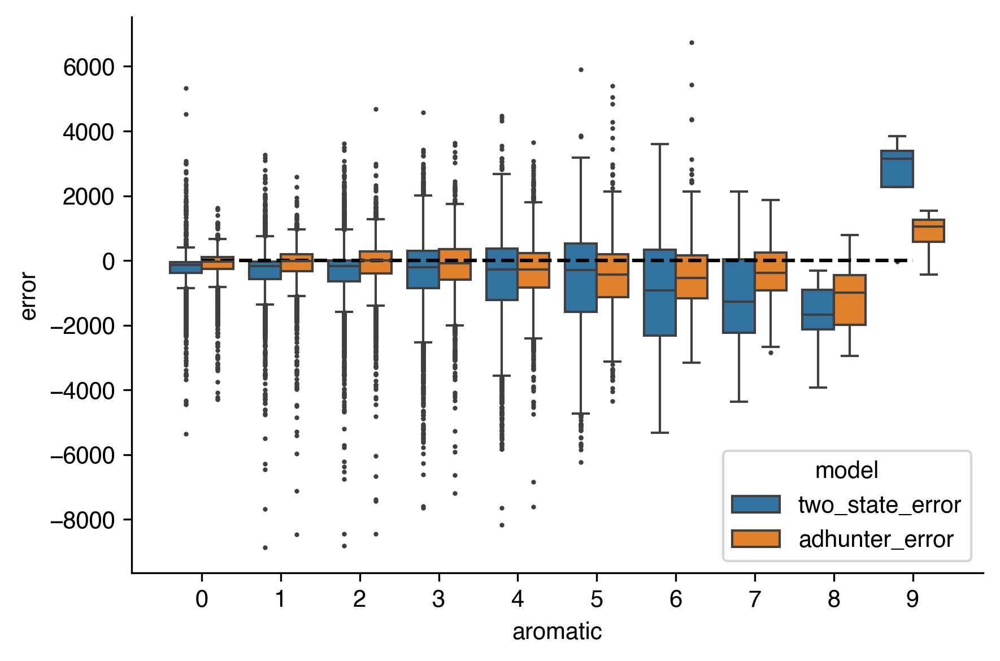

In [52]:
# reshape to long format
long_df = tile_data.melt(
    id_vars='aromatic',
    value_vars=['two_state_error', 'adhunter_error'],
    var_name='model',
    value_name='error'
)

plt.figure(figsize=(6, 4))
sns.boxplot(
    data=long_df,
    x='aromatic',
    y='error',
    hue='model',
    fliersize=1
)

plt.hlines(0, 0, 9, linestyles='--', color='black')
sns.despine()
plt.tight_layout()


In [95]:
from sklearn.linear_model import LinearRegression
lin_reg = LinearRegression()

lin_reg.fit(tile_data['activity'].values.reshape((-1, 1)), tile_data['simple_error'].values.reshape((-1, 1)))

LinearRegression()

In [97]:
r_sq = lin_reg.score(tile_data['activity'].values.reshape((-1, 1)), tile_data['simple_error'].values.reshape((-1, 1)))
print(f"Coefficient of determination (R^2): {r_sq}")
print(f"Intercept: {lin_reg.intercept_}")
print(f"Slope (Coefficient): {lin_reg.coef_}")


Coefficient of determination (R^2): 0.2967479017761404
Intercept: [272.331]
Slope (Coefficient): [[-0.293]]


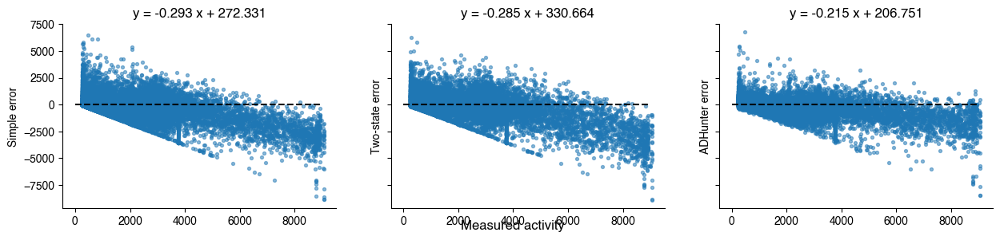

In [113]:
fig, axs = plt.subplots(1, 3, figsize=(15, 3), sharey=True)

axs[0].scatter(tile_data['activity'], tile_data['simple_error'], s=8, alpha=0.5)
axs[0].set_ylabel("Simple error")
lin_reg.fit(tile_data['activity'].values.reshape((-1, 1)), tile_data['simple_error'].values.reshape((-1, 1)))
axs[0].set_title(f"y = {lin_reg.coef_[0][0]:.3f} x + {lin_reg.intercept_[0]:.3f}")
axs[0].hlines(0, xmin=0, xmax=9000, color='black', linestyle='--')

axs[1].scatter(tile_data['activity'], tile_data['two_state_error'], s=8, alpha=0.5)
axs[1].set_ylabel("Two-state error")
lin_reg.fit(tile_data['activity'].values.reshape((-1, 1)), tile_data['two_state_error'].values.reshape((-1, 1)))
axs[1].set_title(f"y = {lin_reg.coef_[0][0]:.3f} x + {lin_reg.intercept_[0]:.3f}")
axs[1].hlines(0, xmin=0, xmax=9000, color='black', linestyle='--')

axs[2].scatter(tile_data['activity'], tile_data['adhunter_error'], s=8, alpha=0.5)
axs[2].set_ylabel("ADHunter error")
lin_reg.fit(tile_data['activity'].values.reshape((-1, 1)), tile_data['adhunter_error'].values.reshape((-1, 1)))
axs[2].set_title(f"y = {lin_reg.coef_[0][0]:.3f} x + {lin_reg.intercept_[0]:.3f}")

axs[2].hlines(0, xmin=0, xmax=9000, color='black', linestyle='--')

fig.supxlabel("Measured activity")

sns.despine()

In [117]:
(tile_data['adhunter_error'] < 0).sum() / len(tile_data)

0.5564516129032258

In [118]:
(tile_data['two_state_error'] < 0).sum() / len(tile_data)

0.6875704940221069

In [53]:
interesting_subset_higher.sort_values('two_state_error', ascending=False).head(10)

,aa_seq,activity,abundance,ratio,biophysics_gfp_pred,biophysics_cherry_pred,adhunter_gfp_pred,charge,aromatic,positive,...,V,I,L,M,F,Y,W,two_state_error,two_state_abund_error,adhunter_error
6522,IHSSVIGSIFEDPDAETAPMFEPREDSSSWEPLFKEEDDL,3002.740462,3746.219923,36862.743779,7323.736816,6993.900879,3083.229004,-10,4,12,...,1,3,2,1,3,0,1,4320.996355,3247.680956,80.488542
16248,KYFSVISWSSGKVYELILSWDEQLYPDGDFPLTTDFSPHL,2068.000000,805.756321,98126.603305,4815.170410,4528.762695,2067.935791,-4,5,6,...,2,2,5,0,3,3,2,2747.170410,3723.006374,-0.064209
17374,PSIYNESPDFNDGYDVSPSFDSGDFGSADFDTTAGDPWFP,5167.857738,4649.000000,139679.634189,7827.581543,7273.542969,5176.318848,-9,6,9,...,1,1,0,0,5,2,1,2659.723805,2624.542969,8.461110
12635,PAMLSTPSMDSNPGSSSLSSAGLSSFNSPTADMAFDTPIV,1243.842791,1927.464559,41361.426212,3865.036377,4017.634766,1291.907837,-3,2,3,...,1,1,3,3,2,0,0,2621.193585,2090.170207,48.065045
14389,NDIPVTTDDVSLADKAIESTEEVSLAPSNLEVSTTSFLPT,549.021814,3118.689873,20165.232933,2960.017090,4120.570801,572.080017,-7,1,8,...,4,2,4,0,1,0,0,2410.995276,1001.880928,23.058203
4023,TTDDVSLADKAIESTEEVSLAPSNLEVSTTSFLPTPVLED,657.321098,2754.386218,27819.467410,3061.303711,3848.559570,664.000916,-8,1,9,...,4,1,5,0,1,0,0,2403.982613,1094.173352,6.679818
16745,ALFGGDGNGDEGDAMFPTAEGEGEGEFGPILSLDDGATAG,2068.000000,2130.283648,31649.538979,4432.539551,4838.472168,2064.856934,-10,3,10,...,0,1,3,1,3,0,0,2364.539551,2708.188520,-3.143066
16292,NPFTTFDSTSFTTDNHQQSWLPSPSPTQPLAQNLNSDPSN,965.016823,2144.351722,34099.556176,3168.808105,6029.763672,1037.758545,-3,4,3,...,0,0,3,0,3,0,1,2203.791282,3885.411950,72.741722
14119,PSDFNDSPYGDSYDVSPNFGGNDFEAGAHDTWFPLFAQDT,3971.391158,447.148056,194364.783413,6171.595703,3995.817627,3915.332520,-8,6,8,...,1,0,1,0,5,2,1,2200.204545,3548.669571,-56.058638
14704,DASAPPSASFTDLSTPSFESPGYFSQDTSPMFATDMELGP,2695.960456,4485.821427,51509.383200,4843.553223,5395.429688,2766.285889,-6,4,6,...,0,0,2,2,4,1,0,2147.592767,909.608261,70.325433


In [54]:
interesting_subset_higher['abund_error'] = interesting_subset_higher['biophysics_cherry_pred'] - interesting_subset_higher['abundance']

/var/folders/34/1pw3__x51kdfyh3vk72f5vc80000gn/T/ipykernel_28306/813876568.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  interesting_subset_higher['abund_error'] = interesting_subset_higher['biophysics_cherry_pred'] - interesting_subset_higher['abundance']


(array([1.000, 4.000, 11.000, 8.000, 12.000, 18.000, 10.000, 5.000, 8.000,
        4.000]),
 array([-408.705, 74.768, 558.241, 1041.714, 1525.187, 2008.659, 2492.132,
        2975.605, 3459.078, 3942.551, 4426.024]),
 <BarContainer object of 10 artists>)

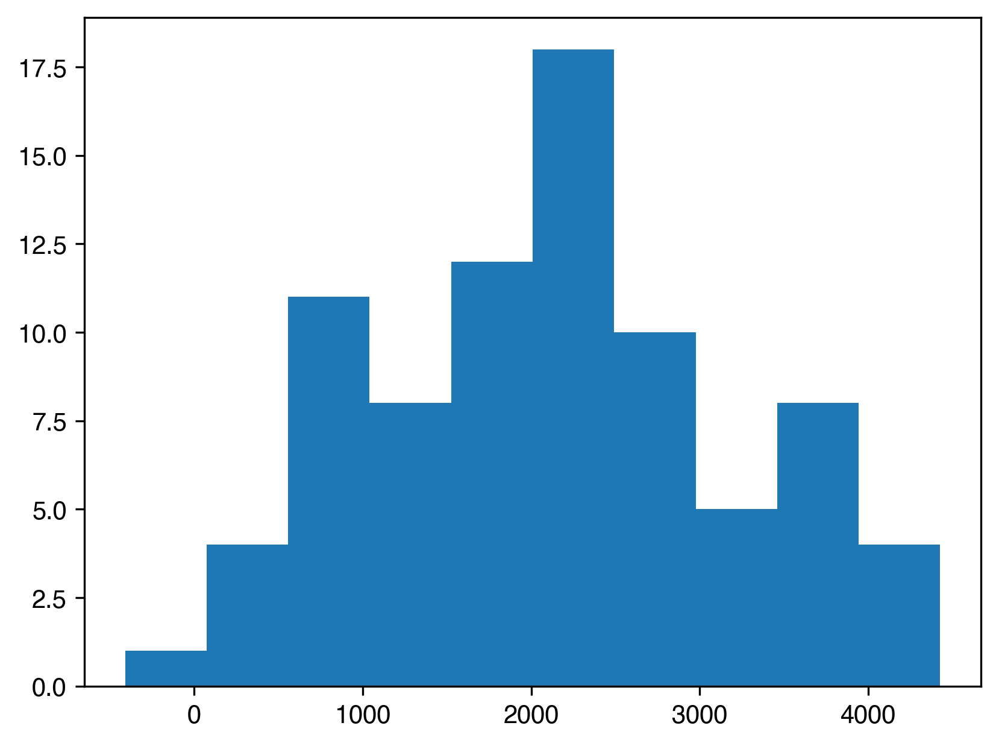

In [55]:
plt.hist(interesting_subset_higher['abund_error'])

In [56]:
interesting_subset_lower['abund_error'] = interesting_subset_lower['biophysics_cherry_pred'] - interesting_subset_lower['abundance']

/var/folders/34/1pw3__x51kdfyh3vk72f5vc80000gn/T/ipykernel_28306/47074443.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  interesting_subset_lower['abund_error'] = interesting_subset_lower['biophysics_cherry_pred'] - interesting_subset_lower['abundance']


(array([4.000, 5.000, 6.000, 19.000, 26.000, 28.000, 25.000, 7.000, 8.000,
        3.000]),
 array([-874.459, -337.282, 199.896, 737.073, 1274.251, 1811.428, 2348.606,
        2885.783, 3422.961, 3960.138, 4497.316]),
 <BarContainer object of 10 artists>)

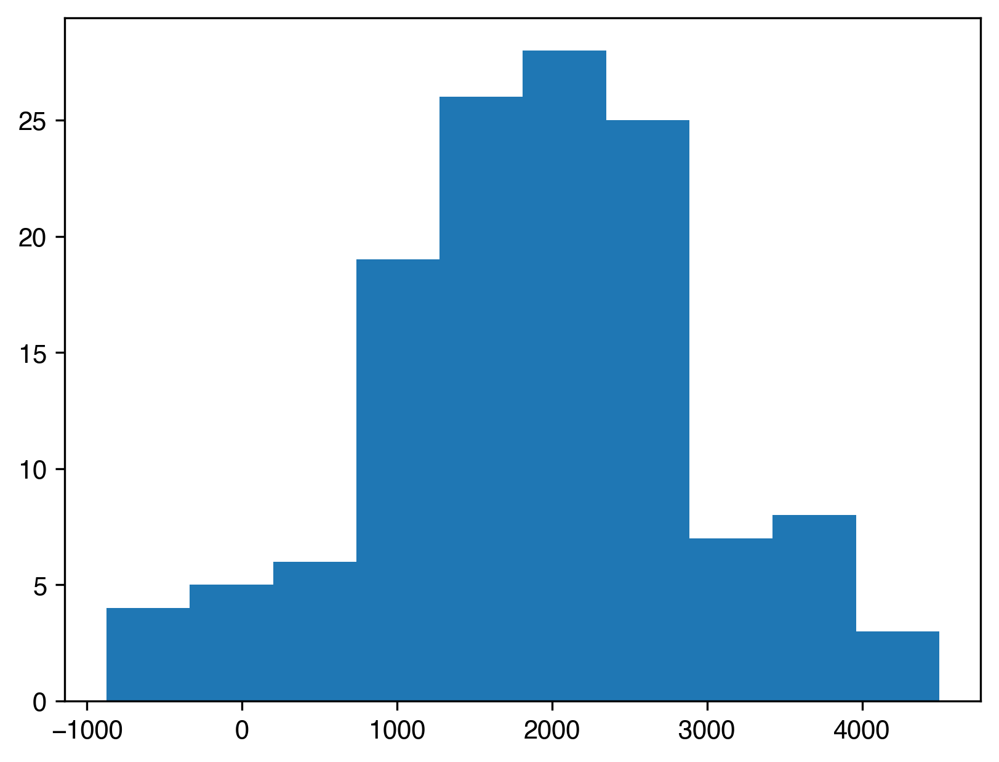

In [57]:
plt.hist(interesting_subset_lower['abund_error'])

In [58]:
interesting_subset_lower.sort_values('two_state_error', ascending=False).head(10)

,aa_seq,activity,abundance,ratio,biophysics_gfp_pred,biophysics_cherry_pred,adhunter_gfp_pred,charge,aromatic,positive,...,I,L,M,F,Y,W,two_state_error,two_state_abund_error,adhunter_error,abund_error
923,SYLTTCVSTNCNQIGGYTNDLSTAASLYESYCLEEGYTAE,2765.035776,1978.082030,80959.789132,1763.780029,3834.517334,2683.913574,-5,0,5,...,1,4,0,0,5,0,-1001.255747,1856.435304,-81.122202,1856.435304
6992,VTPQYNQKQLQQLQQFYQRRIMSTPNIGQDMSDFFDLPSN,2649.593894,2783.204092,53896.467457,1646.562622,5365.442383,2718.349121,0,3,3,...,2,3,2,3,2,0,-1003.031272,2582.238290,68.755227,2582.238290
11229,LFPANDPFSAALDSATLGLASGITQAKPVAPASPLIPSTG,2167.266207,1066.988118,96809.030686,1158.039673,2342.547607,2232.023193,-1,2,2,...,2,5,0,2,0,0,-1009.226534,1275.559489,64.756986,1275.559489
13549,VHSHKGAHVNIPSDLPDLFDLHADRFGDDLIPTTESTMLS,3551.926415,996.462580,165204.867168,2540.753418,2696.643555,3511.497559,-5,2,7,...,2,5,1,2,0,0,-1011.172997,1700.180975,-40.428856,1700.180975
13020,LPMGSNAAGTISPQDLLIHEPFMSAPNSTAFTALTSPSPY,3258.100540,2683.866456,187451.192318,2239.392334,2700.177734,3345.376465,-2,2,2,...,2,4,2,2,1,0,-1018.708206,16.311279,87.275924,16.311279
9223,GTVSPQELLLHEPYLSAPSSTALTALTSPSLFDGSPDFDT,3891.041236,2439.795184,155731.963707,2872.273682,5830.073730,3836.286377,-5,2,5,...,0,7,0,2,1,0,-1018.767555,3390.278547,-54.754859,3390.278547
12229,QVSAFTAINDPSVASGSTRTVSPKDIFADAFGSAPPSAAF,2780.072512,1256.977505,105763.681852,1751.097046,3097.815674,2778.757324,-1,4,3,...,2,0,0,4,0,0,-1028.975466,1840.838168,-1.315188,1840.838168
5481,DLDQALAGDPWYPLFPQDDQVEQPKSQVEQSPLQPEEELE,2429.993236,4138.603438,34006.885171,1399.853516,6967.931152,2387.483154,-10,2,11,...,0,5,0,1,1,1,-1030.139720,2829.327714,-42.510081,2829.327714
12988,SNMGTVSPQELLLHEPYLSAPSSTALTALTSPSIFDGSPD,3309.689612,1234.462931,132750.927120,2267.710205,5519.198730,3313.995117,-4,1,4,...,1,6,1,1,1,0,-1041.979407,4284.735800,4.305505,4284.735800
11587,PRELLMNPPTSTATTNLASPLSLFDSPSESYDTSPLYNGD,2695.963797,2782.812055,54261.555273,1650.939331,6324.674805,2622.787354,-4,1,5,...,0,6,1,1,2,0,-1045.024466,3541.862750,-73.176443,3541.862750


In [59]:
test_tiles

,aa_seq,activity,abundance,biophysics_gfp_pred,biophysics_cherry_pred,adhunter_gfp_pred,charge,aromatic,positive,negative,...,V,I,L,M,F,Y,W,two_state_error,adhunter_error,two_state_abund_error
0,MSTPNIAQDFPELFDLQSNRFGDDFSSPESTMLSPQISNS,2482.128691,4026.225387,3651.711426,4146.784180,3324.304199,-5,4,6,1,...,0,2,3,2,4,0,0,1169.582735,842.175508,120.558792
1,IAQDFPELFDLQSNRFGDDFSSPESTMLSPQISNSIFSQM,6522.143171,2756.372474,4837.012207,4020.703857,4407.241699,-5,5,6,1,...,0,3,3,2,5,0,0,-1685.130964,-2114.901471,1264.331383
2,PELFDLQSNRFGDDFSSPESTMLSPQISNSIFSQMGDAAP,3220.004056,1295.197147,3657.963135,4834.084473,2631.291260,-5,4,6,1,...,0,2,3,2,4,0,0,437.959079,-588.712796,3538.887326
3,LQSNRFGDDFSSPESTMLSPQISNSIFSQMGDAAPPGTVS,2841.993646,915.253034,2202.055176,3248.890869,1706.356567,-3,3,4,1,...,1,2,2,2,3,0,0,-639.938470,-1135.637079,2333.637835
4,FGDDFSSPESTMLSPQISNSIFSQMGDAAPPGTVSPRDLF,3300.277866,2764.618359,4057.855469,4402.168945,3083.325195,-4,4,5,1,...,1,2,2,2,4,0,0,757.577603,-216.952671,1637.550587
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4131,VDPSDPVALKRARNTEAARKSRARKLERQDEMERRIRELE,561.411852,3454.694625,170.606155,5863.486816,382.661316,3,0,9,12,...,2,1,3,1,0,0,0,-390.805697,-178.750536,2408.792192
4132,PVALKRARNTEAARKSRARKLERQDEMERRIRELEKSLEE,270.500000,2577.606144,178.624954,5165.125977,375.633972,4,0,9,13,...,1,1,4,1,0,0,0,-91.875046,105.133972,2587.519832
4133,RARNTEAARKSRARKLERQDEMERRIRELEKSLEEAQQRE,NaN,NaN,145.675369,6572.989258,250.065506,3,0,10,13,...,0,1,3,1,0,0,0,NaN,NaN,NaN
4134,EAARKSRARKLERQDEMERRIRELEKSLEEAQQREQYWKA,459.367480,3424.386384,209.186188,5769.229492,579.904968,2,1,10,12,...,0,1,3,1,0,1,1,-250.181292,120.537488,2344.843108


In [60]:
tile_data[tile_data['aa_seq'] == 'FSHHHHHLTTPYPLPPHNSAAPPKKKILLCLLVLVLVLPF']

,aa_seq,activity,abundance,ratio,biophysics_gfp_pred,biophysics_cherry_pred,adhunter_gfp_pred,charge,aromatic,positive,...,V,I,L,M,F,Y,W,two_state_error,two_state_abund_error,adhunter_error
703,FSHHHHHLTTPYPLPPHNSAAPPKKKILLCLLVLVLVLPF,622.19614,708.782287,53489.71437,1024.427734,786.477173,720.192566,3,2,0,...,3,1,9,0,2,1,0,402.231595,77.694886,97.996426


In [61]:
adhunter_better_interesting_subset_higher_test = test_tiles[(test_tiles['adhunter_error'] < 100) & (test_tiles['adhunter_error'] > -100) & ((test_tiles['two_state_error'] > 1000) )]
adhunter_better_interesting_subset_lower_test = test_tiles[(test_tiles['adhunter_error'] < 100) & (test_tiles['adhunter_error'] > -100) & ((test_tiles['two_state_error'] < -1000))]

In [62]:
two_state_better_interesting_subset_higher_test = test_tiles[(test_tiles['two_state_error'] < 100) & (test_tiles['two_state_error'] > -100) & ((test_tiles['adhunter_error'] > 1000) )]
two_state_better_interesting_subset_lower_test = test_tiles[(test_tiles['two_state_error'] < 100) & (test_tiles['two_state_error'] > -100) & ((test_tiles['adhunter_error'] < -1000))]

In [63]:
adhunter_better_interesting_subset_higher_test

,aa_seq,activity,abundance,biophysics_gfp_pred,biophysics_cherry_pred,adhunter_gfp_pred,charge,aromatic,positive,negative,...,V,I,L,M,F,Y,W,two_state_error,adhunter_error,two_state_abund_error
287,SKDSLADVPAGTVSPSDLFMDASAPPSASFTDLSTPSFDS,3235.386334,3652.458310,4314.710449,5006.646973,3221.036621,-5,3,6,1,...,2,0,3,1,3,0,0,1079.324115,-14.349713,1354.188663
463,PKDLFMDASAPPSTSFTDLSTPSFESPGYFSQDTSPMFPT,3244.299770,2012.563798,4376.205078,4359.682617,3169.132812,-4,5,5,1,...,0,0,2,2,5,1,0,1131.905308,-75.166958,2347.118819
709,NPFTTFDSTSFTTDNHQQSWLPSPSPTQPLAQNLNSDPSN,965.016823,2144.351722,3168.808105,6029.763672,1037.758545,-3,4,3,0,...,0,0,3,0,3,0,1,2203.791282,72.741722,3885.411950
797,PDLFDLHADRFGDDLIPTTESTMLSPQQMTAGVMAGPDSL,2951.968291,2769.044918,3990.470703,3739.107422,2910.013184,-6,2,7,1,...,1,1,5,3,2,0,0,1038.502412,-41.955108,970.062504
808,DASAPPSASFTDLSTPSFESPGYFSQDTSPMFATDMELGP,2695.960456,4485.821427,4843.553223,5395.429688,2766.285889,-6,4,6,0,...,0,0,2,2,4,1,0,2147.592767,70.325433,909.608261
978,HQQTWLPTPPPPQPTAQNLNSNNDNNSANSLQEDFVLYPS,1055.286030,2191.984647,2520.840576,4960.627930,1014.998169,-3,2,3,0,...,1,0,4,0,1,1,1,1465.554547,-40.287861,2768.643283
1261,APPSTSFTDLSTPSFDSPGYFSQDTSPMFATDMELAPGHE,2429.387978,3721.967618,3864.711426,4784.931641,2359.477783,-6,4,6,0,...,0,0,2,2,4,1,0,1435.323447,-69.910195,1062.964022
1394,PQDLMMDASAPPSASLTDLSTPSFESPGYFSQDPSPMFTE,2959.261165,4057.810913,4018.336182,4844.501953,2927.312744,-6,3,6,0,...,0,0,3,3,3,1,0,1059.075016,-31.948421,786.691040
1518,ASVPFNSPRPPVPLFNSSGSYSTWNRQYQKQLQWKQFQNY,806.806606,627.598814,2270.134277,2720.677002,748.012878,4,5,0,4,...,2,0,2,0,3,3,2,1463.327672,-58.793727,2093.078188
1709,VDTAPPSTTFTDLSTPSFESSGYFSHDTSPLFADADLGSG,3179.320732,1993.274176,4205.496094,4963.580078,3122.747070,-6,4,6,0,...,1,0,3,0,4,1,0,1026.175362,-56.573662,2970.305902


In [64]:
interesting_subset_lower_test

NameError: name 'interesting_subset_lower_test' is not defined

In [ ]:
# Both right
interesting_subset_test = test_tiles[(test_tiles['adhunter_error'] < 100) & (test_tiles['two_state_error'] < 100) & (test_tiles['two_state_error'] > -100)]
interesting_subset_test.sort_values('activity', ascending=False)

,aa_seq,activity,biophysics_cherry_pred,adhunter_gfp_pred,biophysics_gfp_pred,two_state_error,adhunter_error
811,PSFESPGYFSQDTSPMFATDMELGPGVEEWGSLFPSQDDF,7294.385769,5393.925293,6096.861328,7247.506348,-46.879421,-1197.524441
614,SFDSPGYFSQDTSPMFGADLDLAPGHEEWAPLFPSNDGMS,6073.442690,4279.403809,4371.231445,6039.887207,-33.555483,-1702.211245
4022,GYFSHDTSPLIATDSDLGPGHEEWESLFPVESAMLPKFDE,5419.356979,5142.446777,4500.978027,5477.724609,58.367630,-918.378952
1260,LMDASAPPSTSFTDLSTPSFDSPGYFSQDTSPMFATDMEL,4619.567714,4165.591309,2781.694092,4638.883789,19.316075,-1837.873622
3792,IPHQEFFDFTEGFGEDFTDPTMLSPHLVPTGIMASKDSLG,4528.994828,3869.791504,4299.139160,4566.052246,37.057418,-229.855668
...,...,...,...,...,...,...,...
3056,RVTQLARSPSYWSHPTLKHTRPNTASVPSNSPNTNRPPIP,256.000000,5676.639160,327.323547,199.470428,-56.529572,71.323547
825,IRTTSSRATSPSTRSVTKPSTVAGVNARQRKPLPPIKFDS,256.000000,2687.302002,277.900940,233.854538,-22.145462,21.900940
3003,SVEPKKPIVQTPASPASPRAKRSVASSPVPASGGVKHSSI,256.000000,4429.580566,268.549988,202.217590,-53.782410,12.549988
2905,PIAFDPNDPVAAKRARNTEAARKSRAKKMERQYSSERRIA,256.000000,3458.303223,339.809387,221.623779,-34.376221,83.809387


# Compare with linear regression

In [72]:
def one_hot_encode(seq):
    # Getting sequences
    matrix = np.zeros((len(seq),20))

    # Iterate over the amino acid sequence and set matrix entries to 1
    for position, amino_acid in enumerate(seq):
        # row_index = "ARNDCEQGHILKMFPSTWYV".index(amino_acid)
        row_index = "RHKDESTNQCGPAVILMFYW".index(amino_acid)
        matrix[position][row_index] = 1
    return matrix

In [120]:
train_data_df = pd.read_csv("Data/pm_gcn4_sort2_pools_allchannels_wrangled_w_ratio_training_heirarchical_v2.csv")
train_data_df["X"] = [one_hot_encode(s) for s in train_data_df["aa_seq"]]
train_data_df

,aa_seq,activity,abundance,ratio,X
0,LQDFVLFDQPIRPHRQHNRNALQPPTRGINLNQQHRSQHL,270.500000,2275.157246,23705.971880,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,VEHSPAEKSDDLEVVEPTSGHQRRKSGTSPPSGRHSSVSG,1081.420642,3180.013344,18161.451312,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,NAGTASRFLTTVVALCSPSDVSSTVLTGNARMQVRPIGPL,603.933187,1160.105019,52119.378755,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0,..."
3,SSTTALQQQHRQTRPQVPLFSQSTGSIPKTPNMVMQGTYI,706.024331,1005.046690,55857.888067,"[[0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0,..."
4,KGGKLQASKEALYLGNAGTASRFLTTVVALCSPSDVSSTV,474.552224,1537.143665,32333.990842,"[[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
...,...,...,...,...,...
14575,PTPTFSSPYLFDSPSEGYETSPLFGAEDTNGDNWYSLFPE,8343.122503,1971.676200,262143.000000,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
14576,DAWFSLFPSISGGENDESPLSAAEDVMVADPFNISAQVVL,4633.269589,280.000000,262143.000000,"[[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
14577,LYDESPDFGSGFDVSPNFAGSDFDAGGNDVWFPLFPQSNT,8178.009196,3209.784417,262143.000000,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
14578,LYESPDFGYDVSPGFGSNDFDTGSNQWFSLFPDQSTTPDA,9064.000000,4649.000000,262143.000000,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [121]:
X_train = train_data_df["X"]
X_train = np.stack(X_train)

In [122]:
X_train = X_train.reshape(14580, 800)
# X = X.reshape(45503, 800)

In [123]:
y_abund_train = train_data_df["abundance"].values
y_act_train = train_data_df["activity"].values

In [124]:
reg_abund = LinearRegression().fit(X_train, y_abund_train)
reg_act = LinearRegression().fit(X_train, y_act_train)

In [125]:
tile_data['X'] = [one_hot_encode(s) for s in tile_data["aa_seq"]]

In [126]:
X_test = tile_data["X"]
X_test = np.stack(X_test)

X_test = X_test.reshape(17732, 800)
tile_data["linear_regression"] = reg_act.predict(X_test)

In [127]:
test_tiles['X'] = [one_hot_encode(s) for s in test_tiles["aa_seq"]]
X_test = test_tiles["X"]
X_test = np.stack(X_test)

X_test = X_test.reshape(2916, 800)
test_tiles["linear_regression"] = reg_act.predict(X_test)

In [128]:
tile_data['regression_error'] = tile_data["linear_regression"] - tile_data['activity']
test_tiles['regression_error'] = test_tiles["linear_regression"] - test_tiles['activity']

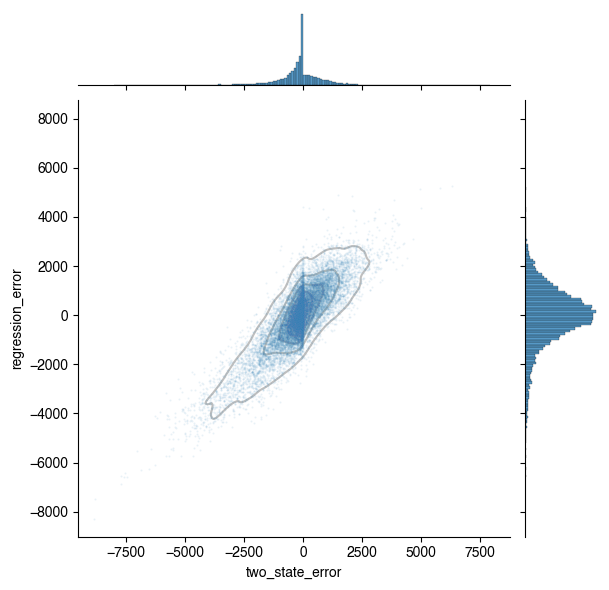

In [129]:
g = sns.jointplot(data=tile_data, x="two_state_error", y="regression_error",  s=2, alpha=0.1, marginal_kws=dict(bins=np.arange(-8000, 8000, 100)))
# sns.hexplot(data=tile_data, x="two_state_error", y="regression_error", s=2, alpha=0.1)
g.plot_joint(sns.kdeplot, color="grey", zorder=0, levels=6, alpha=0.5)

In [131]:
pearsonr(tile_data['two_state_error'], tile_data['regression_error'])

PearsonRResult(statistic=0.8309202673899638, pvalue=0.0)

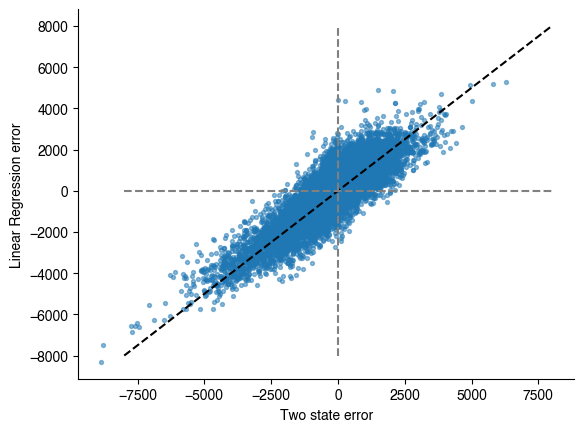

In [ ]:
plt.scatter(tile_data['two_state_error'], tile_data['regression_error'], s=8, alpha=0.5)

plt.plot([-8000, 8000], [-8000, 8000], linestyle='--', color='black')
plt.plot([-8000, 8000], [0, 0], linestyle='--', color='grey')
plt.plot([0, 0], [-8000, 8000], linestyle='--', color='grey')
plt.xlabel("Two state error")
plt.ylabel("Linear Regression error")
sns.despine()

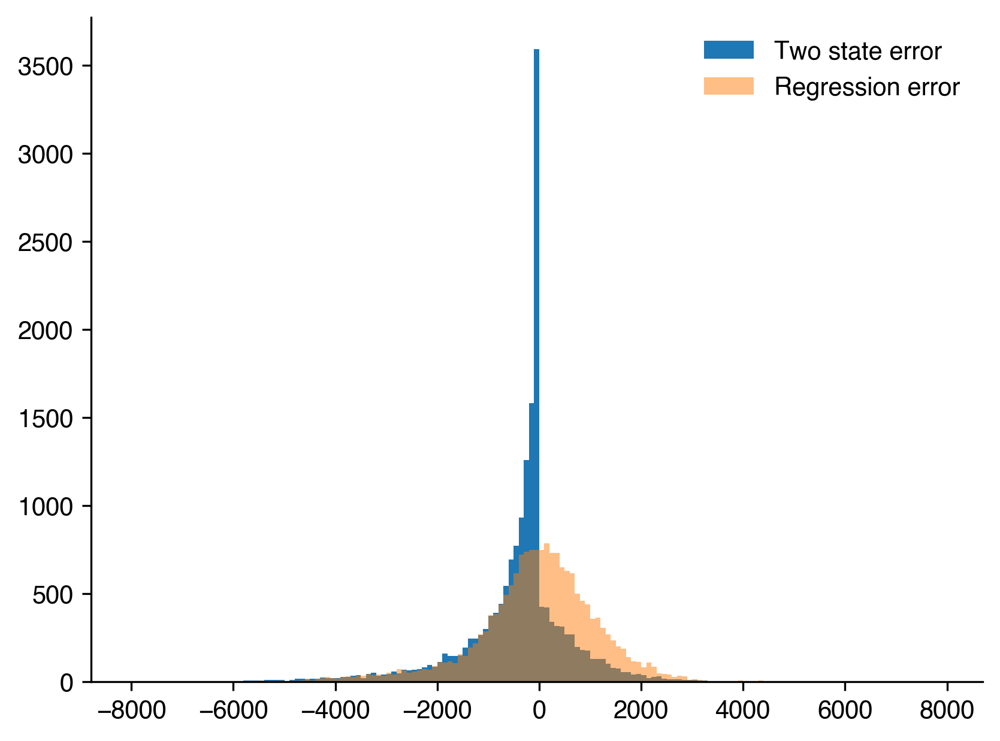

In [ ]:
plt.hist(tile_data['two_state_error'], bins=np.arange(-8000, 8000, 100), label="Two state error")
plt.hist(tile_data['regression_error'], bins=np.arange(-8000, 8000, 100), alpha=0.5, label="Regression error")

plt.legend(frameon=False)
sns.despine()

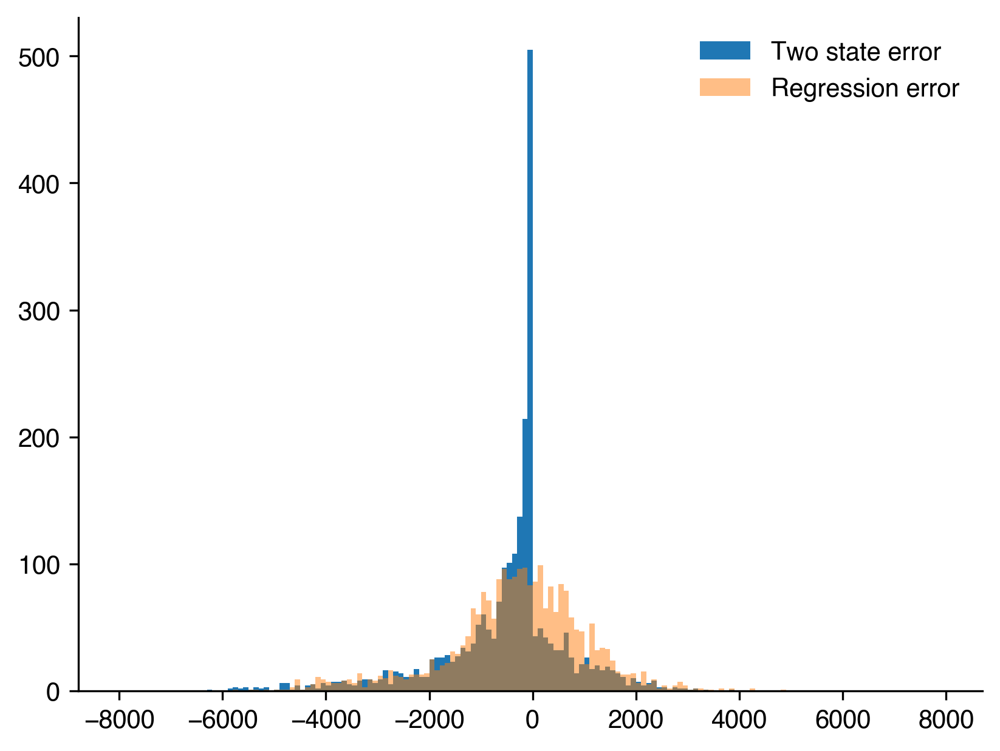

In [ ]:
plt.hist(test_tiles['two_state_error'], bins=np.arange(-8000, 8000, 100), label="Two state error")
plt.hist(test_tiles['regression_error'], bins=np.arange(-8000, 8000, 100), alpha=0.5, label="Regression error")

plt.legend(frameon=False)
sns.despine()

# From lab meeting

In [9]:
tile_data.columns

Index(['aa_seq', 'activity', 'abundance', 'ratio', 'biophysics_gfp_pred',
       'k_bound', 'biophysics_cherry_pred', 'adhunter_gfp_pred',
       'adhunter_mcherry_pred'],
      dtype='object')

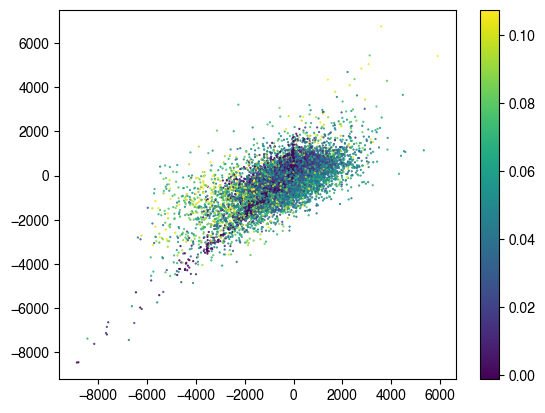

In [67]:
plt.scatter(tile_data['two_state_error'], tile_data['adhunter_error'], s=0.3, c=tile_data['k_bound'])
plt.colorbar()


In [58]:
tile_data['k_bound']

0        [-0.00045158667]
1           [0.035105757]
2         [-0.0005924888]
3          [0.0054304637]
4        [-0.00053591945]
               ...       
17727        [0.10699083]
17728        [0.06745897]
17729       [0.098590784]
17730       [0.059679825]
17731        [0.08644884]
Name: k_bound, Length: 17732, dtype: object

In [59]:
pearsonr(tile_data['biophysics_cherry_pred'], [ls[0] for ls in tile_data['k_bound']])

PearsonRResult(statistic=-0.23921463, pvalue=3.3992194226371145e-229)

In [42]:
two_state_biophysical_model.state_dict()

OrderedDict([('conv2.weight',
              tensor([[[[ 7.6384e-02, -1.7947e-02, -5.4649e-02,  1.4186e-01,  2.0221e-01,
                          7.9575e-02,  7.4855e-03, -3.1616e-02,  1.4255e-01, -1.6012e-01,
                          5.9697e-02,  6.4575e-02,  1.3629e-01,  6.1802e-02,  6.3494e-02,
                          5.8626e-02, -8.0644e-02, -1.8545e-01, -1.3611e-01,  1.0952e-01],
                        [-3.4411e-02,  4.1978e-02,  1.6131e-01, -1.6598e-03, -1.0982e-01,
                          7.9413e-02,  8.3880e-02,  1.7748e-01,  3.6897e-02,  9.6242e-02,
                         -5.7037e-02, -1.2851e-02,  3.3858e-02,  9.5999e-02,  5.1294e-02,
                         -4.8052e-04,  5.1295e-02, -1.0022e-01, -1.2029e-01, -6.1419e-01],
                        [-1.9377e-02, -1.9575e-01, -1.1448e-01,  1.4472e-01,  2.8526e-01,
                          5.9799e-02,  1.1916e-01,  6.6692e-02,  9.1290e-02, -6.6931e-02,
                          1.2204e-01,  7.0224e-03,  4.1230e-03, -2.9

In [85]:
beta = 1
K = 0.2018
n = 1

def hill_activation(bound):
    xn = bound ** n 
    kn = K ** n

    numerator = beta * xn
    denom = kn + xn

    output = numerator / denom

    return output

Text(0, 0.5, 'predicted activity')

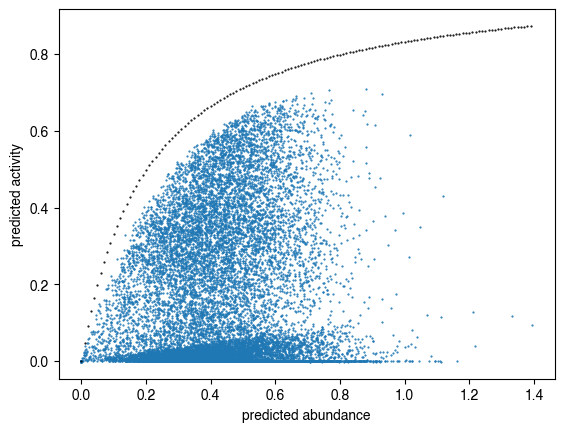

In [86]:
plt.scatter(tile_data['biophysics_cherry_pred'], tile_data['biophysics_gfp_pred'], s=0.3)
plt.scatter([np.arange(0, 1.4, .01)], [hill_activation(s) for s in np.arange(0, 1.4, .01)], color='black', s=0.3)

# plt.scatter(tile_data['adhunter_mcherry_pred'], tile_data['adhunter_gfp_pred'], s=0.3)

plt.xlabel("predicted abundance")
plt.ylabel("predicted activity")

In [87]:
pearsonr(tile_data['biophysics_cherry_pred'], [ls[0] for ls in tile_data['k_bound']])

PearsonRResult(statistic=-0.10529023, pvalue=6.811389094552354e-45)

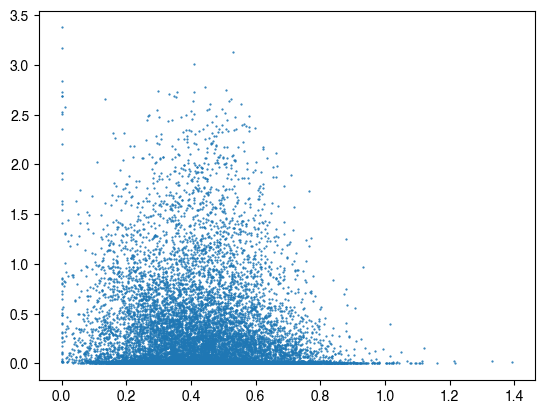

In [88]:
plt.scatter(tile_data['biophysics_cherry_pred'], tile_data['k_bound'], s=0.3)


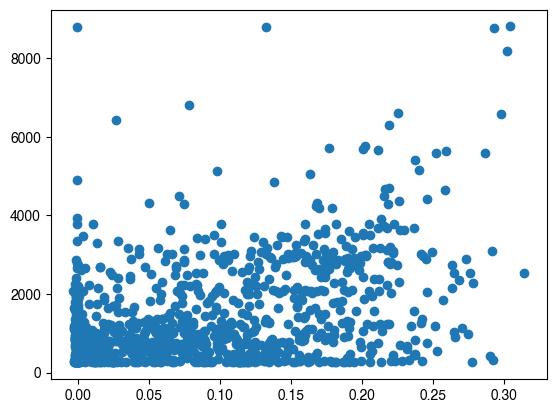

In [89]:
pearsonr(low_subset['biophysics_gfp_pred'], low_subset['activity'])
plt.scatter(low_subset['biophysics_gfp_pred'], low_subset['activity'])

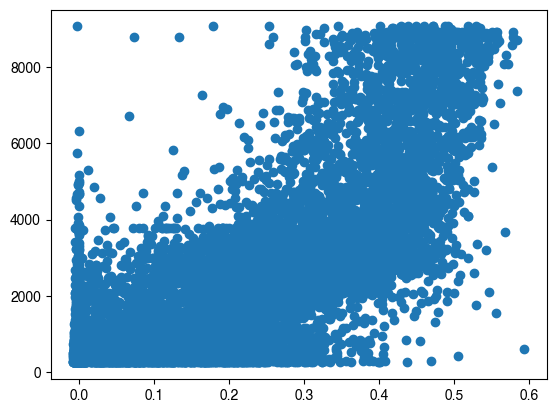

In [90]:
pearsonr(med_subset['biophysics_gfp_pred'], med_subset['activity'])

plt.scatter(med_subset['biophysics_gfp_pred'], med_subset['activity'])

In [91]:
pearsonr(high_subset['biophysics_gfp_pred'], high_subset['activity'])

PearsonRResult(statistic=0.8270743560838407, pvalue=0.0)

(array([3.634, 0.455, 0.203, 0.093, 0.086, 0.054, 0.030, 0.020, 0.020,
        0.013]),
 array([-0.000, 0.217, 0.434, 0.651, 0.868, 1.085, 1.302, 1.519, 1.736,
        1.953, 2.170]),
 <BarContainer object of 10 artists>)

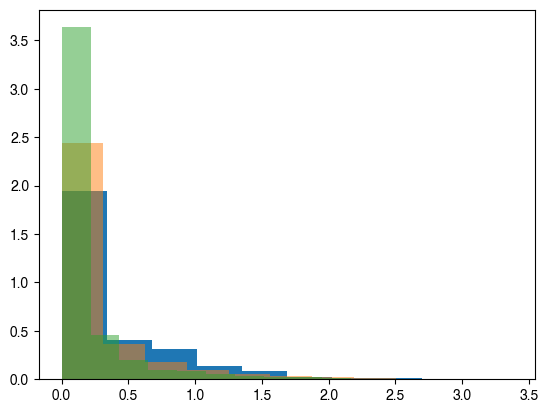

In [92]:
low_subset = tile_data[tile_data['biophysics_cherry_pred'] < 0.2]
med_subset = tile_data[(tile_data['biophysics_cherry_pred'] > 0.2) & (tile_data['biophysics_cherry_pred'] < 0.6)]
high_subset = tile_data[tile_data['biophysics_cherry_pred'] > 0.6]

plt.hist([ls[0] for ls in low_subset['k_bound']], density=True) # Low Kbound
plt.hist([ls[0] for ls in med_subset['k_bound']], alpha=0.5, density=True) # Med Kbound
plt.hist([ls[0] for ls in high_subset['k_bound']], alpha=0.5, density=True) # Lowest kbound


Text(0, 0.5, 'predicted activity')

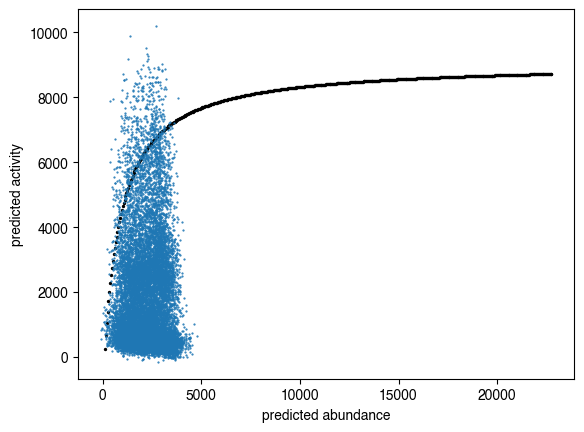

In [93]:

# plt.scatter(tile_data['biophysics_cherry_pred'], tile_data['biophysics_gfp_pred'], s=0.3)
plt.scatter([sc_abund.inverse_transform(a.reshape(1, -1)) for a in np.arange(0, 5, .01)], [sc_act.inverse_transform(hill_activation(s).reshape(1, -1)) for s in np.arange(0, 5, .01)], color='black', s=2)

plt.scatter(tile_data['adhunter_mcherry_pred'], tile_data['adhunter_gfp_pred'], s=0.3)

plt.xlabel("predicted abundance")
plt.ylabel("predicted activity")

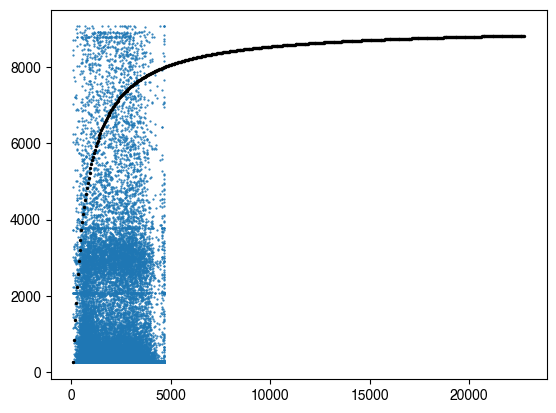

In [60]:
plt.scatter(tile_data['abundance'], tile_data['activity'], s=0.3)
# plt.scatter(tile_data['adhunter_mcherry_pred'], tile_data['adhunter_gfp_pred'], s=0.3)
# plt.scatter(tile_data['biophysics_cherry_pred'], tile_data['biophysics_gfp_pred'], s=0.3)
plt.scatter([sc_abund.inverse_transform(a.reshape(1, -1)) for a in np.arange(0, 5, .01)], [sc_act.inverse_transform(hill_activation(s).reshape(1, -1)) for s in np.arange(0, 5, .01)], color='black', s=2)


Text(0, 0.5, 'biophysics predicted activity')

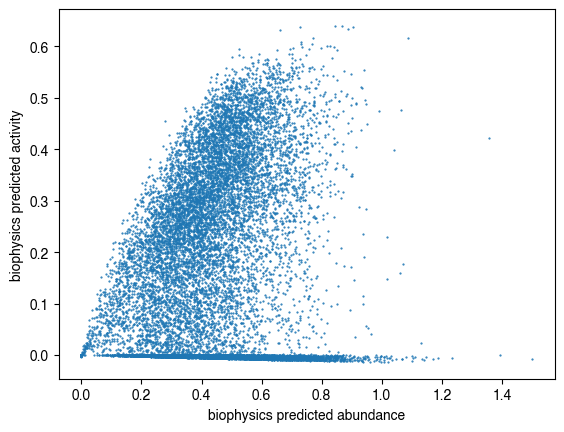

In [24]:
plt.scatter(tile_data['biophysics_cherry_pred'], tile_data['biophysics_gfp_pred'], s=0.3)
plt.xlabel("biophysics predicted abundance")
plt.ylabel("biophysics predicted activity")

In [14]:
tile_data.columns

Index(['aa_seq', 'activity', 'abundance', 'ratio', 'biophysics_gfp_pred',
       'k_bound', 'biophysics_cherry_pred', 'adhunter_gfp_pred',
       'adhunter_mcherry_pred'],
      dtype='object')

Text(0, 0.5, 'biophysics predicted activity (3 state)')

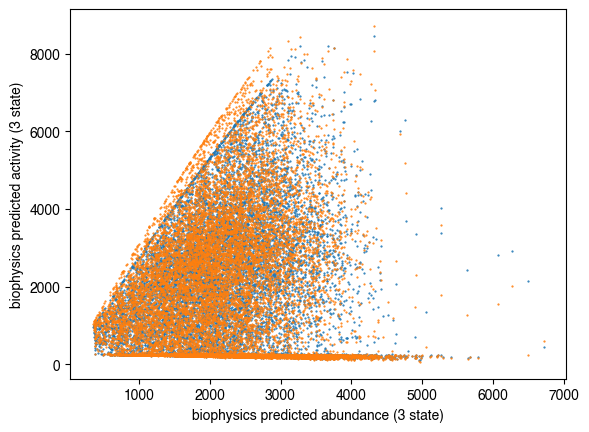

In [136]:
plt.scatter(tile_data['biophysics_mcherry_pred_3'], tile_data['biophysics_gfp_pred_3'], s=0.3)
plt.scatter(tile_data['biophysics_cherry_pred'], tile_data['biophysics_gfp_pred'], s=0.3)
plt.xlabel("biophysics predicted abundance (3 state)")
plt.ylabel("biophysics predicted activity (3 state)")

Text(0, 0.5, 'simple act')

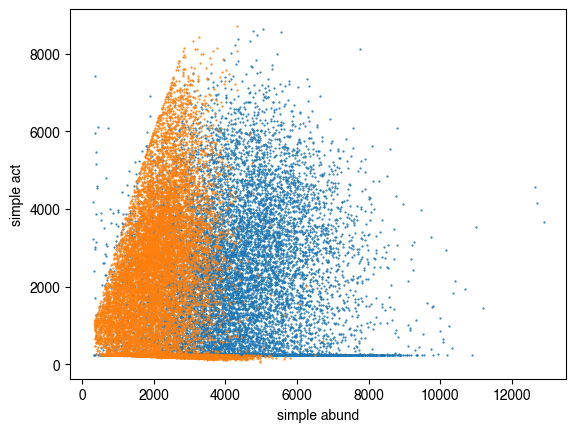

In [137]:
plt.scatter(tile_data['simple_mcherry_pred'], tile_data['simple_gfp_pred'], s=0.3)
plt.scatter(tile_data['biophysics_cherry_pred'], tile_data['biophysics_gfp_pred'], s=0.3)

plt.xlabel("simple abund")
plt.ylabel("simple act")

In [15]:
beta = 1
K = 0.2987
n = 1
def hill_activation(bound):
    xn = bound ** n 
    kn = K ** n

    numerator = beta * xn
    denom = kn + xn

    output = numerator / denom

    return output

In [142]:
tile_data.sort_values('k_bound', ascending=False)

,aa_seq,activity,abundance,ratio,biophysics_gfp_pred,k_bound,biophysics_cherry_pred,adhunter_gfp_pred,charge,aromatic,...,Y,W,two_state_error,two_state_abund_error,adhunter_error,adhunter_mcherry_pred,biophysics_gfp_pred_3,biophysics_mcherry_pred_3,simple_gfp_pred,simple_mcherry_pred
2391,TLILWLIPLLLAVLLIFLQRFIKSPMFMPLYFMAIPAVFY,1095.417701,493.643260,77055.534846,253.881363,[0.10747534],110.395897,829.840759,2,6,...,2,1,-841.536338,-238.815806,-265.576942,202.232620,989.330750,359.125702,5464.693848,174.757660
4085,FEAPQAGVPFWHFYTLYDFRAVDWGALLQTVPAMFALTFF,285.000000,1151.483114,67210.510307,254.921432,[0.10742889],110.692329,1819.496582,-2,9,...,2,2,-30.078568,-896.080282,1534.496582,1412.556519,1025.954346,371.333740,6080.875000,350.388794
2974,LFEPGTLILWLIPLLLAVLLIFLQRFIKSPMFMPLYFMAI,270.500000,591.903756,54775.253625,254.451065,[0.10739637],110.558044,695.925476,1,6,...,1,1,-16.048935,-336.761575,425.425476,483.700043,1136.797974,409.965240,5966.176758,161.718033
15015,AGVPFWHFYTLYDFRAVDWGALLQTVPAMFALTFFGILHV,2068.000000,803.487388,58075.681642,277.345306,[0.10738227],117.094063,1617.525513,-1,8,...,2,2,-1790.654694,-535.659141,-450.474487,618.998474,1029.107056,372.402283,7429.468262,171.080460
9070,YNESPDFNDGYDVSPSFDSGDFGSADFDTTAGDPWFPLFP,8319.617255,2555.486419,256906.736587,6691.897461,[0.10729594],2226.960693,7020.382812,-9,7,...,2,1,-1627.719794,1807.473054,-1299.234442,2697.816650,6783.723633,2616.167725,8219.870117,2183.346924
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1219,SEAERESAANAASKSARPRQSRLKNIDHARCSKHPSHRGS,532.751461,3354.496872,17042.506904,134.549255,[-0.001174295],2962.596191,330.193054,5,0,...,0,0,-398.202206,2436.288773,-202.558407,3456.888428,151.407181,3251.682129,231.982635,2825.405029
7428,KTSRKRASRDLGPIKYDPTNPVEVKRAKNTAAARKSREKK,285.000000,2104.601737,15972.979881,127.601524,[-0.0011794198],3112.185547,135.048416,10,0,...,1,0,-157.398476,3976.528634,-149.951584,2477.165771,179.964661,2654.628662,239.672485,2947.571289
588,PTPILEDAKLSQTKRAKKPNSIVKKSHHHHHHHHDDDEDD,270.500000,3978.608545,13846.992906,37.769623,[-0.0011906264],5154.622559,254.899734,-1,0,...,0,0,-232.730377,6066.776221,-15.600266,3495.695312,104.904457,4973.502930,252.998505,4791.461914
4506,VEVKRAKNTAAARKSREKKQRHVEELEQRLAESEERERQL,285.000000,4181.043410,17579.352818,101.496223,[-0.0012323933],3565.119385,46.460644,3,0,...,0,0,-183.503777,2779.205614,-238.539356,2852.794678,137.090515,3477.975342,236.812637,3559.987793


In [16]:
tile_data['max_hill_function_activity'] = [sc_act.inverse_transform(hill_activation(sc_abund.transform(np.array(a).reshape(1, -1))/(1/0.10747534 + 1)).reshape(1, -1))[0][0] for a in tile_data['abundance']] 

In [160]:
tile_data['adhunter_filter'] = tile_data['max_hill_function_activity'] > tile_data['adhunter_gfp_pred']

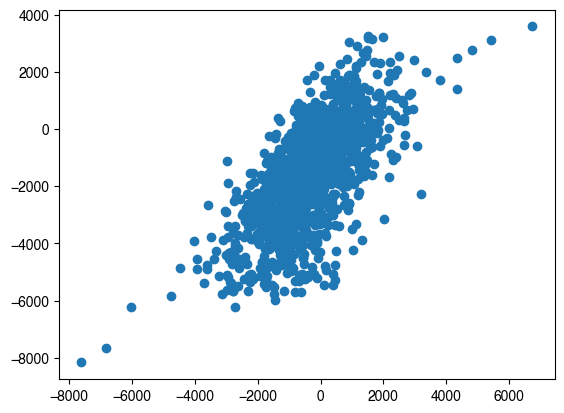

In [206]:
plt.scatter(tile_data[ ~ tile_data['adhunter_filter']]['adhunter_error'], tile_data[ ~ tile_data['adhunter_filter']]['two_state_error'])

In [ ]:
# Correlation a little higher outide of the points skipping the filter but not that much
pearsonr(tile_data[~tile_data['adhunter_filter']]['adhunter_error'], tile_data[~tile_data['adhunter_filter']]['two_state_error'])

PearsonRResult(statistic=0.6911860933491178, pvalue=1.337066624401322e-209)

In [ ]:
# Spearman corr is higher
spearmanr(tile_data[~tile_data['adhunter_filter']]['adhunter_error'], tile_data[~tile_data['adhunter_filter']]['two_state_error'])

SignificanceResult(statistic=0.6855623159952475, pvalue=6.7172113825599905e-205)

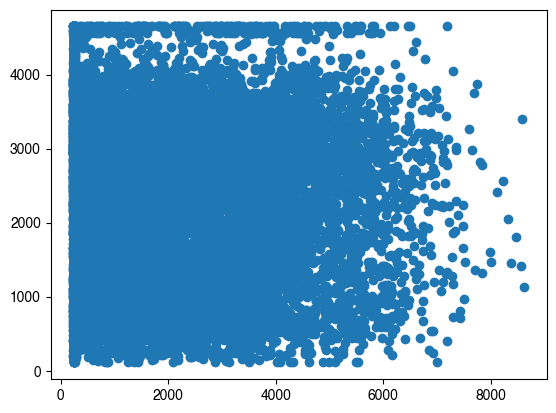

In [212]:
plt.scatter(tile_data['simple_gfp_pred'], tile_data['abundance'])

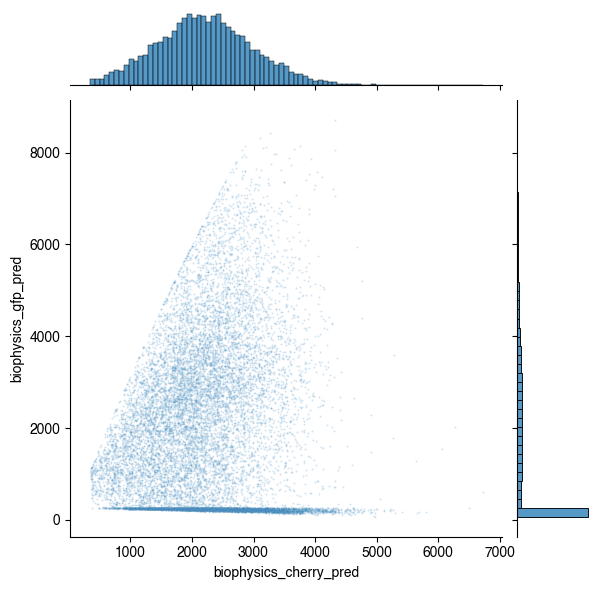

In [138]:
# plt.scatter(tile_data['simple_mcherry_pred'], tile_data['simple_gfp_pred'], s=8, alpha=0.5)
g = sns.jointplot(data=tile_data, x="biophysics_cherry_pred", y="biophysics_gfp_pred",  s=2, alpha=0.2)


(array([0.001, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
        0.000]),
 array([231.238, 951.061, 1670.884, 2390.707, 3110.530, 3830.353, 4550.176,
        5269.999, 5989.822, 6709.645, 7429.468]),
 <BarContainer object of 10 artists>)

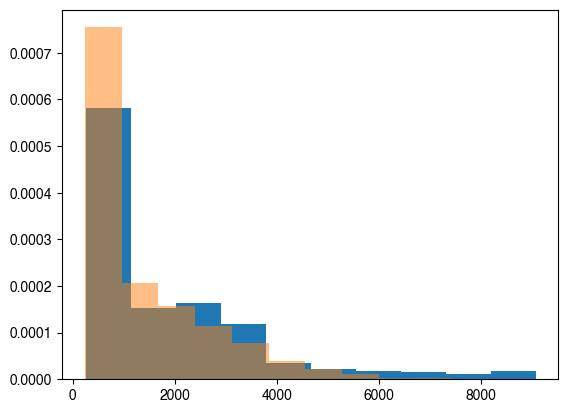

In [227]:
plt.hist(tile_data[tile_data['abundance'] < 1000]['activity'], density=True)
plt.hist(tile_data[tile_data['simple_mcherry_pred'] < 1000]['simple_gfp_pred'], density=True, alpha=0.5)

(array([0.001, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000, 0.000,
        0.000]),
 array([231.212, 1070.361, 1909.510, 2748.658, 3587.807, 4426.956,
        5266.104, 6105.252, 6944.401, 7783.550, 8622.698]),
 <BarContainer object of 10 artists>)

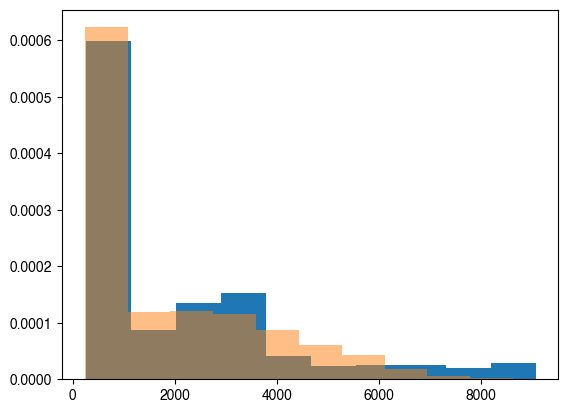

In [232]:
# plt.hist(tile_data[(tile_data['abundance'] > 1000) & (tile_data['abundance'] < 2000)]['activity'], density=True)
# plt.hist(tile_data[(tile_data['simple_mcherry_pred'] > 1000) & (tile_data['simple_mcherry_pred'] < 2000)]['simple_gfp_pred'], density=True, alpha=0.5)

plt.hist(tile_data[(tile_data['abundance'] > 2000) & (tile_data['abundance'] < 3000)]['activity'], density=True)
plt.hist(tile_data[(tile_data['simple_mcherry_pred'] > 2000) & (tile_data['simple_mcherry_pred'] < 3000)]['simple_gfp_pred'], density=True, alpha=0.5)

# plt.hist(tile_data[(tile_data['abundance'] > 3000) & (tile_data['abundance'] < 4000)]['activity'], density=True)
# plt.hist(tile_data[(tile_data['simple_mcherry_pred'] > 3000) & (tile_data['simple_mcherry_pred'] < 4000)]['simple_gfp_pred'], density=True, alpha=0.5)

In [ ]:
plt.scatter(tile_data[ ~ tile_data['adhunter_filter']]['adhunter_error'], tile_data[ ~ tile_data['adhunter_filter']]['two_state_error'])

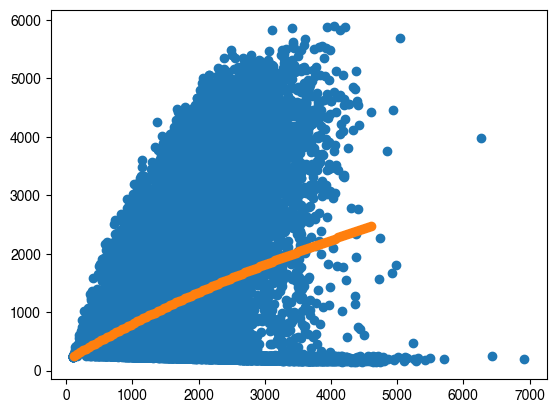

In [17]:
plt.scatter(tile_data['biophysics_cherry_pred'], tile_data['biophysics_gfp_pred'])

abund = np.arange(0, 1, 0.01)
act3 = [sc_act.inverse_transform(hill_activation(a/(1/0.10747534 + 1)).reshape(1, -1)) for a in abund] # Max observed 
act3 = [sc_act.inverse_transform(hill_activation(a/(1/0.1125 + 1)).reshape(1, -1)) for a in abund] # Max possible

abund = [sc_abund.inverse_transform(a.reshape(1, -1)) for a in abund]

plt.scatter(abund, act3)

In [235]:
tile_data.columns

Index(['aa_seq', 'activity', 'abundance', 'ratio', 'biophysics_gfp_pred',
       'k_bound', 'biophysics_cherry_pred', 'adhunter_gfp_pred', 'charge',
       'aromatic', 'positive', 'negative', 'R', 'H', 'K', 'D', 'E', 'S', 'T',
       'N', 'Q', 'C', 'G', 'P', 'A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W',
       'two_state_error', 'two_state_abund_error', 'adhunter_error',
       'adhunter_mcherry_pred', 'biophysics_gfp_pred_3',
       'biophysics_mcherry_pred_3', 'simple_gfp_pred', 'simple_mcherry_pred',
       'max_hill_function_activity', 'adhunter_filter'],
      dtype='object')

In [244]:
tile_data['abund_error'] = tile_data['biophysics_cherry_pred'] - tile_data['abundance']

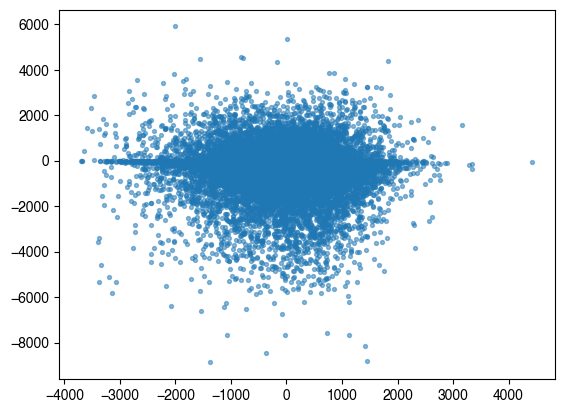

In [246]:
plt.scatter(tile_data['abund_error'], tile_data['two_state_error'], s =8, alpha=0.5)

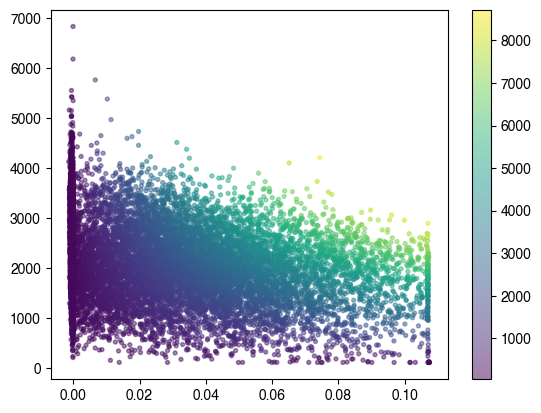

In [240]:
plt.scatter(tile_data['k_bound'], tile_data['biophysics_cherry_pred'], s=8, alpha=0.5, c=tile_data['biophysics_gfp_pred'])
plt.colorbar()

In [250]:
tile_data['k_bound'] = [ls[0] for ls in tile_data['k_bound']]

(array([1093.000, 2503.000, 2069.000, 1849.000, 1970.000, 2392.000,
        2524.000, 1849.000, 876.000, 607.000]),
 array([111.000, 564.800, 1018.600, 1472.400, 1926.200, 2380.000, 2833.800,
        3287.600, 3741.400, 4195.200, 4649.000]),
 <BarContainer object of 10 artists>)

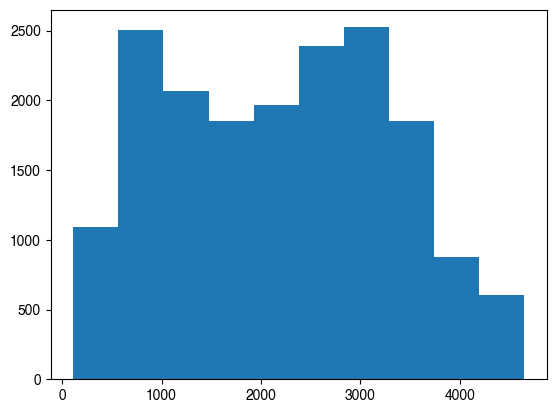

In [269]:
plt.hist(tile_data['abundance'])

In [274]:
tile_data['low_abund'] = tile_data['abundance'] < 1000
tile_data['medium_abund'] = (tile_data['abundance'] > 1000) & (tile_data['abundance'] < 3000)
tile_data['high_abund'] = (tile_data['abundance'] > 3000)

tile_data['low_k'] = tile_data['k_bound'] < 0.02
tile_data['medium_k'] = (tile_data['k_bound'] > 0.02) & (tile_data['k_bound'] < 0.06)
tile_data['high_k'] = (tile_data['k_bound'] > 0.06)

PearsonRResult(statistic=0.8415601671479898, pvalue=0.0)

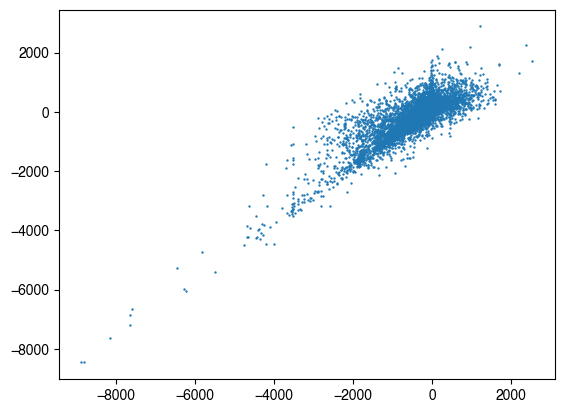

In [279]:
plt.scatter(tile_data[tile_data['low_k']]['two_state_error'], tile_data[tile_data['low_k']]['adhunter_error'], s=0.5)
pearsonr(tile_data[tile_data['low_k']]['two_state_error'], tile_data[tile_data['low_k']]['adhunter_error'])

PearsonRResult(statistic=0.7029938683622503, pvalue=0.0)

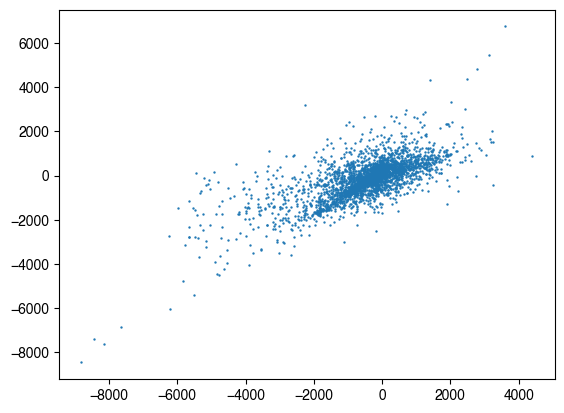

In [ ]:


plt.scatter(tile_data[tile_data['low_abund']]['two_state_error'], tile_data[tile_data['low_abund']]['adhunter_error'], s=0.5)
pearsonr(tile_data[tile_data['low_abund']]['two_state_error'], tile_data[tile_data['low_abund']]['adhunter_error'])

PearsonRResult(statistic=0.687719954890681, pvalue=0.0)

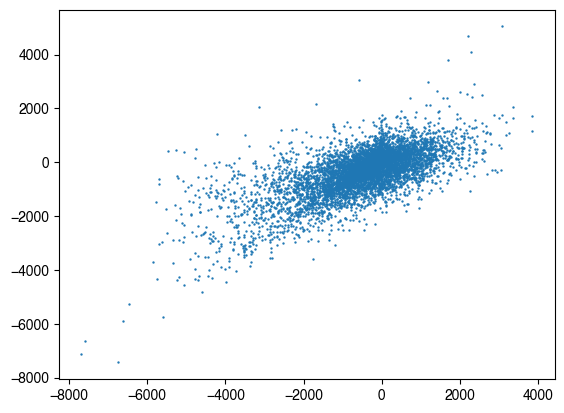

In [277]:
plt.scatter(tile_data[tile_data['medium_abund']]['two_state_error'], tile_data[tile_data['medium_abund']]['adhunter_error'], s=0.5)
pearsonr(tile_data[tile_data['medium_abund']]['two_state_error'], tile_data[tile_data['medium_abund']]['adhunter_error'])

PearsonRResult(statistic=0.7155975890445383, pvalue=0.0)

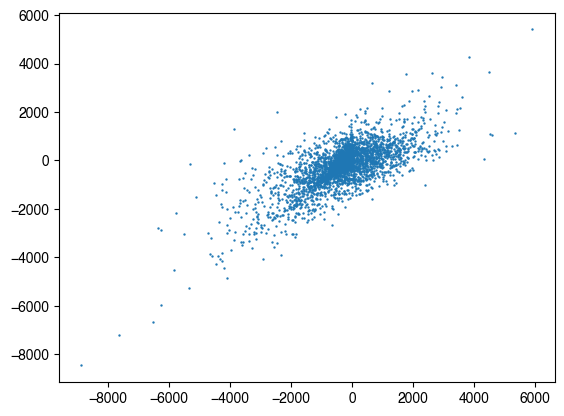

In [278]:
plt.scatter(tile_data[tile_data['high_abund']]['two_state_error'], tile_data[tile_data['high_abund']]['adhunter_error'], s=0.5)
pearsonr(tile_data[tile_data['high_abund']]['two_state_error'], tile_data[tile_data['high_abund']]['adhunter_error'])

PearsonRResult(statistic=-0.6108732366270061, pvalue=0.0)

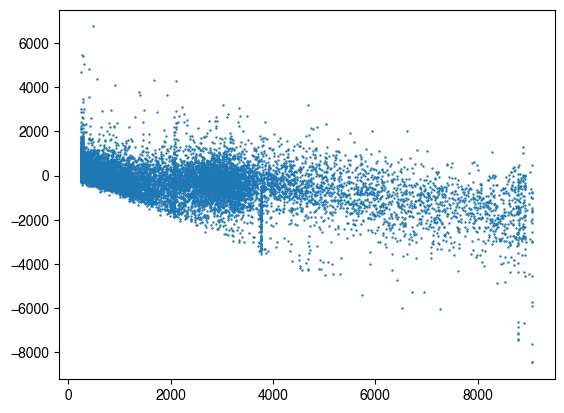

In [268]:
# plt.scatter(tile_data['activity'], tile_data['two_state_error'], s=0.5)

plt.scatter(tile_data['activity'], tile_data['adhunter_error'], s=0.5) # Even ADHunter underpredicts

pearsonr(tile_data['activity'], tile_data['adhunter_error'])
pearsonr(tile_data['activity'], tile_data['two_state_error'])

PearsonRResult(statistic=0.6421254547926651, pvalue=0.0)

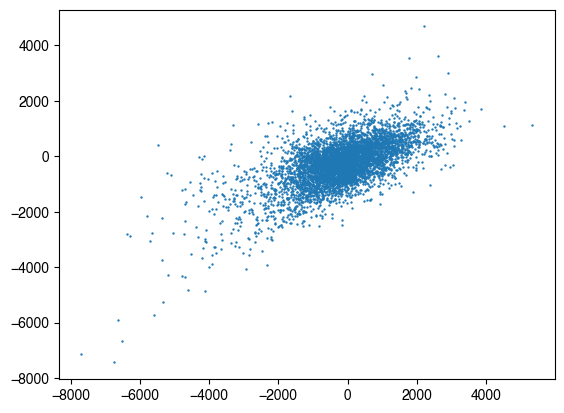

In [258]:
plt.scatter(tile_data[tile_data['medium_k']]['two_state_error'], tile_data[tile_data['medium_k']]['adhunter_error'], s=0.5)
pearsonr(tile_data[tile_data['medium_k']]['two_state_error'], tile_data[tile_data['medium_k']]['adhunter_error'])

PearsonRResult(statistic=0.6637449838774467, pvalue=3.9908359480511436e-263)

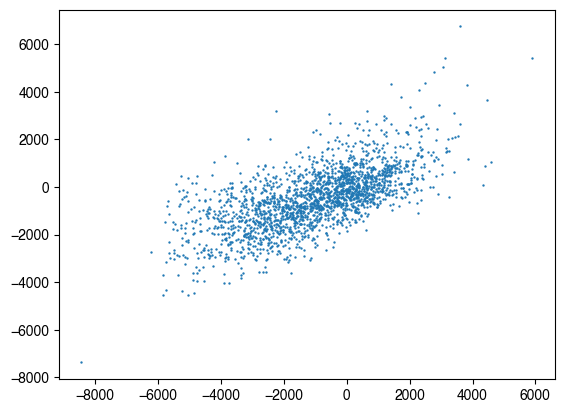

In [257]:
plt.scatter(tile_data[tile_data['high_k']]['two_state_error'], tile_data[tile_data['high_k']]['adhunter_error'], s=0.5)
pearsonr(tile_data[tile_data['high_k']]['two_state_error'], tile_data[tile_data['high_k']]['adhunter_error'])

In [166]:
run_biophysical_model(two_state_biophysical_model, "W"*40, scaler=sc_act)

(array([[250.683, 246.008]], dtype=float32), array([0.112], dtype=float32))

In [183]:
two_state_biophysical_model

ADModel_two_state_abund(
  (conv2): Conv2d(1, 1, kernel_size=(15, 20), stride=(1, 1))
  (linear2): Linear(in_features=26, out_features=1, bias=True)
  (conv1): Conv2d(1, 1, kernel_size=(40, 20), stride=(1, 1))
  (linear1): Linear(in_features=1, out_features=1, bias=True)
  (activate1): LeakyReLU(negative_slope=0.01)
  (activate2): LeakyReLU(negative_slope=0.01)
  (activate3): LeakyReLU(negative_slope=0.01)
  (activate4): LeakyReLU(negative_slope=0.01)
  (transf): HillActivation()
  (sigmoid): Sigmoid()
)

In [200]:
two_state_biophysical_model.state_dict()['conv1.weight'].shape

torch.Size([1, 1, 40, 20])

In [203]:
(two_state_biophysical_model.state_dict()['conv1.weight'].detach().numpy()[:, :, :, -1].sum() + two_state_biophysical_model.state_dict()['conv1.bias']) * 0.01 * two_state_biophysical_model.state_dict()['linear1.weight'].detach().numpy() + two_state_biophysical_model.state_dict()['linear1.bias'].detach().numpy()

tensor([[0.1123]])

In [ ]:
# Max possible K1 value based on NN --> limited by negative weights

(two_state_biophysical_model.state_dict()['conv1.weight'].detach().numpy().min(axis=3).sum() + two_state_biophysical_model.state_dict()['conv1.bias']) * 0.01 * two_state_biophysical_model.state_dict()['linear1.weight'].detach().numpy() + two_state_biophysical_model.state_dict()['linear1.bias'].detach().numpy()

tensor([[0.1125]])

In [ ]:
0.570 # Max possible "K1" fraction

In [ ]:
0.112 # Max value in 

In [ ]:
# max K_bound is 0.10747534
# Even in very active things, only a small amount of things in bound state

In [135]:
1/0.05 + 1

21.0

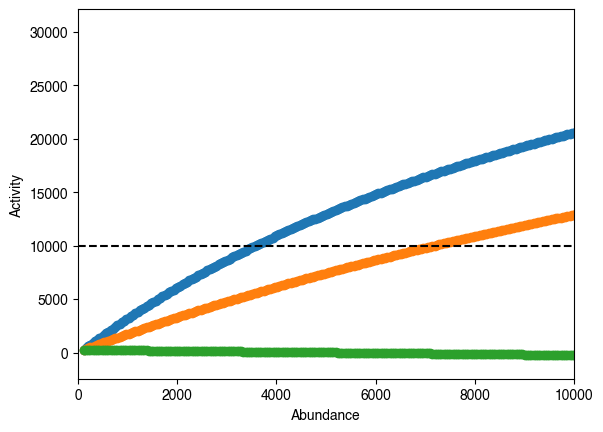

In [141]:
# When K is really large
abund = np.arange(0, 5, 0.01)

# act = [sc_act.inverse_transform(hill_activation(a).reshape(1, -1)) for a in abund]
act3 = [sc_act.inverse_transform(hill_activation(a/(1/0.10747534 + 1)).reshape(1, -1)) for a in abund]
act4 = [sc_act.inverse_transform(hill_activation(a/(1/0.05 + 1)).reshape(1, -1)) for a in abund]
act5 = [sc_act.inverse_transform(hill_activation(a/(1/-0.0013498521 + 1)).reshape(1, -1)) for a in abund]

abund = [sc_abund.inverse_transform(a.reshape(1, -1)) for a in abund]
# plt.scatter(abund, act)
plt.scatter(abund, act3)
plt.scatter(abund, act4)
plt.scatter(abund, act5)

plt.xlabel("Abundance")
plt.ylabel("Activity")

# Actually range of observed activity/abundance is much smaller

plt.xlim(0, 10000)
plt.hlines(10000, xmin=0, xmax=10000, linestyle='--', color='black')
# plt.ylim(0, 10000)

Text(0, 0.5, 'Activity')

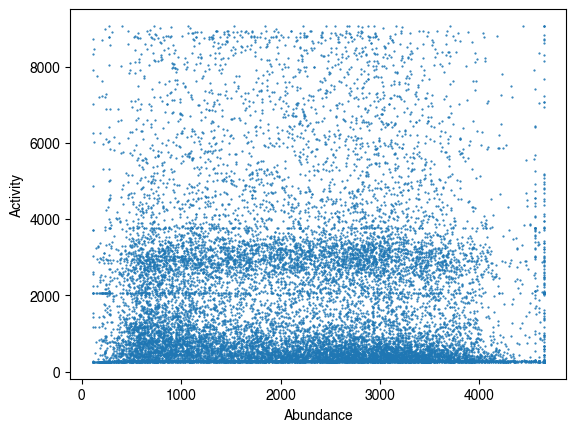

In [ ]:
plt.scatter(tile_data['abundance'], tile_data['activity'], s=0.3)
plt.xlabel("Abundance")
plt.ylabel("Activity")

# Color by standard deviation

In [139]:
from Bio.Seq import Seq


In [140]:
full_data = pd.read_csv('Data/pm_gcn4_sort2_pools_allchannels.csv', index_col=0)
full_data['gfp_std'] = [np.abs(a - b)/2 for a, b in zip(full_data['Activity_gfpA'], full_data['Activity_gfpB'])]
full_data['cherry_std'] = [np.abs(a - b)/2 for a, b in zip(full_data['Activity_cherryA'], full_data['Activity_cherryB'])]

In [141]:
full_data['aa_seq'] = [str(Seq(seq).translate()) for seq in full_data["ArrayDNA"]]

In [143]:
full_data = full_data.merge(tile_data, on='aa_seq')

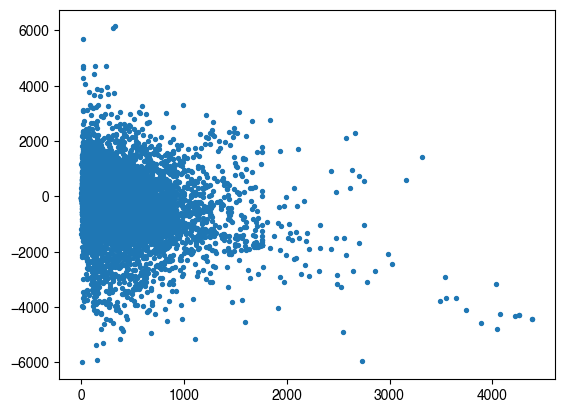

In [145]:
plt.scatter(full_data.dropna()['gfp_std'], full_data.dropna()['simple_error'], s=8)

PearsonRResult(statistic=0.8737404474842785, pvalue=5.04044036391548e-28)

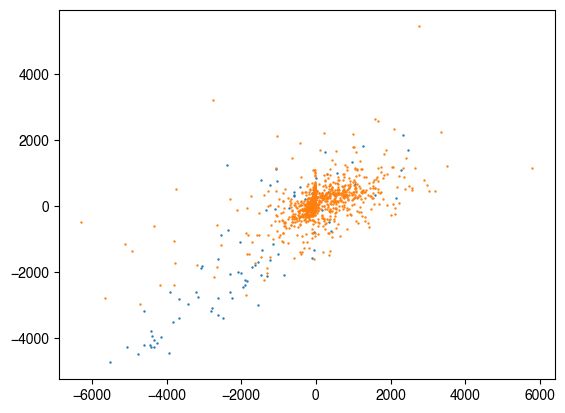

In [183]:
high_std_subset = full_data[full_data['gfp_std'] > 2000]
plt.scatter(high_std_subset['two_state_error'], high_std_subset['adhunter_error'], s=0.5)

low_std_subset = full_data[full_data['gfp_std'] < 50]
plt.scatter(low_std_subset['two_state_error'], low_std_subset['adhunter_error'], s=0.5)


pearsonr(high_std_subset['two_state_error'], high_std_subset['adhunter_error'])

PearsonRResult(statistic=0.5334496145023515, pvalue=5.245880075889996e-186)

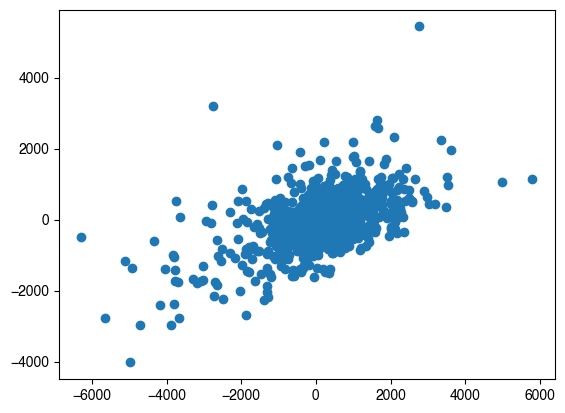

In [149]:
lower_std_subset = full_data[full_data['gfp_std'] < 100]
plt.scatter(lower_std_subset['two_state_error'], lower_std_subset['adhunter_error'])

pearsonr(lower_std_subset['two_state_error'], lower_std_subset['adhunter_error'])

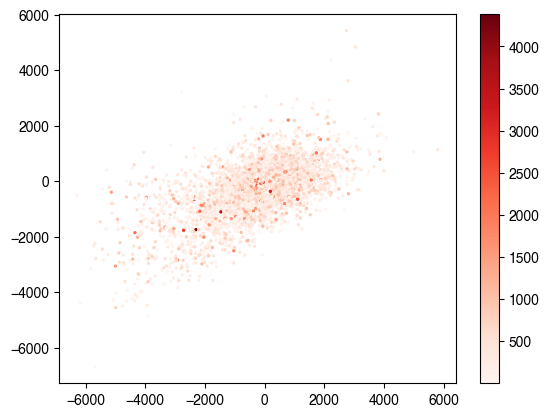

In [190]:
plt.scatter(full_data.dropna().sort_values('gfp_std', ascending=False)['two_state_error'], full_data.dropna().sort_values('gfp_std', ascending=False)['adhunter_error'], c=full_data.dropna()['gfp_std'], s=2, cmap='Reds')
plt.colorbar()

In [ ]:
plt.scatter(full_data.sort_values('gfp_std', ascending=False)['two_state_error'], full_data.sort_values('gfp_std', ascending=False)['adhunter_error'], c=full_data['gfp_std'], s=8, alpha=0.3)
plt.colorbar()

# Regress out composition

In [61]:
train_tiles

,aa_seq,activity,abundance,biophysics_gfp_pred,k_bound,biophysics_cherry_pred,biophysics_gfp_pred_3,biophysics_mcherry_pred_3,simple_gfp_pred,simple_mcherry_pred,...,I,L,M,F,Y,W,two_state_error,adhunter_error,two_state_abund_error,simple_error
0,MALRIEVYNRIESSTASTALQRQDLRYTFRSNARAASGQA,NaN,NaN,236.143646,[-0.00037483659],1744.407837,238.927063,238.927063,234.891769,3885.974609,...,2,3,1,1,2,0,NaN,NaN,NaN,NaN
1,EVYNRIESSTASTALQRQDLRYTFRSNARAASGQANANYQ,309.526097,2603.656188,226.226440,[-0.00041121515],2343.002930,225.738174,225.738174,234.841873,4431.925781,...,1,2,0,1,3,0,-83.299657,286.107020,-260.653259,-74.684224
2,IESSTASTALQRQDLRYTFRSNARAASGQANANYQAFTAG,531.543071,1225.351683,295.133728,[0.0008361512],1557.616943,411.938568,411.938568,246.472260,3359.837158,...,1,2,0,2,2,0,-236.409343,174.554035,332.265260,-285.070812
3,ASTALQRQDLRYTFRSNARAASGQANANYQAFTAGSALNG,711.300533,3242.686745,361.574127,[0.0030219432],1194.671509,550.178101,550.178101,248.540665,2945.020264,...,0,3,0,2,2,0,-349.726406,-13.088802,-2048.015236,-462.759868
4,QRQDLRYTFRSNARAASGQANANYQAFTAGSALNGPSLPA,1004.461126,774.929643,897.417053,[0.015446682],1429.498535,880.957520,880.957520,248.034790,3008.602051,...,0,3,0,2,2,0,-107.044073,-294.757940,654.568893,-756.426336
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27890,VAVKRARNTMAARKSRRRKLEKQEQMEDRIRELEAMLAKS,378.631702,745.735669,219.236664,[-0.000750673],1619.993774,223.511703,223.511703,240.071548,3286.077148,...,1,3,3,0,0,0,-159.395038,-10.857959,874.258105,-138.560153
27891,ARNTMAARKSRRRKLEKQEQMEDRIRELEAMLAKSEKDVQ,256.000000,4604.500000,202.504196,[-0.0006827887],2524.445801,208.548279,208.548279,240.787033,5344.325195,...,1,3,3,0,0,0,-53.495804,61.929016,-2080.054199,-15.212967
27892,AARKSRRRKLEKQEQMEDRIRELEAMLAKSEKDVQYWKAM,NaN,NaN,249.547348,[-0.00010575009],1993.483765,244.715240,244.715240,245.494003,3177.253418,...,1,3,3,0,1,1,NaN,NaN,NaN,NaN
27893,RRRKLEKQEQMEDRIRELEAMLAKSEKDVQYWKAMAQTSM,994.731498,3471.072844,240.979523,[-0.00025494222],1928.079224,244.537186,244.537186,253.951706,4167.007812,...,1,3,4,0,1,1,-753.751976,-342.259758,-1542.993620,-740.779792


In [62]:
composition = tile_data[['R', 'H', 'K', 'D', 'E', 'S', 'T','N', 'Q', 'C', 'G', 'P', 'A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W']]
# composition = train_tiles.dropna(subset=['activity'])[['R', 'H', 'K', 'D', 'E', 'S', 'T','N', 'Q', 'C', 'G', 'P', 'A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W']]
composition

,R,H,K,D,E,S,T,N,Q,C,G,P,A,V,I,L,M,F,Y,W
0,5,4,0,2,0,1,1,4,7,0,1,4,1,1,2,5,0,2,0,0
1,3,2,0,1,5,2,2,0,3,0,5,1,0,3,2,5,1,1,1,3
2,3,3,2,2,4,9,2,0,1,0,4,4,1,4,0,1,0,0,0,0
3,3,0,0,1,0,5,5,2,1,1,3,3,4,5,1,4,1,1,0,0
4,2,2,0,2,0,10,3,1,7,0,1,4,3,1,2,2,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17727,0,0,0,6,1,5,1,3,1,0,5,4,2,2,0,2,0,6,1,1
17728,1,1,1,7,0,2,2,2,3,0,2,1,6,2,0,5,1,4,0,0
17729,0,0,0,6,1,6,3,2,2,0,4,4,1,1,0,2,0,5,2,1
17730,0,1,1,3,4,4,5,1,1,0,3,4,1,1,2,2,2,5,0,0


In [63]:
composition_test = test_tiles.dropna(subset=['activity'])[['R', 'H', 'K', 'D', 'E', 'S', 'T','N', 'Q', 'C', 'G', 'P', 'A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W']]


In [64]:
y_act_train = tile_data.dropna(subset=['activity'])[['activity']]
# y_act_train = train_tiles.dropna(subset=['activity'])[['activity']]
# y_act_test = test_tiles.dropna(subset=['activity'])[['activity']]

# y_act_train = tile_data.dropna(subset=['activity'])[['ratio']]

In [65]:
reg_act = LinearRegression().fit(composition, y_act_train)

In [66]:
predictions = reg_act.predict(composition) 
predictions_test = reg_act.predict(composition_test)

In [67]:
tile_data['composition_predictor'] = predictions
tile_data['composition_predictor_error'] = tile_data['composition_predictor'] - tile_data['activity']

In [68]:
tile_data[tile_data['composition_predictor_error'] < -2000]['activity']

80       4323.649117
180      1262.369102
291       431.489980
489      7432.021524
566      4352.776616
            ...     
17725    8343.122503
17727    8178.009196
17728    9064.000000
17729    9064.000000
17731    7746.532874
Name: activity, Length: 1187, dtype: float64

In [69]:
tile_data[tile_data['composition_predictor'] < -2000]['composition_predictor']

Series([], Name: composition_predictor, dtype: float64)

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


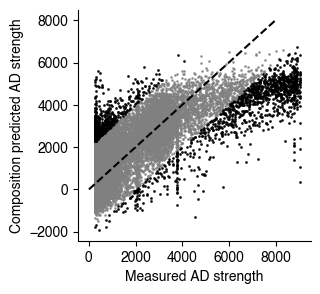

In [82]:
plt.figure(figsize=(3, 3))
plt.scatter(y_act_train, predictions, s=0.8, alpha=0.8, color='grey')
plt.scatter(tile_data[tile_data['composition_predictor_error'] < -2000]['activity'], tile_data[tile_data['composition_predictor_error'] < -2000]['composition_predictor'],  s=0.8, alpha=0.8, color='black')
plt.scatter(tile_data[tile_data['composition_predictor_error'] > 2000]['activity'], tile_data[tile_data['composition_predictor_error'] > 2000]['composition_predictor'],  s=0.8, alpha=0.8, color='black')

plt.plot([0, 8000], [0, 8000], color='black', linestyle='--')
pearsonr(predictions, y_act_train)

plt.ylabel("Composition predicted AD strength")
plt.xlabel("Measured AD strength")

sns.despine()
plt.savefig("figures/for_revision/composition_scatter.pdf", format='pdf', bbox_inches='tight')

PearsonRResult(statistic=0.8046220022437055, pvalue=0.0)

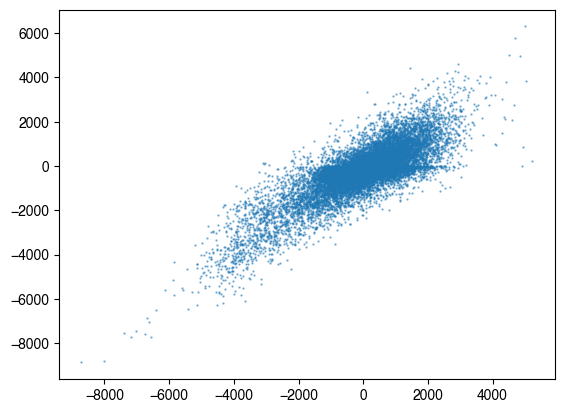

In [166]:
plt.scatter(tile_data['composition_predictor_error'] , tile_data['two_state_error'], s=0.5, alpha=0.5)
pearsonr(tile_data['composition_predictor_error'] , tile_data['two_state_error'])

PearsonRResult(statistic=0.6907461351632656, pvalue=0.0)

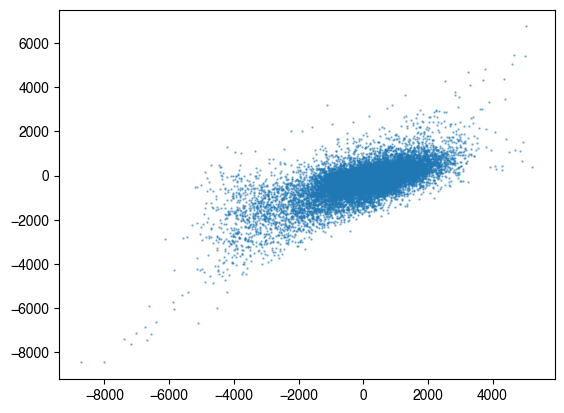

In [167]:
plt.scatter(tile_data['composition_predictor_error'] , tile_data['adhunter_error'], s=0.5, alpha=0.5)
pearsonr(tile_data['composition_predictor_error'] , tile_data['adhunter_error'])

<function matplotlib.pyplot.vlines(x: 'float | ArrayLike', ymin: 'float | ArrayLike', ymax: 'float | ArrayLike', colors: 'ColorType | Sequence[ColorType] | None' = None, linestyles: 'LineStyleType' = 'solid', *, label: 'str' = '', data=None, **kwargs) -> 'LineCollection'>

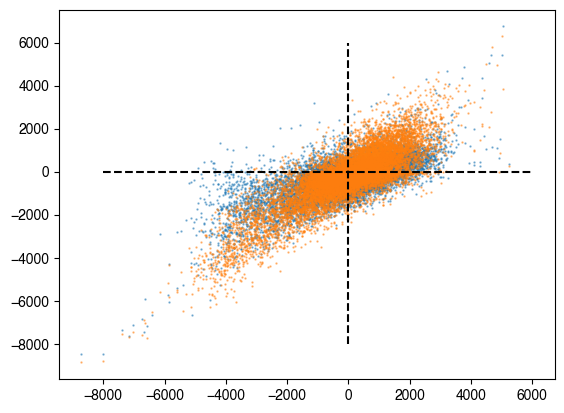

In [171]:
plt.scatter(tile_data['composition_predictor_error'] , tile_data['adhunter_error'], s=0.5, alpha=0.5)
plt.scatter(tile_data['composition_predictor_error'] , tile_data['two_state_error'], s=0.5, alpha=0.5)

plt.hlines(0, -8000, 6000, color='black', linestyles='--')
plt.vlines(0, -8000, 6000, color='black', linestyles='--')
plt.vlines

PearsonRResult(statistic=0.4103433048704802, pvalue=4.09327565919373e-28)

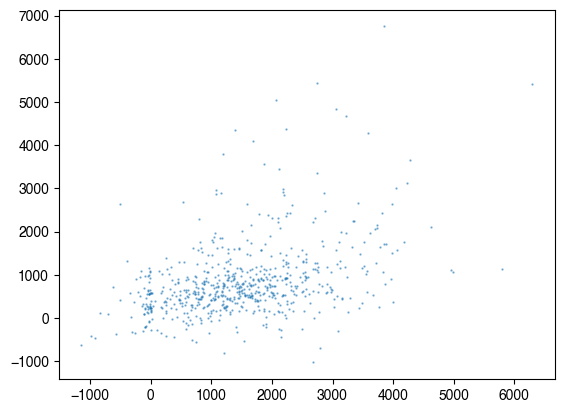

In [172]:
plt.scatter(tile_data[tile_data['composition_predictor_error'] > 2000]['two_state_error'], tile_data[tile_data['composition_predictor_error'] > 2000]['adhunter_error'], s=0.5, alpha=0.5)
pearsonr(tile_data[tile_data['composition_predictor_error'] > 2000]['two_state_error'] , tile_data[tile_data['composition_predictor_error'] > 2000]['adhunter_error'])

In [192]:
AARKSRERKAQKLEELEEQIEKLTAERDHWKNLAMERGQK

NameError: name 'AARKSRERKAQKLEELEEQIEKLTAERDHWKNLAMERGQK' is not defined

(array([3.000, 6.000, 4.000, 3.000, 14.000, 6.000, 27.000, 13.000, 10.000,
        14.000]),
 array([-8459.770, -7566.085, -6672.399, -5778.714, -4885.028, -3991.343,
        -3097.658, -2203.972, -1310.287, -416.601, 477.084]),
 <BarContainer object of 10 artists>)

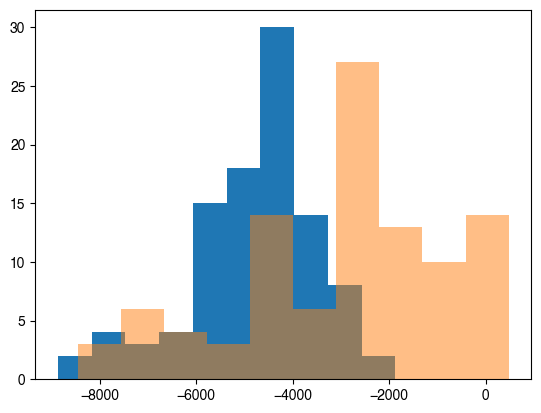

In [235]:
plt.hist(tile_data.sort_values('composition_predictor_error')[:100]['two_state_error'])
plt.hist(tile_data.sort_values('composition_predictor_error')[:100]['adhunter_error'], alpha=0.5)

In [236]:
sorted_tile_data = tile_data.sort_values('composition_predictor_error')
sorted_tile_data[(sorted_tile_data['adhunter_error'] < 100) & (sorted_tile_data['adhunter_error'] > -100) & (sorted_tile_data['two_state_error'] < -2000) & (sorted_tile_data['two_state_error'] < 2000)][:10].columns

Index(['aa_seq', 'activity', 'abundance', 'ratio', 'biophysics_gfp_pred',
       'k_bound', 'biophysics_cherry_pred', 'biophysics_gfp_pred_3',
       'biophysics_mcherry_pred_3', 'simple_gfp_pred', 'simple_mcherry_pred',
       'adhunter_gfp_pred', 'adhunter_mcherry_pred', 'charge', 'aromatic',
       'positive', 'negative', 'R', 'H', 'K', 'D', 'E', 'S', 'T', 'N', 'Q',
       'C', 'G', 'P', 'A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W',
       'two_state_error', 'two_state_abund_error', 'adhunter_error',
       'simple_error', 'X', 'linear_regression', 'regression_error',
       'composition_predictor', 'composition_predictor_error'],
      dtype='object')

In [237]:
sorted_tile_data[(sorted_tile_data['adhunter_error'] < 100) & (sorted_tile_data['adhunter_error'] > -100) & (sorted_tile_data['two_state_error'] < -2000) & (sorted_tile_data['two_state_error'] < 2000)][:10]['aromatic']

13559    4
12419    5
14217    4
13473    3
12128    3
12829    5
13543    4
13547    4
13326    5
12863    4
Name: aromatic, dtype: int64

In [240]:
sorted_tile_data[(sorted_tile_data['adhunter_error'] < 100) & (sorted_tile_data['adhunter_error'] > -100) & (sorted_tile_data['two_state_error'] < -2000) & (sorted_tile_data['two_state_error'] < 2000)][:10][['negative', 'activity', 'aromatic', 'positive']]

,negative,activity,aromatic,positive
13559,7,8298.434242,4,0
12419,7,8692.787102,5,0
14217,6,8283.554717,4,1
13473,11,8879.444175,3,1
12128,8,8338.511028,3,1
12829,6,8923.000000,5,0
13543,7,8227.851031,4,1
13547,11,8884.715031,4,1
13326,6,8817.270537,5,0
12863,5,7157.585387,4,1


In [251]:
sorted_tile_data.loc[13559][['aa_seq']+ list(composition.columns)]

aa_seq    DPEVAFEEWFLSTDYQGLPSDFSPLTGVHDTSSPSIGPTI
R                                                0
H                                                1
K                                                0
D                                                4
E                                                3
S                                                6
T                                                4
N                                                0
Q                                                1
C                                                0
G                                                3
P                                                5
A                                                1
V                                                2
I                                                2
L                                                3
M                                                0
F                                                3
Y                              

In [252]:
tile_data.columns

Index(['aa_seq', 'activity', 'abundance', 'ratio', 'biophysics_gfp_pred',
       'k_bound', 'biophysics_cherry_pred', 'biophysics_gfp_pred_3',
       'biophysics_mcherry_pred_3', 'simple_gfp_pred', 'simple_mcherry_pred',
       'adhunter_gfp_pred', 'adhunter_mcherry_pred', 'charge', 'aromatic',
       'positive', 'negative', 'R', 'H', 'K', 'D', 'E', 'S', 'T', 'N', 'Q',
       'C', 'G', 'P', 'A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W',
       'two_state_error', 'two_state_abund_error', 'adhunter_error',
       'simple_error', 'X', 'linear_regression', 'regression_error',
       'composition_predictor', 'composition_predictor_error'],
      dtype='object')

In [ ]:
9064.0
6733.499072 # Composition predictor only goes this high!!
8460.000977 # biophysics goes this high!

In [259]:
tile_data.loc[9485] #.sort_values('biophysics_gfp_pred', ascending=False)

aa_seq                                  ITDQVFSNDNVSIFDEKLDSSTWTSLFDNNDDFNEFDDMN
activity                                                             8826.013163
abundance                                                            2407.748393
ratio                                                              260810.825261
biophysics_gfp_pred                                                  8710.362305
k_bound                                                             [0.08095114]
biophysics_cherry_pred                                               4323.908203
biophysics_gfp_pred_3                                                8460.000977
biophysics_mcherry_pred_3                                            4323.908203
simple_gfp_pred                                                      8114.787598
simple_mcherry_pred                                                  7751.819336
adhunter_gfp_pred                                                    8270.336914
adhunter_mcherry_pred       

In [ ]:
# Highly active sequence, composition looks strong??

In [246]:
for aa, num in zip(composition.columns, reg_act.coef_[0]):
    print(aa, num)

R -173.0456637178569
H -150.78765646861046
K -226.00683963654066
D 295.18452520145127
E 29.258100336636705
S -31.254006963130134
T -81.83826444152629
N -67.43698977854612
Q -119.14464827360699
C -263.45709136510243
G -25.252009795961722
P -41.02536846628163
A -60.361359403375516
V -103.79034370703336
I -52.23959931681743
L 40.29550791202481
M 159.8286414235368
F 373.66712315388486
Y 47.84090191797707
W 449.56504138891836


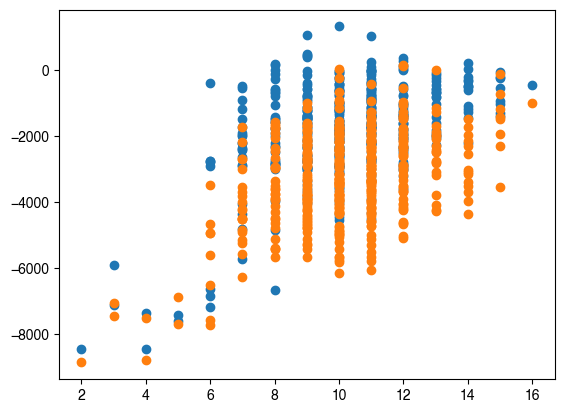

In [ ]:
plt.scatter(sorted_tile_data[sorted_tile_data['activity'] > 8000]['F'] + sorted_tile_data[sorted_tile_data['activity'] > 8000]['D'] + sorted_tile_data[sorted_tile_data['activity'] > 8000]['W'], sorted_tile_data[sorted_tile_data['activity'] > 8000]['adhunter_error'])

plt.scatter(sorted_tile_data[sorted_tile_data['activity'] > 8000]['F'] + sorted_tile_data[sorted_tile_data['activity'] > 8000]['D'] + sorted_tile_data[sorted_tile_data['activity'] > 8000]['W'], sorted_tile_data[sorted_tile_data['activity'] > 8000]['two_state_error'])


In [284]:
sorted_tile_data[sorted_tile_data['activity'] > 8000].sort_values('two_state_error')[['aa_seq', 'adhunter_error', 'composition_predictor_error', 'two_state_error', 'F', 'W', "D", "M", "L"]]

,aa_seq,adhunter_error,composition_predictor_error,two_state_error,F,W,D,M,L
16127,AARKSRERKAQKLEELEEQIEKLTAERDHWKNLAMERGQK,-8459.770325,-8712.801266,-8870.617935,0,1,1,1,4
10337,QYGSQDRSLQQDRVVHGFHGSAAAGPSTFRSNARAASGQA,-8453.411194,-8021.144102,-8810.679123,2,0,2,0,1
5022,PQPPWLPSSSSSLPAQSPQHKSHQDFSLPDPQPQPHQDFV,-7191.296875,-6574.788086,-7730.371826,2,1,3,0,3
10177,GLRLLFFSSPLITTIFQIIIKNHTATEARQNALNHRLQFD,-7617.075195,-7167.308100,-7707.007324,4,0,1,0,6
9628,HSFQSPPQQDFVLFDSPQPTRTTVNRSASSPATAAVSAFG,-6848.513916,-6746.556986,-7586.498291,4,0,2,0,1
...,...,...,...,...,...,...,...,...,...
9485,ITDQVFSNDNVSIFDEKLDSSTWTSLFDNNDDFNEFDDMN,-555.676248,-2675.441744,-115.650858,5,1,9,1,2
13532,TSPSLYDESPDFGSGFDVSPNFAGSDFDAGGNDVWFPLFP,-577.616762,-2173.052485,-13.885317,6,1,6,0,2
14103,DIDASPFINDSFETSPMFQGEPMLNSSNDWFSLFPEEENK,-1918.720225,-2925.634269,35.886221,5,1,4,2,2
17516,PEWGVDDNFDVSPFVGNNNGDLDHALSGDPWYPLFPQEDQ,-1799.093011,-3066.793513,103.471442,3,2,7,0,3


In [287]:
tile_data.to_csv("Data/residual_df.csv")

(array([2.000, 5.000, 4.000, 20.000, 56.000, 102.000, 93.000, 107.000,
        30.000, 10.000]),
 array([-8870.618, -7970.696, -7070.774, -6170.851, -5270.929, -4371.007,
        -3471.085, -2571.163, -1671.241, -771.319, 128.604]),
 <BarContainer object of 10 artists>)

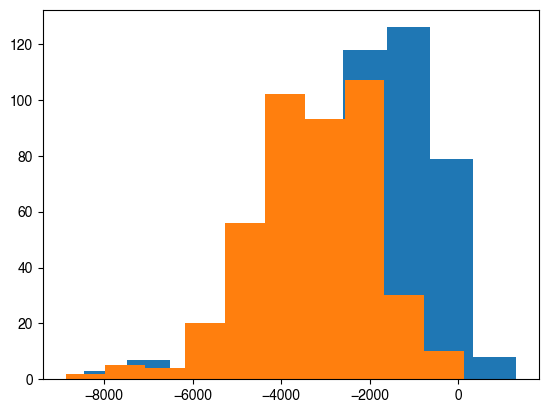

In [273]:
plt.hist(sorted_tile_data[sorted_tile_data['activity'] > 8000]['adhunter_error'])
plt.hist(sorted_tile_data[sorted_tile_data['activity'] > 8000]['two_state_error'])

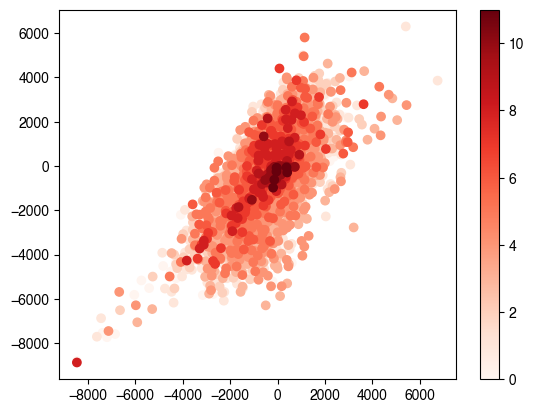

In [296]:
plt.scatter(sorted_tile_data.sort_values("E")['adhunter_error'], sorted_tile_data.sort_values("E")['two_state_error'], c = sorted_tile_data.sort_values("E")['E'], cmap='Reds')
plt.colorbar()

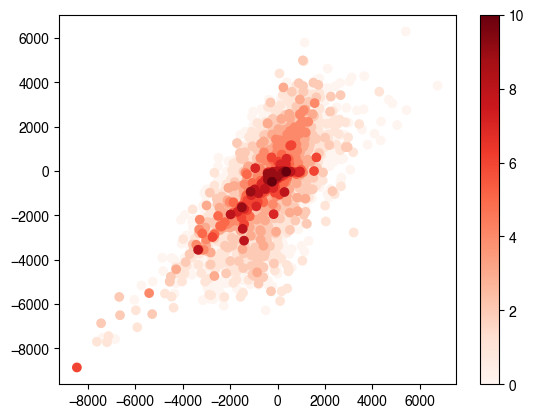

In [297]:
plt.scatter(sorted_tile_data.sort_values("K")['adhunter_error'], sorted_tile_data.sort_values("K")['two_state_error'], c = sorted_tile_data.sort_values("K")['K'], cmap='Reds')
plt.colorbar()

In [305]:
sorted_tile_data[(sorted_tile_data["activity"] >= 2000) & (sorted_tile_data["adhunter_error"] > -100) & (sorted_tile_data["two_state_error"] < -2000)][["E", "K", "D", 'activity', 'adhunter_error', 'two_state_error']]


,E,K,D,activity,adhunter_error,two_state_error
17713,4,1,3,9022.555699,173.498012,-5427.282506
17716,4,1,4,9064.000000,455.898438,-4530.262695
11844,3,1,4,8804.199914,477.084265,-4427.944055
12158,3,1,5,8646.465180,154.161773,-3956.088715
14026,4,1,4,8782.000000,386.905273,-4235.485352
...,...,...,...,...,...,...
13716,5,0,2,5476.471759,542.523359,-2240.069659
13364,4,0,3,2971.387113,-62.224271,-2242.071439
12547,2,1,6,5296.306741,351.113669,-2171.798196
13565,3,0,5,5597.986235,878.289156,-2629.081449


(array([1.000, 0.000, 0.000, 1.000, 1.000, 22.000, 80.000, 69.000, 44.000,
        10.000]),
 array([-8459.770, -7457.382, -6454.993, -5452.604, -4450.215, -3447.827,
        -2445.438, -1443.049, -440.661, 561.728, 1564.117]),
 <BarContainer object of 10 artists>)

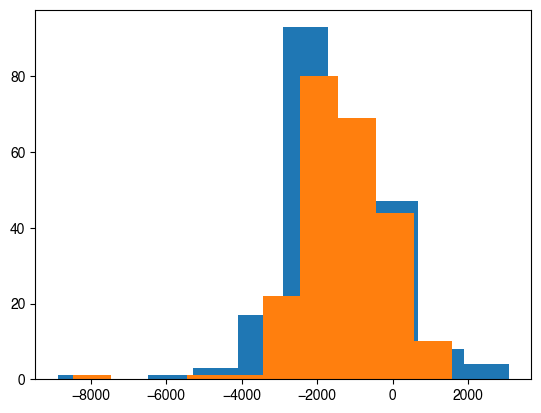

In [313]:
plt.hist(sorted_tile_data[(sorted_tile_data["activity"] >= 2000) & (sorted_tile_data['K'] > 2)]['two_state_error'])
plt.hist(sorted_tile_data[(sorted_tile_data["activity"] >= 2000) & (sorted_tile_data['K'] > 2)]['adhunter_error'])

In [306]:
sorted_tile_data[(sorted_tile_data["activity"] >= 2000) & (sorted_tile_data["adhunter_error"] > -100) & (sorted_tile_data["two_state_error"] < -2000)][["E", "K"]].value_counts() #.unsqueeze(0)


E  K
3  1    9
4  1    9
0  0    8
1  0    8
   1    6
3  0    6
4  0    6
2  0    3
   1    3
0  1    2
4  2    2
2  2    1
3  2    1
   3    1
5  0    1
   1    1
   2    1
Name: count, dtype: int64

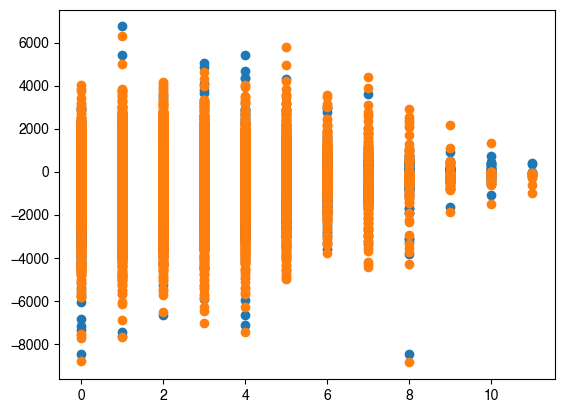

In [293]:
plt.scatter(sorted_tile_data["E"], sorted_tile_data['adhunter_error'])
plt.scatter(sorted_tile_data["E"], sorted_tile_data['two_state_error'])
# plt.scatter(sorted_tile_data["E"], sorted_tile_data['biophysics_gfp_pred'])

In [266]:
# Less F and W and D but correctly arranged??

sorted_tile_data[sorted_tile_data['activity'] > 8000][['F', 'D', 'W']].value_counts()

F  D  W
5  5  1    29
4  5  1    21
3  7  1    20
4  4  1    20
5  4  1    19
           ..
3  7  2     1
   9  0     1
      1     1
4  1  0     1
8  1  0     1
Name: count, Length: 88, dtype: int64

In [241]:
sorted_tile_data.loc[13559]

aa_seq                                  DPEVAFEEWFLSTDYQGLPSDFSPLTGVHDTSSPSIGPTI
activity                                                             8298.434242
abundance                                                            2864.382164
ratio                                                              244050.058995
biophysics_gfp_pred                                                  3663.690918
k_bound                                                            [0.069340445]
biophysics_cherry_pred                                                1854.30835
biophysics_gfp_pred_3                                                3360.710205
biophysics_mcherry_pred_3                                             1854.30835
simple_gfp_pred                                                      4383.171387
simple_mcherry_pred                                                  4157.751465
adhunter_gfp_pred                                                    8302.228516
adhunter_mcherry_pred       

In [261]:
sorted_tile_data[(sorted_tile_data['negative'] < 2) & (sorted_tile_data['activity'] > 7000)]

,aa_seq,activity,abundance,ratio,biophysics_gfp_pred,k_bound,biophysics_cherry_pred,biophysics_gfp_pred_3,biophysics_mcherry_pred_3,simple_gfp_pred,...,W,two_state_error,two_state_abund_error,adhunter_error,simple_error,X,linear_regression,regression_error,composition_predictor,composition_predictor_error


(array([1.000, 3.000, 20.000, 47.000, 97.000, 131.000, 147.000, 120.000,
        58.000, 23.000]),
 array([-7730.372, -6899.835, -6069.299, -5238.763, -4408.226, -3577.690,
        -2747.153, -1916.617, -1086.081, -255.544, 574.992]),
 <BarContainer object of 10 artists>)

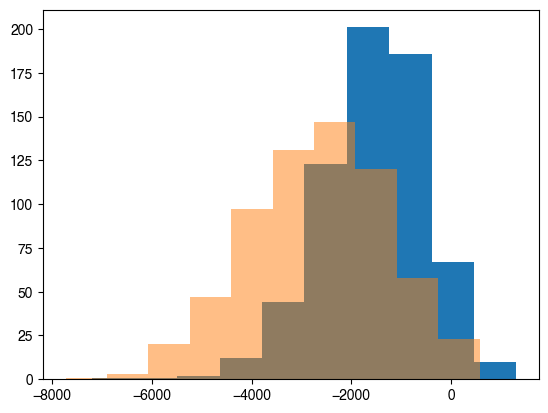

In [232]:
plt.hist(sorted_tile_data[(sorted_tile_data['negative'] < 2) & (sorted_tile_data['activity'] > 7000)]['adhunter_error'])
plt.hist(sorted_tile_data[(sorted_tile_data['negative'] < 2) & (sorted_tile_data['activity'] > 7000)]['two_state_error'], alpha=0.5)

In [210]:
sorted_tile_data[(sorted_tile_data['two_state_error'] < 100) & (sorted_tile_data['two_state_error'] > -100)]['negative'].value_counts()

negative
4     468
2     444
3     433
5     378
8     303
1     283
0     271
7     264
6     264
10    235
9     226
11    187
12    167
13     49
14     10
Name: count, dtype: int64

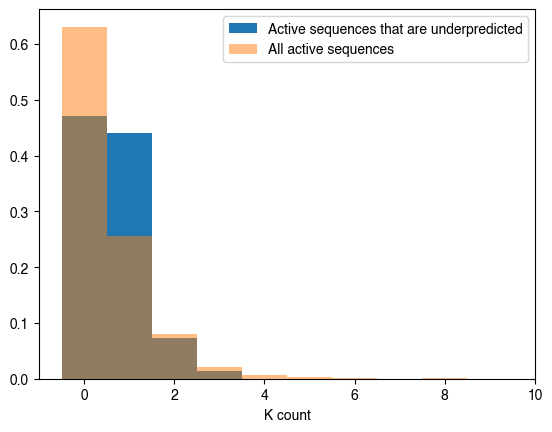

In [356]:
bins = np.arange(-0.5, 10.5, 1)
plt.hist(tile_data[(tile_data['activity'] > 2000) & (tile_data['two_state_error'] < -2000) & (tile_data['adhunter_error'] > -100)]["K"], density=True, label="Active sequences that are underpredicted", bins=bins)
plt.hist(tile_data[(tile_data['activity'] > 2000)]["K"], alpha=0.5, density=True, label="All active sequences", bins=bins)

plt.xlabel("K count")
plt.legend()

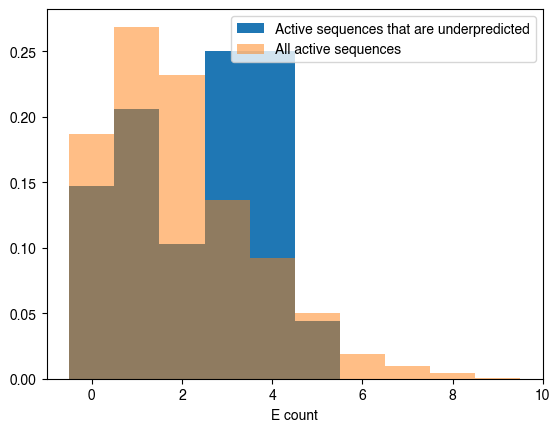

In [357]:
bins = np.arange(-0.5, 10.5, 1)
plt.hist(tile_data[(tile_data['activity'] > 2000) & (tile_data['two_state_error'] < -2000) & (tile_data['adhunter_error'] > -100)]["E"], density=True, label="Active sequences that are underpredicted", bins=bins)
plt.hist(tile_data[(tile_data['activity'] > 2000)]["E"], alpha=0.5, density=True, label="All active sequences", bins=bins)

plt.xlabel("E count")
plt.legend()

In [375]:
from scipy.stats import ks_2samp
from scipy.stats import mannwhitneyu



In [364]:
ks_2samp(tile_data[(tile_data['activity'] > 2000) & (tile_data['two_state_error'] < -2000)][aa], tile_data[(tile_data['activity'] > 2000)  & (tile_data['two_state_error'] > -2000)][aa])

KstestResult(statistic=0.06905097848492474, pvalue=0.0005580659981691612, statistic_location=2, statistic_sign=-1)

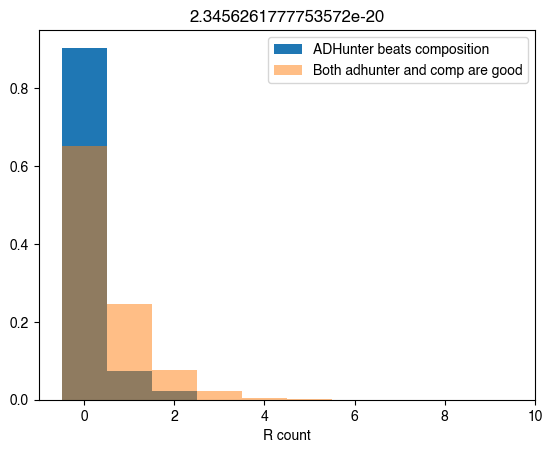

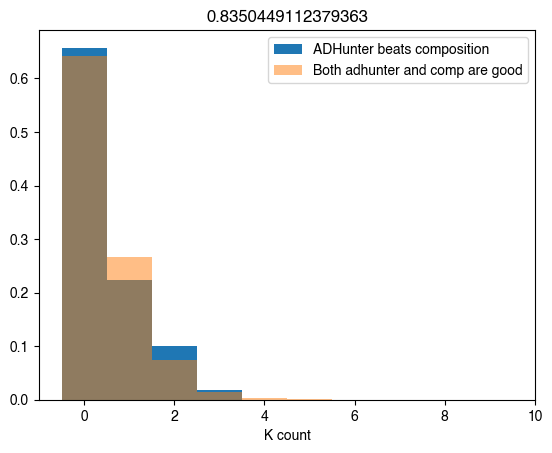

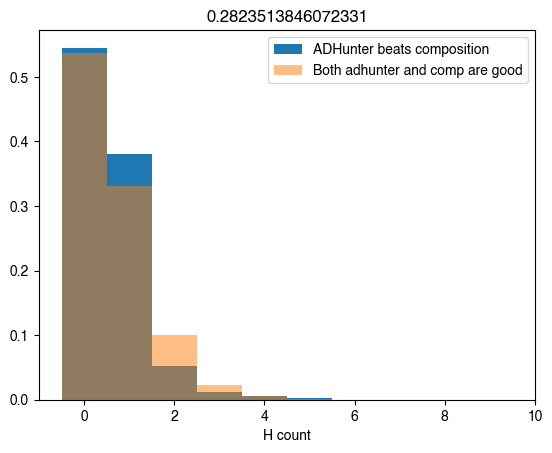

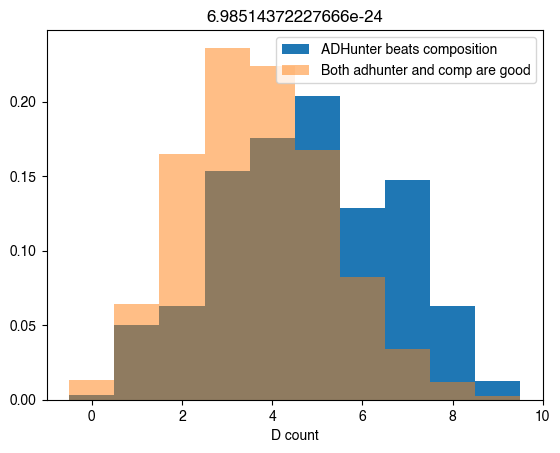

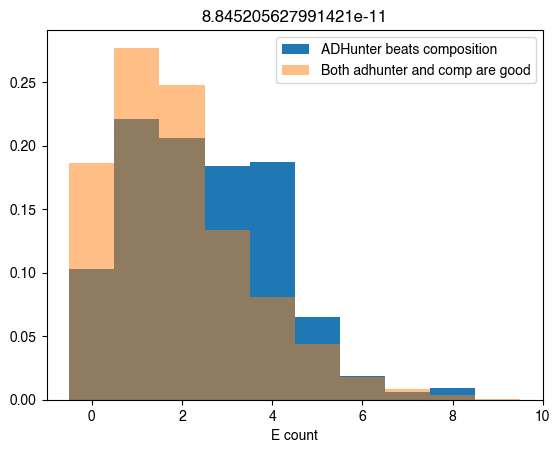

...

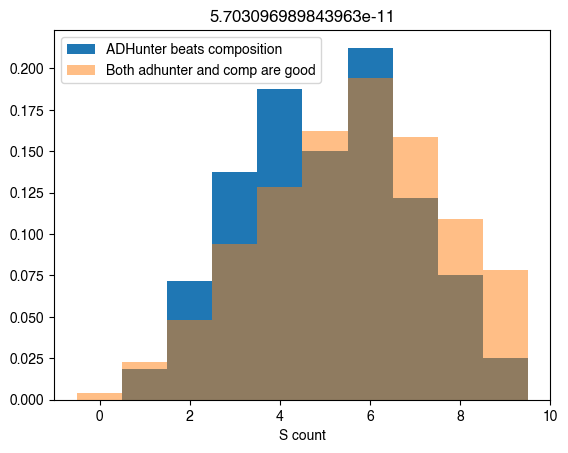

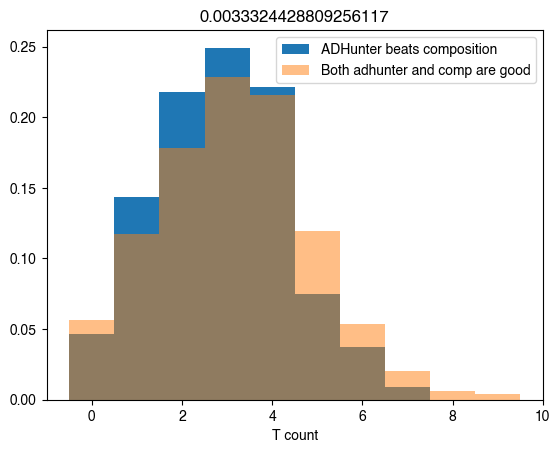

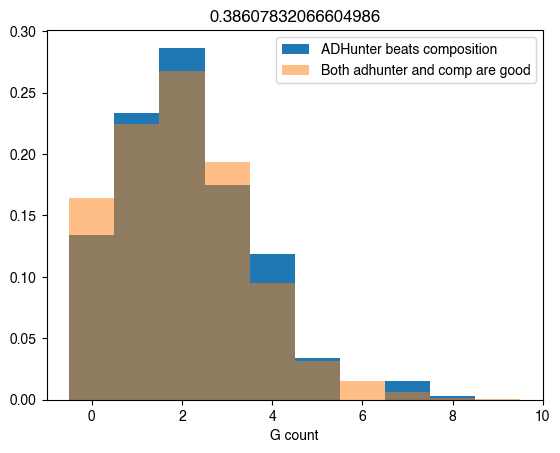

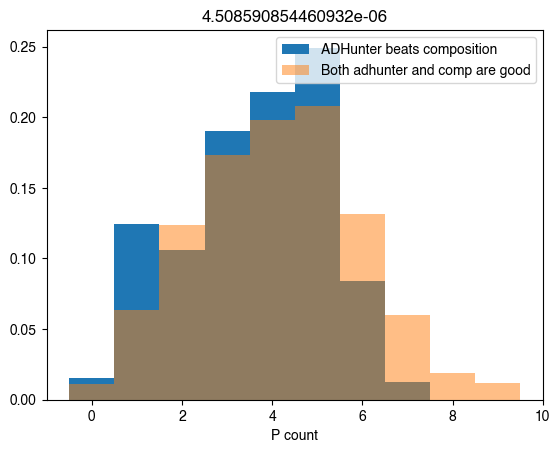

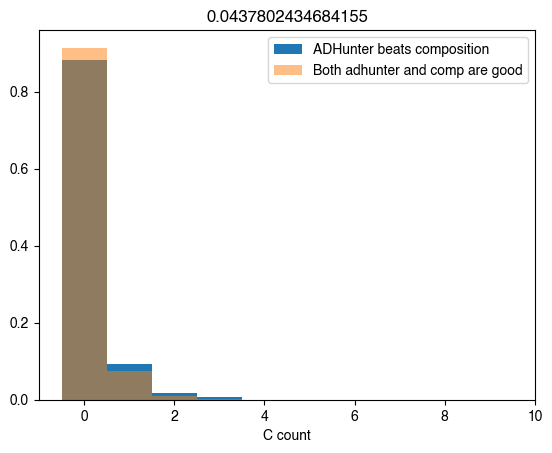

In [429]:
amino_acids = ["R","K","H","D","E","M","I","L","V","A","F","Y","W","Q","N","S","T","G","P","C"]

for aa in amino_acids: 
    bins = np.arange(-0.5, 10.5, 1)
    # data1 = tile_data[(tile_data['activity'] > 2000) & (tile_data['adhunter_error'] < -2000) & (tile_data['two_state_error'] > -100)][aa]
    data1 = tile_data[(tile_data['activity'] > 2000) &  (tile_data['composition_predictor_error'] < -2000) & (tile_data['adhunter_error'] > -1000)][aa]
    # data2 = tile_data[(tile_data['activity'] > 2000)  & (tile_data['adhunter_error'] < -2000) & (tile_data['two_state_error'] < -100) ][aa]
    data2 = tile_data[(tile_data['activity'] > 2000) & (tile_data['composition_predictor_error'] > -2000) & (tile_data['adhunter_error'] > -1000)][aa]

    plt.hist(data1, density=True, label="ADHunter beats composition", bins=bins)
    plt.hist(data2, alpha=0.5, density=True, label="Both adhunter and comp are good", bins=bins)

    stat, p = mannwhitneyu(data1, data2)

    plt.title(p)
    plt.xlabel(f"{aa} count")
    plt.legend()
    plt.show()

In [441]:
tile_data[tile_data['activity'] > 4000].sort_values(["D", "E"])[["D", "E", 'activity', 'adhunter_error', 'two_state_error']]

,D,E,activity,adhunter_error,two_state_error
5419,0,0,4519.000000,-4163.104309,-4274.406296
5915,0,0,4936.515694,-4222.361824,-4613.294990
6120,0,0,4559.428465,-4286.549497,-4352.568586
6581,0,0,4674.500000,-4224.127014,-4439.522751
10228,0,0,6331.820634,-4277.599199,-5066.242875
...,...,...,...,...,...
8628,10,2,5046.124217,475.384572,1154.966115
12156,10,2,6823.346481,-1108.519333,-1269.800095
14207,10,2,8699.984650,-670.823517,-1894.578400
11012,11,3,6001.631988,-419.630035,2151.572113


In [454]:
tile_data[(tile_data['activity'] > 4000) & (tile_data['D'] + tile_data['E'] <  2)][['activity', 'two_state_error', 'adhunter_error']]

,activity,two_state_error,adhunter_error
566,4352.776616,-2778.957525,-3097.972661
5419,4519.000000,-4274.406296,-4163.104309
5915,4936.515694,-4613.294990,-4222.361824
6120,4559.428465,-4352.568586,-4286.549497
6581,4674.500000,-4439.522751,-4224.127014
6677,4854.405384,-4608.884052,-3192.258533
8329,4674.500000,-4421.718903,-3796.034668
10098,4731.098495,-2514.719833,-3347.145126
10228,6331.820634,-5066.242875,-4277.599199
11330,4313.585740,-3334.551560,-2190.722215


<Axes: xlabel='aromatic', ylabel='error'>

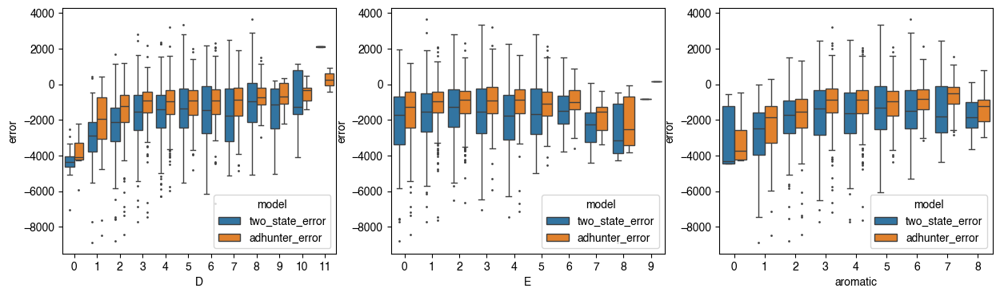

In [477]:
# reshape to long format
long_df = tile_data[(tile_data['activity'] > 4000)].melt(
    id_vars=['D', 'E', 'aromatic'],
    value_vars=['two_state_error', 'adhunter_error'],
    var_name='model',
    value_name='error'
)

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

sns.boxplot(
    data=long_df,
    x='D',
    y='error',
    hue='model',
    fliersize=1, 
    ax=axs[0]
)

sns.boxplot(
    data=long_df,
    x='E',
    y='error',
    hue='model',
    fliersize=1, 
    ax=axs[1]
)

sns.boxplot(
    data=long_df,
    x='aromatic',
    y='error',
    hue='model',
    fliersize=1, 
    ax=axs[2]
)

# plt.hlines(0, 0, 10, linestyles='--', color='black')
# sns.despine()
# plt.tight_layout()


In [57]:
tile_data.columns

Index(['aa_seq', 'activity', 'abundance', 'ratio', 'biophysics_gfp_pred',
       'k_bound', 'biophysics_cherry_pred', 'biophysics_gfp_pred_3',
       'biophysics_mcherry_pred_3', 'simple_gfp_pred', 'simple_mcherry_pred',
       'adhunter_gfp_pred', 'adhunter_mcherry_pred', 'charge', 'aromatic',
       'negative', 'positive', 'R', 'H', 'K', 'D', 'E', 'S', 'T', 'N', 'Q',
       'C', 'G', 'P', 'A', 'V', 'I', 'L', 'M', 'F', 'Y', 'W',
       'two_state_error', 'two_state_abund_error', 'adhunter_error',
       'simple_error'],
      dtype='object')

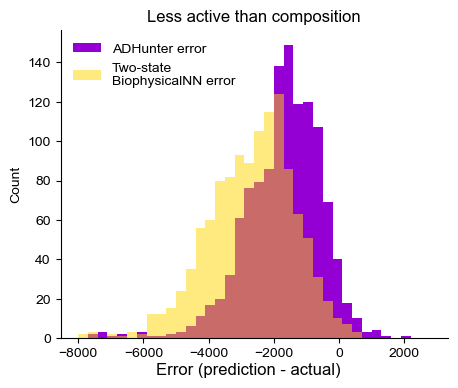

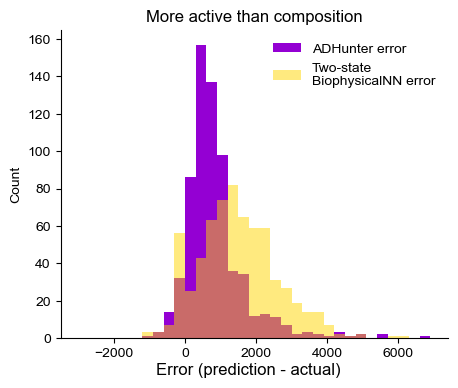

In [72]:
# More active than composition predicts - underprediction
fig, axs = plt.subplots(1, 1, figsize=(5, 4))
bins = np.arange(-8000, 3000, step=300)
axs.hist([tile_data[tile_data['composition_predictor_error'] < -2000]['adhunter_error']], bins=bins, label='ADHunter error', color='darkviolet')
axs.hist(tile_data[tile_data['composition_predictor_error'] < -2000]['two_state_error'], alpha=0.5, bins=bins, label="Two-state\nBiophysicalNN error", color='gold')
axs.legend(frameon=False)
axs.set_title("Less active than composition")
fig.supxlabel("Error (prediction - actual)")
axs.set_ylabel("Count")
sns.despine()
plt.savefig("figures/for_revision/residual_histograms_lower.pdf", format='pdf', bbox_inches='tight')

fig, axs = plt.subplots(1, 1, figsize=(5, 4))
bins = np.arange(-3000, 7000, step=300)
axs.hist(tile_data[tile_data['composition_predictor_error'] > 2000]['adhunter_error'], bins=bins, label='ADHunter error', color='darkviolet')
axs.hist(tile_data[tile_data['composition_predictor_error'] > 2000]['two_state_error'], alpha=0.5, bins=bins, label="Two-state\nBiophysicalNN error", color='gold')
axs.legend(frameon=False)
axs.set_title("More active than composition")

fig.supxlabel("Error (prediction - actual)")
axs.set_ylabel("Count")
sns.despine()

plt.savefig("figures/for_revision/residual_histograms_higher.pdf", format='pdf', bbox_inches='tight')


In [ ]:
from scipy import stats
# Predictor - actual
stats.ttest_ind(tile_data[tile_data['composition_predictor_error'] < -2000]['adhunter_error'], tile_data[tile_data['composition_predictor_error'] < -2000]['two_state_error'], equal_var=False)

TtestResult(statistic=18.40114357737793, pvalue=9.512654788525204e-71, df=2348.82205669853)

In [ ]:
# Predictor - actual
stats.ttest_ind(tile_data[tile_data['composition_predictor_error'] > 2000]['adhunter_error'], tile_data[tile_data['composition_predictor_error'] > 2000]['two_state_error'], equal_var=False)

TtestResult(statistic=-11.94926788491575, pvalue=3.0973958531193054e-31, df=1246.1695452472147)

In [545]:
from scipy.stats import ttest_ind
dist1 = tile_data[tile_data['composition_predictor_error'] < -2000]['adhunter_error']
dist2 = tile_data[tile_data['composition_predictor_error'] < -2000]['two_state_error']
tstat, pval = ttest_ind(dist1, dist2, equal_var=False)
pval

9.512654788525204e-71

In [546]:
from scipy.stats import ttest_ind
dist1 = tile_data[tile_data['composition_predictor_error'] > 2000]['adhunter_error']
dist2 = tile_data[tile_data['composition_predictor_error'] > 2000]['two_state_error']
tstat, pval = ttest_ind(dist1, dist2, equal_var=False)
pval

3.0973958531193054e-31

In [544]:
from scipy.stats import ttest_ind
dist1 = tile_data[(tile_data['composition_predictor_error'] > -100) &( tile_data['composition_predictor_error'] < 100) ]['adhunter_error']
dist2 = tile_data[(tile_data['composition_predictor_error'] > -100) &( tile_data['composition_predictor_error'] < 100) ]['two_state_error']
tstat, pval = ttest_ind(dist1, dist2, equal_var=False)
pval

0.1639506637030712

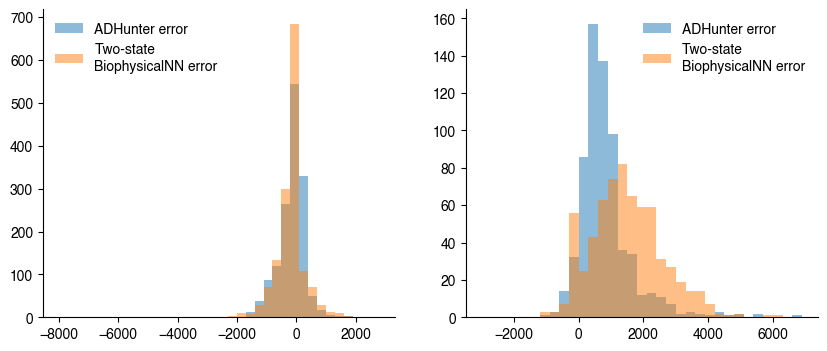

In [541]:
# More active than composition predicts - underprediction
fig, axs = plt.subplots(1, 2, figsize=(10, 4))
bins = np.arange(-8000, 3000, step=300)
axs[0].hist(tile_data[(tile_data['composition_predictor_error'] > -100) &( tile_data['composition_predictor_error'] < 100) ]['adhunter_error'], alpha=0.5, bins=bins, label='ADHunter error')
axs[0].hist(tile_data[(tile_data['composition_predictor_error'] > -100) &( tile_data['composition_predictor_error'] < 100) ]['two_state_error'], alpha=0.5, bins=bins, label="Two-state\nBiophysicalNN error")
axs[0].legend(frameon=False)

bins = np.arange(-3000, 7000, step=300)
axs[1].hist(tile_data[tile_data['composition_predictor_error'] > 2000]['adhunter_error'], alpha=0.5, bins=bins, label='ADHunter error')
axs[1].hist(tile_data[tile_data['composition_predictor_error'] > 2000]['two_state_error'], alpha=0.5, bins=bins, label="Two-state\nBiophysicalNN error")
axs[1].legend(frameon=False)

sns.despine()

In [423]:
len(tile_data[(tile_data['composition_predictor_error'] > 2000) & (tile_data['adhunter_error'] < 1000)])

471

In [424]:
len(tile_data[(tile_data['composition_predictor_error'] > 2000) & (tile_data['two_state_error'] < 1000)])

222

Text(0, 0.5, 'adhunter error')

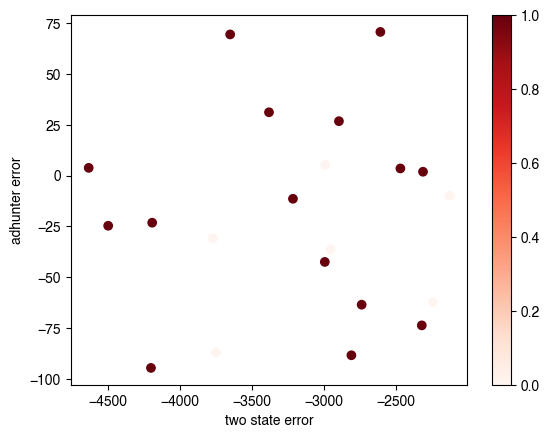

In [405]:
data = tile_data[(tile_data['activity'] > 2000) & (tile_data['two_state_error'] < -2000) & (tile_data['adhunter_error'] > -100) & (tile_data['adhunter_error'] < 100)]
plt.scatter(data['two_state_error'], data['adhunter_error'], c=data['W'], cmap="Reds")
plt.colorbar()

plt.xlabel("two state error")
plt.ylabel('adhunter error')

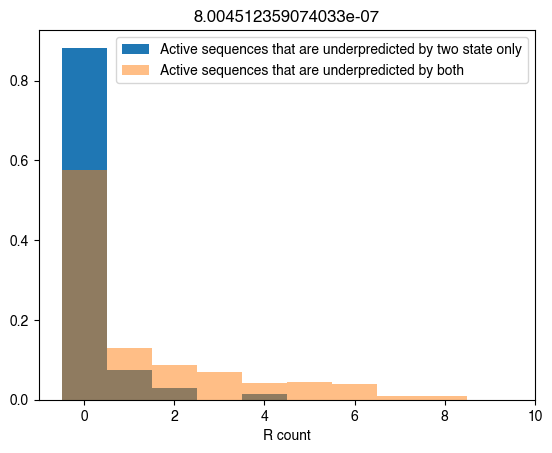

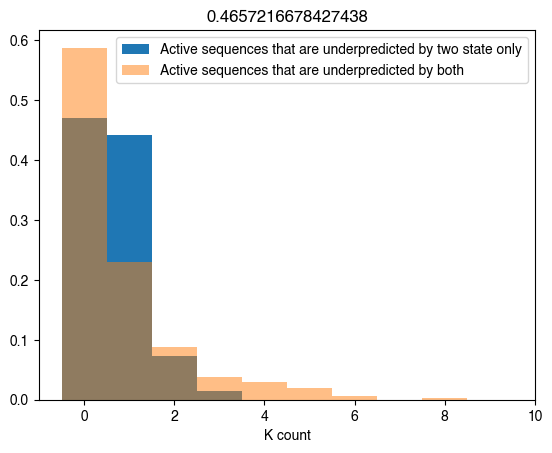

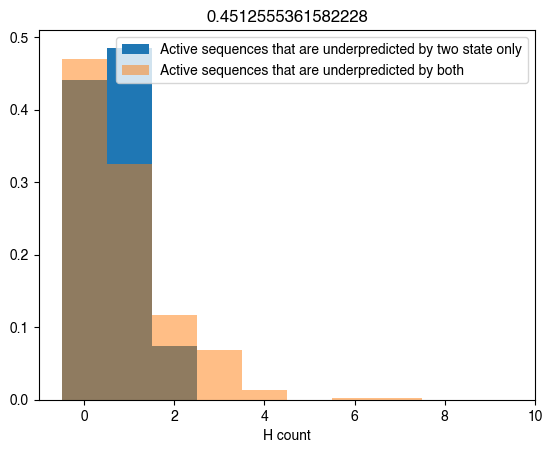

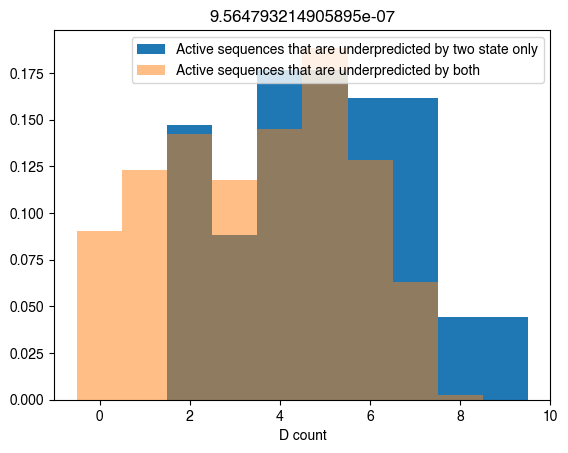

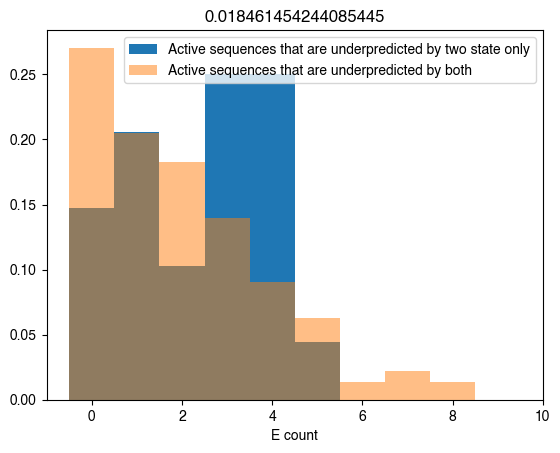

...

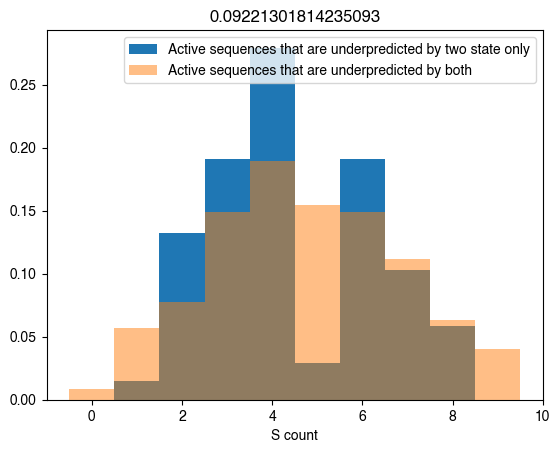

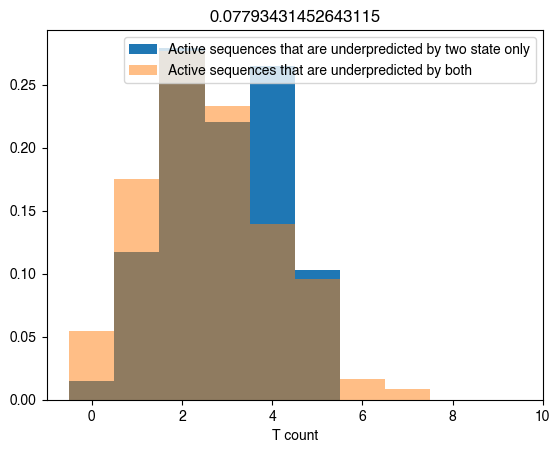

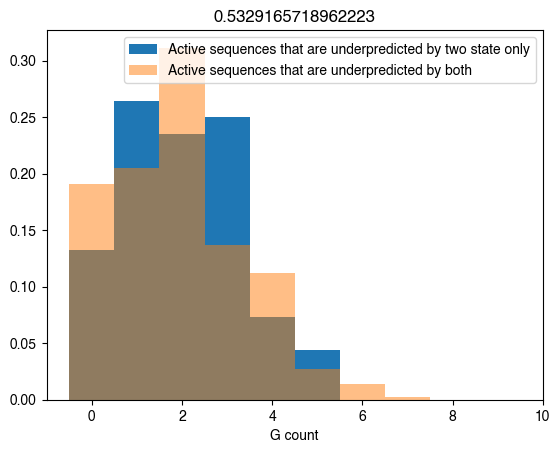

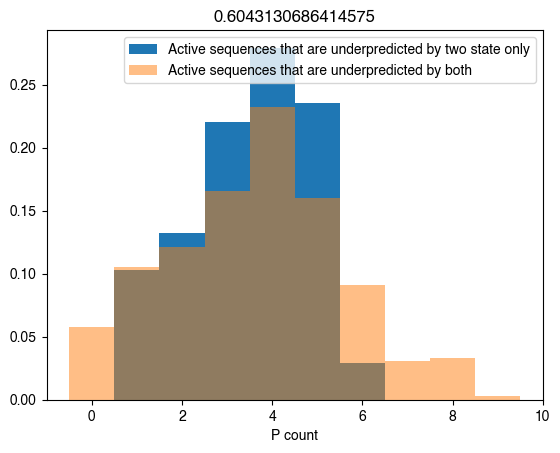

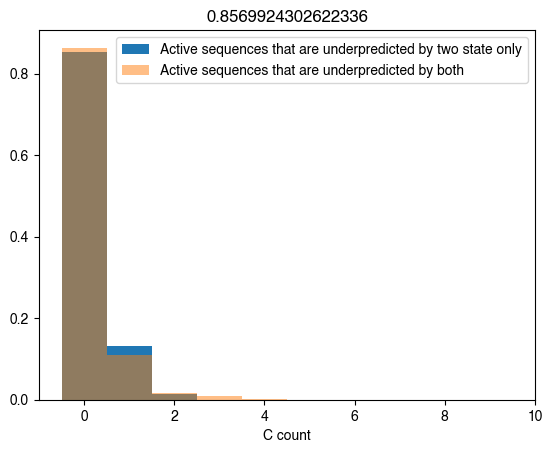

In [393]:
amino_acids = ["R","K","H","D","E","M","I","L","V","A","F","Y","W","Q","N","S","T","G","P","C"]

for aa in amino_acids: 
    bins = np.arange(-0.5, 10.5, 1)
    data1 = tile_data[(tile_data['activity'] > 2000) & (tile_data['two_state_error'] < -2000) & (tile_data['adhunter_error'] > -100)][aa]
    data2 = tile_data[(tile_data['activity'] > 2000)  & (tile_data['two_state_error'] < -2000) & (tile_data['adhunter_error'] < -2000) ][aa]
    plt.hist(data1, density=True, label="Active sequences that are underpredicted by two state only", bins=bins)
    plt.hist(data2, alpha=0.5, density=True, label="Active sequences that are underpredicted by both", bins=bins)

    stat, p = mannwhitneyu(data1, data2)

    plt.title(p)
    plt.xlabel(f"{aa} count")
    plt.legend()
    plt.show()

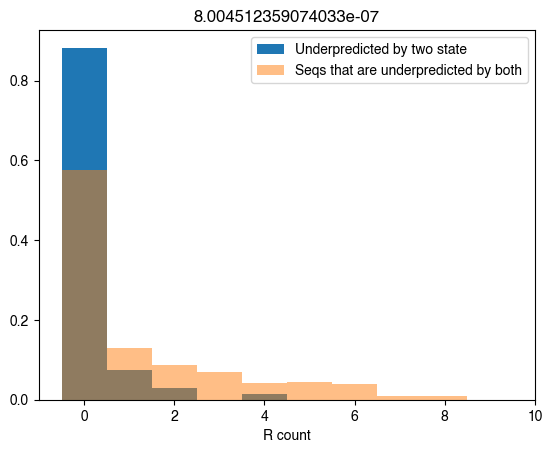

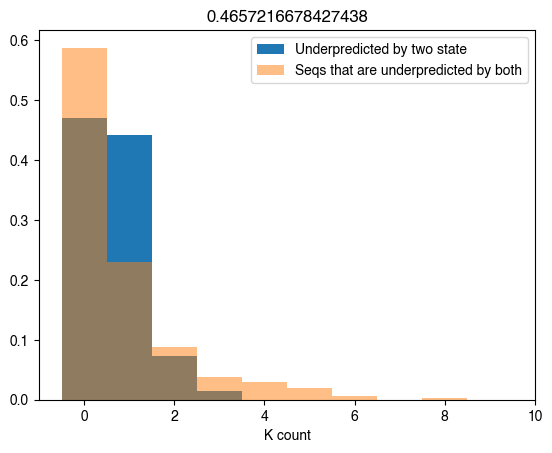

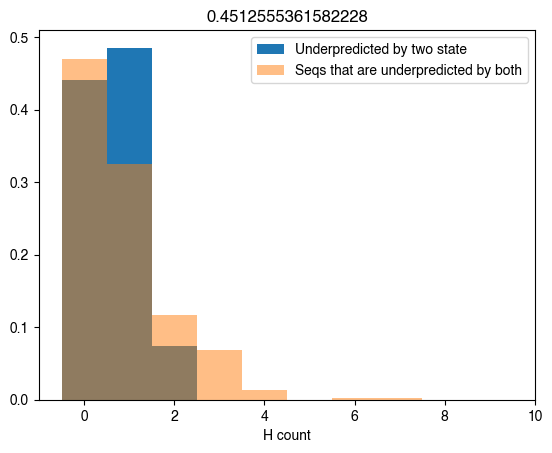

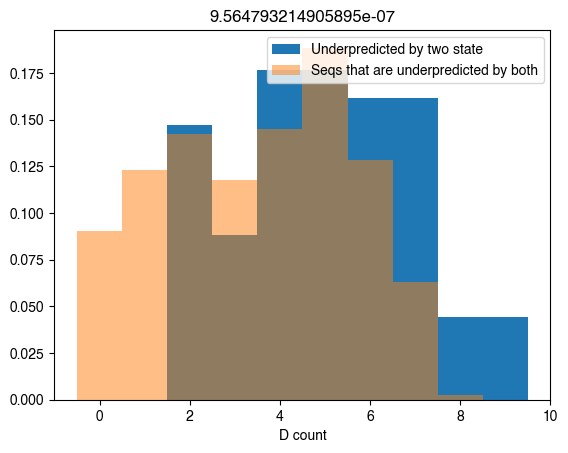

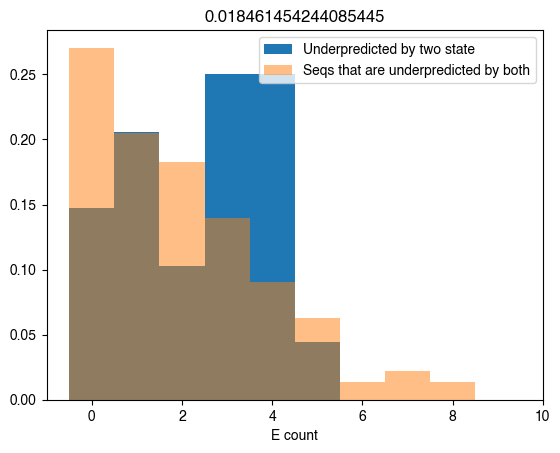

...

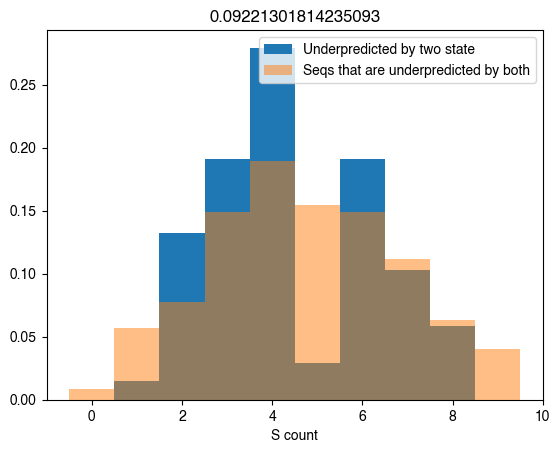

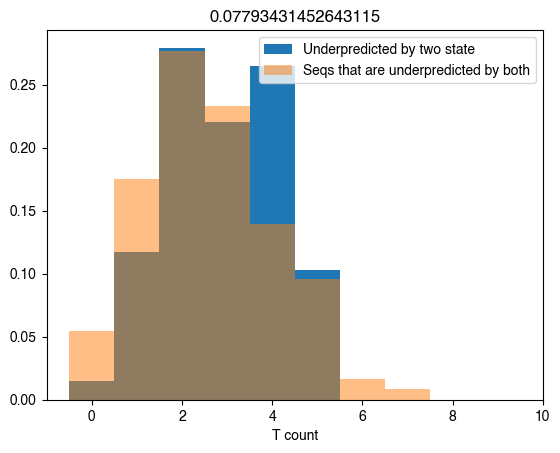

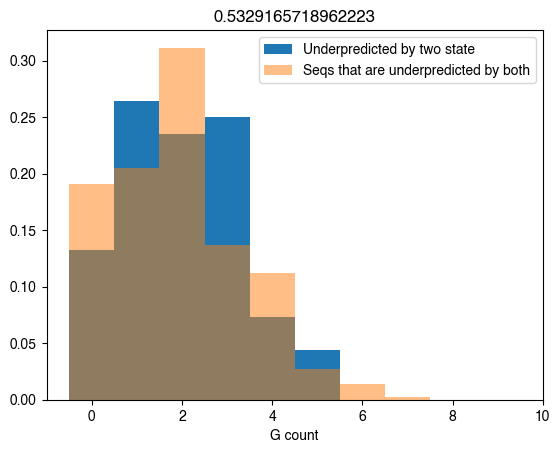

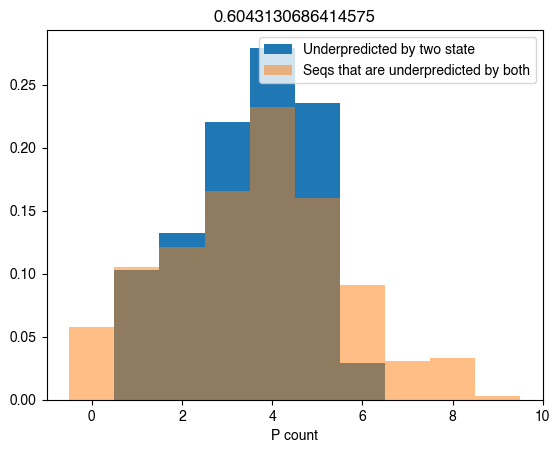

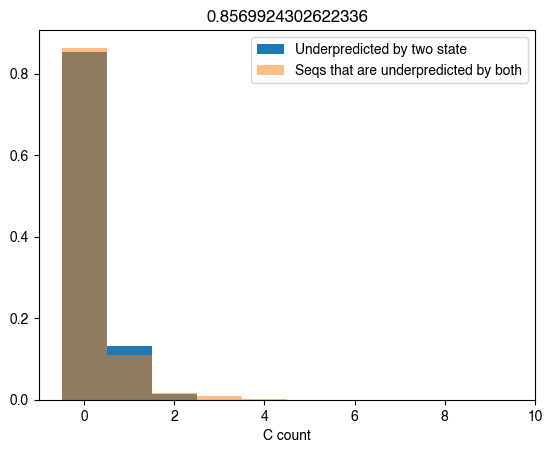

In [392]:
amino_acids = ["R","K","H","D","E","M","I","L","V","A","F","Y","W","Q","N","S","T","G","P","C"]

for aa in amino_acids: 
    bins = np.arange(-0.5, 10.5, 1)
    data1 = tile_data[(tile_data['two_state_error'] < -2000) & (tile_data['adhunter_error'] > -100)][aa] # 
    data2 = tile_data[(tile_data['two_state_error'] < -2000) & (tile_data['adhunter_error'] < -2000) ][aa]
    # data3 = tile_data[ (tile_data['adhunter_error'] < -2000) & (tile_data['two_state_error'] < -100) ][aa]
    # data1 = tile_data[aa]


    plt.hist(data1, density=True, label="Underpredicted by two state", bins=bins)
    plt.hist(data2, alpha=0.5, density=True, label="Seqs that are underpredicted by both", bins=bins)
    # plt.hist(data3, alpha=0.5, density=True, label="Active sequences that are underpredicted by both", bins=bins)

    stat, p = mannwhitneyu(data1, data2)

    plt.title(p)
    plt.xlabel(f"{aa} count")
    plt.legend()
    plt.show()

In [330]:
tile_data[(tile_data['activity'] > 2000) & (tile_data['adhunter_error'] > -2000)]["E"].value_counts()

E
1     1683
2     1446
0     1118
3      838
4      555
5      294
6      114
7       55
8       25
9        5
10       2
Name: count, dtype: int64

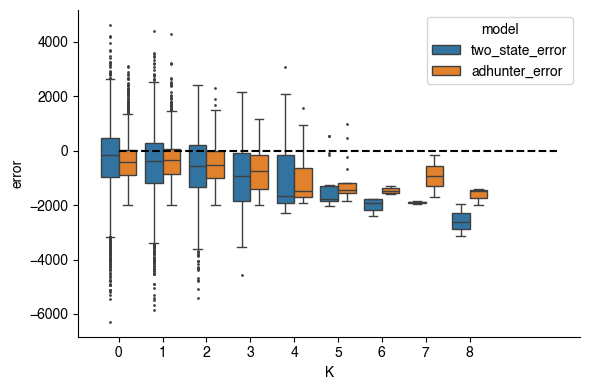

In [328]:
# reshape to long format
long_df = tile_data[(tile_data['activity'] > 2000) & (tile_data['adhunter_error'] > -2000)].melt(
    id_vars='K',
    value_vars=['two_state_error', 'adhunter_error'],
    var_name='model',
    value_name='error'
)

plt.figure(figsize=(6, 4))
sns.boxplot(
    data=long_df,
    x='K',
    y='error',
    hue='model',
    fliersize=1
)

plt.hlines(0, 0, 10, linestyles='--', color='black')
sns.despine()
plt.tight_layout()


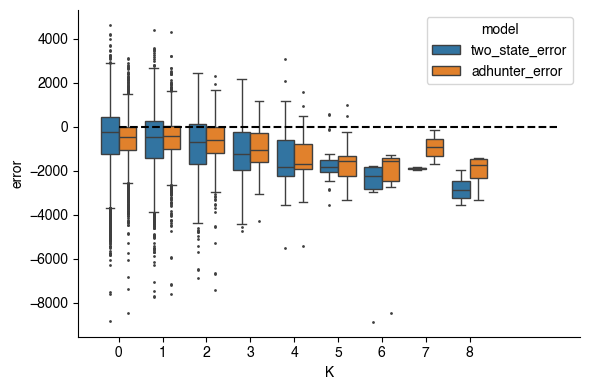

In [325]:
# reshape to long format
long_df = tile_data[tile_data['activity'] > 2000].melt(
    id_vars='K',
    value_vars=['two_state_error', 'adhunter_error'],
    var_name='model',
    value_name='error'
)

plt.figure(figsize=(6, 4))
sns.boxplot(
    data=long_df,
    x='K',
    y='error',
    hue='model',
    fliersize=1
)

plt.hlines(0, 0, 10, linestyles='--', color='black')
sns.despine()
plt.tight_layout()


ValueError: Length of list vectors must match length of `data` when both are used, but `data` has length 6640 and the vector passed to `x` has length 2.

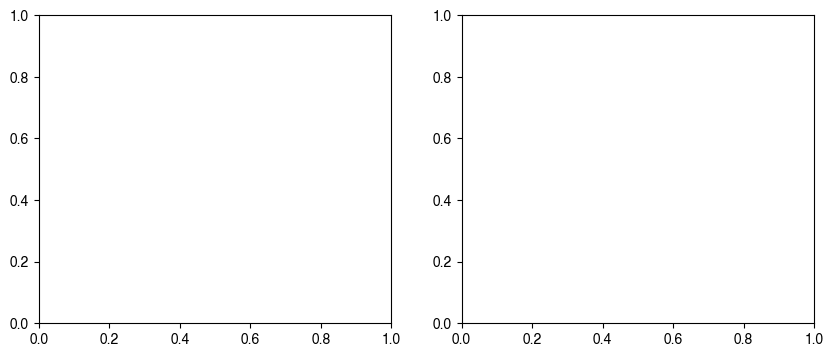

In [321]:
# Hypothesis: ADHunter weights negative charge less than two-state
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

sns.boxplot(data = tile_data[tile_data['activity'] > 2000], y=['two_state_error', 'adhunter_error'], x=['E',"E"], ax=axs[0])
# sns.boxplot(data = tile_data[tile_data['activity'] > 2000], y=', x='E', ax=axs[1])
sns.despine()